In [1]:
import time
import torch
import torch.nn as nn
import numpy as np
import scipy.ndimage
import scipy.io
import matplotlib.pyplot as plt
import deepwave
from deepwave import scalar
from misfit import *
import warnings
from utils import *
device = torch.device('cuda:4')
warnings.filterwarnings("ignore", category=UserWarning)  

In [2]:
# Set parameters
freq = 6
dx = 25.0
dt = 0.004 # 4ms
nz = 117
nx = 567
nt = int(6 / dt) # 2s
peak_time = 1.5 / freq

num_dims = 2
source_depth = 2
receiver_depth = 2
n_sources_per_shot = 1

d_source = 19
first_source = 9

d_receiver = 2
first_receiver = 0

n_shots = len(range(first_source, nx-1, d_source))
n_receivers_per_shot = len(range(first_receiver, nx, d_receiver))



# source_locations
source_locations = torch.zeros(n_shots, n_sources_per_shot, 2,
                               dtype=torch.long)
source_locations[..., 1] = source_depth
source_locations[:, 0, 0] = (torch.arange(n_shots) * d_source +
                             first_source)
# receiver_locations
receiver_locations = torch.zeros(n_shots, n_receivers_per_shot, 2,
                                 dtype=torch.long)
receiver_locations[..., 1] = receiver_depth
receiver_locations[:, :, 0] = (
    (torch.arange(n_receivers_per_shot) * d_receiver +
     first_receiver)
    .repeat(n_shots, 1)
)
# Load ricker wavelet, frequencies below 3 Hz are muted
from scipy.io import loadmat, savemat
r = loadmat('wavelet')
ricker = torch.tensor(r['wavelet'])[0]

source_amplitudes_true = (
    ricker
    .repeat(n_shots, n_sources_per_shot, 1)
    .to(device)
)

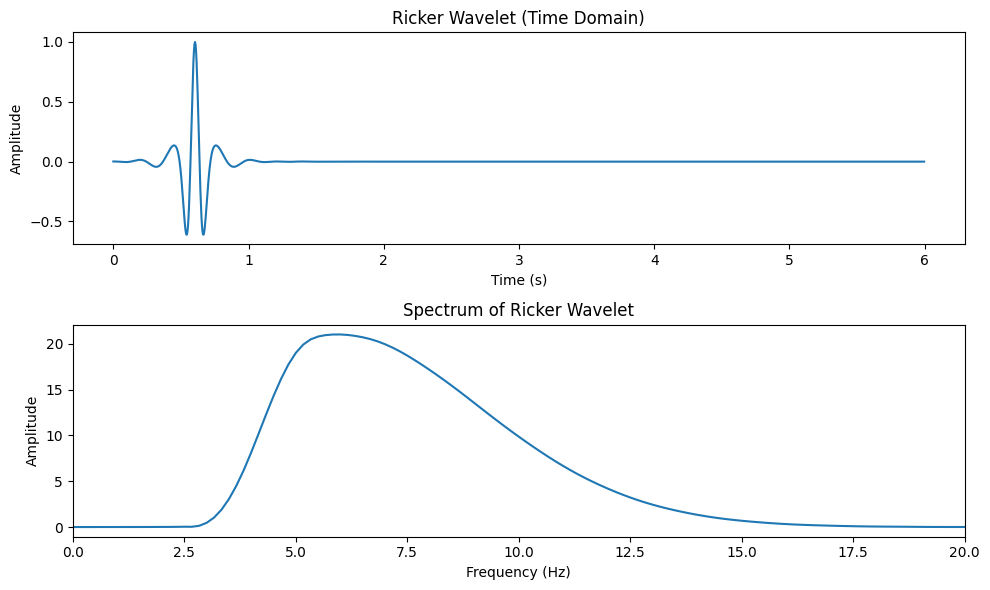

In [3]:
t_max = nt * dt  
t = np.arange(0, t_max, dt)  

wavelet = ricker.numpy()


n = len(wavelet)
f = np.fft.fftfreq(n, dt)  
f = np.fft.fftshift(f)  
wavelet_freq = np.abs(np.fft.fftshift(np.fft.fft(wavelet))) 


plt.figure(figsize=(10, 6))


plt.subplot(2, 1, 1)
plt.plot(t, wavelet)
plt.title('Ricker Wavelet (Time Domain)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')


plt.subplot(2, 1, 2)
plt.plot(f, wavelet_freq)
plt.title('Spectrum of Ricker Wavelet')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.xlim([0, 20])  

plt.tight_layout()
plt.show()

In [4]:
# load true model
v = scipy.io.loadmat('True.mat')
model_true = v['True']
model_true = torch.Tensor(model_true) # Convert to a PyTorch Tensor

out = scalar(
    model_true.T.to(device), dx, dt,
    source_amplitudes=source_amplitudes_true.to(device),
    source_locations=source_locations.to(device),
    receiver_locations=receiver_locations.to(device),
    pml_freq=freq,)[-1].permute(0, 2, 1)

receiver_amplitudes_true = out

-1.198324122428894 1.1732336473464953


(array([0., 1., 2., 3., 4., 5., 6.]),
 [Text(0, 0.0, '0'),
  Text(0, 1.0, '1'),
  Text(0, 2.0, '2'),
  Text(0, 3.0, '3'),
  Text(0, 4.0, '4'),
  Text(0, 5.0, '5'),
  Text(0, 6.0, '6')])

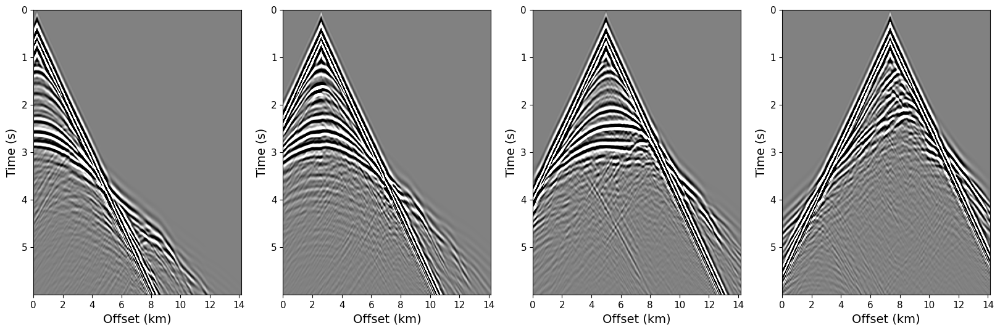

In [5]:
vmin, vmax = np.percentile(receiver_amplitudes_true[1].cpu().numpy(), [4,96])
print(vmin, vmax )
plt.style.use('default')
plt.figure(figsize=(20,6))
plt.subplot(1,4,1)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[0].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,4,2)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[5].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,4,3)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[10].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,4,4)
ax = plt.gca()
im = ax.imshow(receiver_amplitudes_true[15].cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Offset (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
# plt.savefig('data.jpeg', dpi=400)

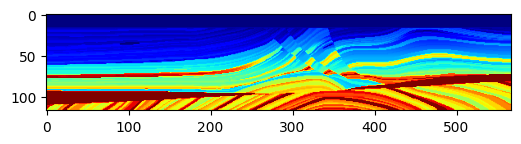

In [6]:
# plt.imshow(model_true.cpu().detach().numpy())
plt.figure(figsize=(6, 4))
plt.imshow(model_true.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,
           cmap='jet')
plt.show()

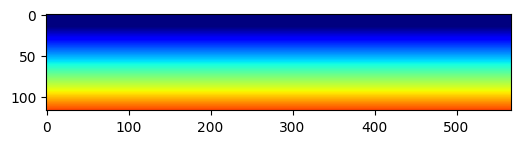

In [7]:
# Create initial model for inversion
model_init = get_linear_vel_model(v['True'],vp_min=1.5e3,vp_max=4.0e3,mask_depth = 15)
model_init = torch.Tensor(model_init)

model = model_init.clone().to(device)
model.requires_grad = True

# Create initial source amplitude for inversion
source_amplitudes = source_amplitudes_true

mask = torch.ones_like(model)
mask[:15, :] = 0


plt.figure(figsize=(6, 4))
plt.imshow(model_init.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,
           cmap='jet')
plt.show()

In [8]:
# Set-up inversion
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam([{'params': [model], 'lr': 20, 'weight_decay':0e-11},
                             ]) 
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=500, gamma=0.8, last_epoch=-1)

criterion_data = Misfit_envelope(dt=dt,p=1,instaneous_phase=False)

Epoch: 0 Loss:  39032.392578125 model_loss:  225149.23
Epoch: 1 Loss:  30359.4111328125 model_loss:  227106.19
Epoch: 2 Loss:  25064.96875 model_loss:  229944.0
Epoch: 3 Loss:  21636.30078125 model_loss:  233513.56
Epoch: 4 Loss:  19220.3857421875 model_loss:  237585.66
Epoch: 5 Loss:  17543.0888671875 model_loss:  241849.45
Epoch: 6 Loss:  16448.3388671875 model_loss:  246011.11
Epoch: 7 Loss:  15680.82861328125 model_loss:  249857.94
Epoch: 8 Loss:  15001.6640625 model_loss:  253261.73
Epoch: 9 Loss:  14307.4990234375 model_loss:  256165.28
Epoch: 10 Loss:  13614.4599609375 model_loss:  258571.25


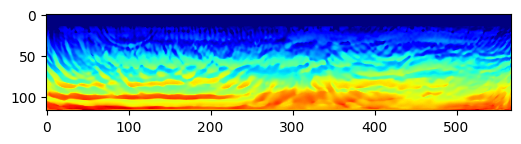

Epoch: 11 Loss:  12980.5224609375 model_loss:  260514.03
Epoch: 12 Loss:  12404.1611328125 model_loss:  262054.81
Epoch: 13 Loss:  11848.009765625 model_loss:  263300.12
Epoch: 14 Loss:  11328.298828125 model_loss:  264372.25
Epoch: 15 Loss:  10882.63134765625 model_loss:  265370.9
Epoch: 16 Loss:  10507.2138671875 model_loss:  266362.4
Epoch: 17 Loss:  10166.681640625 model_loss:  267378.72
Epoch: 18 Loss:  9850.16162109375 model_loss:  268423.56
Epoch: 19 Loss:  9565.9404296875 model_loss:  269484.06
Epoch: 20 Loss:  9306.2529296875 model_loss:  270544.25


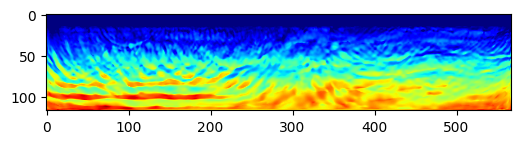

Epoch: 21 Loss:  9061.36962890625 model_loss:  271601.7
Epoch: 22 Loss:  8838.25048828125 model_loss:  272654.9
Epoch: 23 Loss:  8634.13916015625 model_loss:  273689.97
Epoch: 24 Loss:  8438.3896484375 model_loss:  274670.88
Epoch: 25 Loss:  8252.692138671875 model_loss:  275564.12
Epoch: 26 Loss:  8078.328369140625 model_loss:  276363.03
Epoch: 27 Loss:  7910.186767578125 model_loss:  277090.2
Epoch: 28 Loss:  7754.02099609375 model_loss:  277787.6
Epoch: 29 Loss:  7609.702392578125 model_loss:  278487.0
Epoch: 30 Loss:  7474.624267578125 model_loss:  279196.38


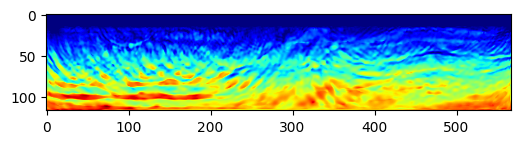

Epoch: 31 Loss:  7348.92822265625 model_loss:  279908.4
Epoch: 32 Loss:  7229.86865234375 model_loss:  280615.66
Epoch: 33 Loss:  7119.147216796875 model_loss:  281309.6
Epoch: 34 Loss:  7015.422119140625 model_loss:  281985.62
Epoch: 35 Loss:  6916.154296875 model_loss:  282643.47
Epoch: 36 Loss:  6822.791748046875 model_loss:  283284.56
Epoch: 37 Loss:  6734.944580078125 model_loss:  283917.12
Epoch: 38 Loss:  6652.76953125 model_loss:  284553.97
Epoch: 39 Loss:  6575.14111328125 model_loss:  285206.34
Epoch: 40 Loss:  6501.132080078125 model_loss:  285876.22


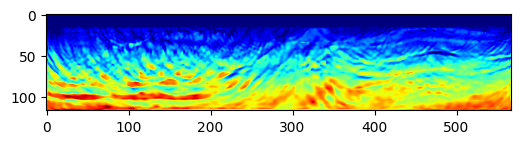

Epoch: 41 Loss:  6430.71923828125 model_loss:  286558.66
Epoch: 42 Loss:  6363.62646484375 model_loss:  287249.5
Epoch: 43 Loss:  6300.263671875 model_loss:  287946.5
Epoch: 44 Loss:  6240.060791015625 model_loss:  288644.34
Epoch: 45 Loss:  6182.6142578125 model_loss:  289334.12
Epoch: 46 Loss:  6127.620361328125 model_loss:  290013.6
Epoch: 47 Loss:  6075.005859375 model_loss:  290689.84
Epoch: 48 Loss:  6024.546630859375 model_loss:  291370.34
Epoch: 49 Loss:  5975.78955078125 model_loss:  292054.0
Epoch: 50 Loss:  5928.590087890625 model_loss:  292736.3


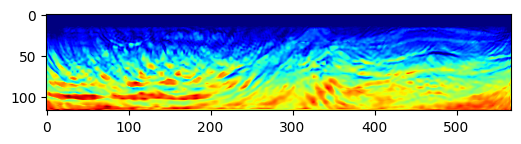

Epoch: 51 Loss:  5882.76513671875 model_loss:  293416.5
Epoch: 52 Loss:  5838.160888671875 model_loss:  294095.06
Epoch: 53 Loss:  5794.23095703125 model_loss:  294769.44
Epoch: 54 Loss:  5750.389404296875 model_loss:  295440.75
Epoch: 55 Loss:  5706.11865234375 model_loss:  296118.34
Epoch: 56 Loss:  5661.7216796875 model_loss:  296808.72
Epoch: 57 Loss:  5617.846435546875 model_loss:  297509.34
Epoch: 58 Loss:  5575.1708984375 model_loss:  298214.4
Epoch: 59 Loss:  5534.204833984375 model_loss:  298924.78
Epoch: 60 Loss:  5494.90283203125 model_loss:  299640.34


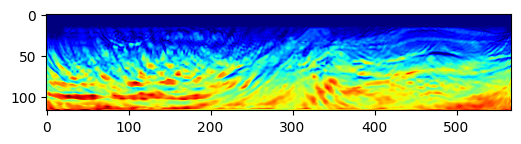

Epoch: 61 Loss:  5456.857177734375 model_loss:  300353.72
Epoch: 62 Loss:  5419.578125 model_loss:  301055.34
Epoch: 63 Loss:  5382.94775390625 model_loss:  301738.56
Epoch: 64 Loss:  5347.14111328125 model_loss:  302399.62
Epoch: 65 Loss:  5312.37451171875 model_loss:  303038.72
Epoch: 66 Loss:  5278.5791015625 model_loss:  303660.75
Epoch: 67 Loss:  5245.716064453125 model_loss:  304274.44
Epoch: 68 Loss:  5213.807861328125 model_loss:  304888.38
Epoch: 69 Loss:  5182.93115234375 model_loss:  305506.5
Epoch: 70 Loss:  5153.001953125 model_loss:  306127.06


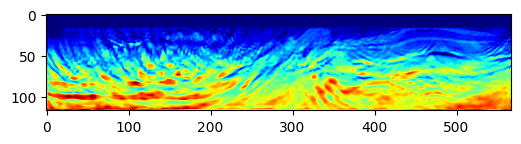

Epoch: 71 Loss:  5123.94091796875 model_loss:  306745.88
Epoch: 72 Loss:  5095.760498046875 model_loss:  307355.97
Epoch: 73 Loss:  5068.379638671875 model_loss:  307951.9
Epoch: 74 Loss:  5041.697509765625 model_loss:  308528.9
Epoch: 75 Loss:  5015.694580078125 model_loss:  309079.03
Epoch: 76 Loss:  4990.4521484375 model_loss:  309593.9
Epoch: 77 Loss:  4965.94775390625 model_loss:  310068.47
Epoch: 78 Loss:  4942.087158203125 model_loss:  310502.28
Epoch: 79 Loss:  4918.769287109375 model_loss:  310901.72
Epoch: 80 Loss:  4895.9765625 model_loss:  311278.4


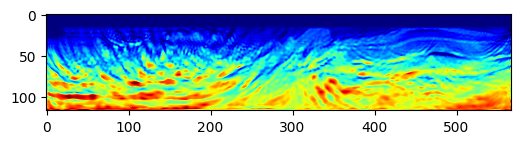

Epoch: 81 Loss:  4873.689208984375 model_loss:  311643.44
Epoch: 82 Loss:  4851.8701171875 model_loss:  312003.03
Epoch: 83 Loss:  4830.508056640625 model_loss:  312358.47
Epoch: 84 Loss:  4809.6181640625 model_loss:  312707.47
Epoch: 85 Loss:  4789.185791015625 model_loss:  313045.72
Epoch: 86 Loss:  4769.186767578125 model_loss:  313370.6
Epoch: 87 Loss:  4749.560546875 model_loss:  313682.12
Epoch: 88 Loss:  4730.300048828125 model_loss:  313983.72
Epoch: 89 Loss:  4711.439208984375 model_loss:  314279.7
Epoch: 90 Loss:  4692.993408203125 model_loss:  314575.88


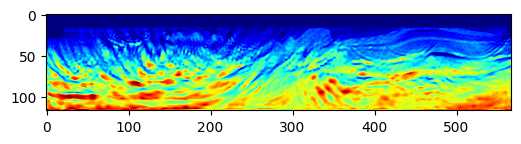

Epoch: 91 Loss:  4674.953369140625 model_loss:  314878.25
Epoch: 92 Loss:  4657.3486328125 model_loss:  315190.25
Epoch: 93 Loss:  4640.1728515625 model_loss:  315513.28
Epoch: 94 Loss:  4623.394287109375 model_loss:  315844.7
Epoch: 95 Loss:  4606.97412109375 model_loss:  316181.03
Epoch: 96 Loss:  4590.8603515625 model_loss:  316520.1
Epoch: 97 Loss:  4575.015869140625 model_loss:  316862.12
Epoch: 98 Loss:  4559.45751953125 model_loss:  317208.88
Epoch: 99 Loss:  4544.17724609375 model_loss:  317560.84
Epoch: 100 Loss:  4529.115234375 model_loss:  317918.9


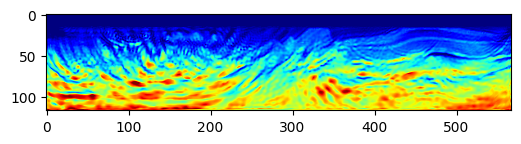

Epoch: 101 Loss:  4514.2490234375 model_loss:  318282.66
Epoch: 102 Loss:  4499.639892578125 model_loss:  318650.7
Epoch: 103 Loss:  4485.318359375 model_loss:  319021.47
Epoch: 104 Loss:  4471.32080078125 model_loss:  319394.78
Epoch: 105 Loss:  4457.6591796875 model_loss:  319771.9
Epoch: 106 Loss:  4444.3359375 model_loss:  320153.78
Epoch: 107 Loss:  4431.303955078125 model_loss:  320540.2
Epoch: 108 Loss:  4418.539794921875 model_loss:  320930.3
Epoch: 109 Loss:  4406.035400390625 model_loss:  321323.22
Epoch: 110 Loss:  4393.77392578125 model_loss:  321718.8


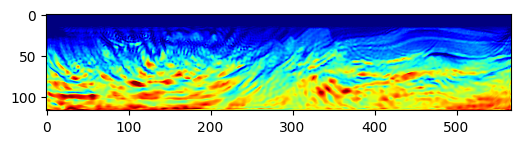

Epoch: 111 Loss:  4381.728515625 model_loss:  322118.34
Epoch: 112 Loss:  4369.896728515625 model_loss:  322523.7
Epoch: 113 Loss:  4358.26904296875 model_loss:  322936.56
Epoch: 114 Loss:  4346.85400390625 model_loss:  323357.72
Epoch: 115 Loss:  4335.66552734375 model_loss:  323785.97
Epoch: 116 Loss:  4324.71533203125 model_loss:  324218.9
Epoch: 117 Loss:  4313.98583984375 model_loss:  324653.6
Epoch: 118 Loss:  4303.468017578125 model_loss:  325087.2
Epoch: 119 Loss:  4293.14599609375 model_loss:  325517.72
Epoch: 120 Loss:  4282.999755859375 model_loss:  325944.28


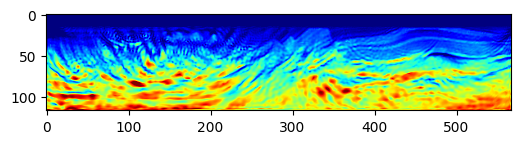

Epoch: 121 Loss:  4273.01416015625 model_loss:  326366.78
Epoch: 122 Loss:  4263.185302734375 model_loss:  326785.72
Epoch: 123 Loss:  4253.50830078125 model_loss:  327200.88
Epoch: 124 Loss:  4243.956298828125 model_loss:  327612.22
Epoch: 125 Loss:  4234.51123046875 model_loss:  328019.6
Epoch: 126 Loss:  4225.17138671875 model_loss:  328423.75
Epoch: 127 Loss:  4215.911865234375 model_loss:  328825.47
Epoch: 128 Loss:  4206.732421875 model_loss:  329224.8
Epoch: 129 Loss:  4197.6064453125 model_loss:  329621.53
Epoch: 130 Loss:  4188.5078125 model_loss:  330015.7


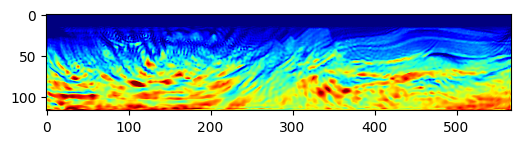

Epoch: 131 Loss:  4179.407958984375 model_loss:  330408.12
Epoch: 132 Loss:  4170.302978515625 model_loss:  330799.84
Epoch: 133 Loss:  4161.12548828125 model_loss:  331191.78
Epoch: 134 Loss:  4151.9287109375 model_loss:  331584.12
Epoch: 135 Loss:  4142.747802734375 model_loss:  331977.3
Epoch: 136 Loss:  4150.01123046875 model_loss:  332363.0
Epoch: 137 Loss:  4155.910400390625 model_loss:  332724.2
Epoch: 138 Loss:  4146.8701171875 model_loss:  333078.4
Epoch: 139 Loss:  4137.0498046875 model_loss:  333440.22
Epoch: 140 Loss:  4126.919921875 model_loss:  333799.53


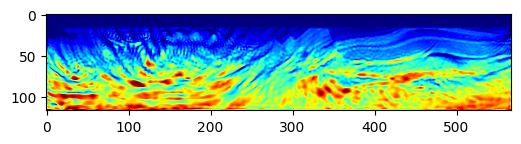

Epoch: 141 Loss:  4118.14794921875 model_loss:  334151.66
Epoch: 142 Loss:  4108.9462890625 model_loss:  334506.97
Epoch: 143 Loss:  4099.379638671875 model_loss:  334862.8
Epoch: 144 Loss:  4090.78466796875 model_loss:  335218.38
Epoch: 145 Loss:  4081.8934326171875 model_loss:  335581.8
Epoch: 146 Loss:  4072.68896484375 model_loss:  335945.97
Epoch: 147 Loss:  4063.9508056640625 model_loss:  336303.47
Epoch: 148 Loss:  4055.279296875 model_loss:  336659.47
Epoch: 149 Loss:  4046.7803955078125 model_loss:  337009.78
Epoch: 150 Loss:  4038.5428466796875 model_loss:  337344.88


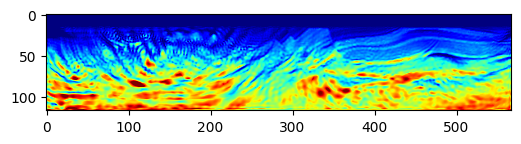

Epoch: 151 Loss:  4029.9405517578125 model_loss:  337667.06
Epoch: 152 Loss:  4021.569091796875 model_loss:  337978.78
Epoch: 153 Loss:  4013.7110595703125 model_loss:  338277.8
Epoch: 154 Loss:  4005.666748046875 model_loss:  338563.78
Epoch: 155 Loss:  3997.697998046875 model_loss:  338835.7
Epoch: 156 Loss:  3990.1109619140625 model_loss:  339093.75
Epoch: 157 Loss:  3982.3701171875 model_loss:  339339.94
Epoch: 158 Loss:  3974.64306640625 model_loss:  339573.84
Epoch: 159 Loss:  3967.188720703125 model_loss:  339796.47
Epoch: 160 Loss:  3959.717041015625 model_loss:  340010.03


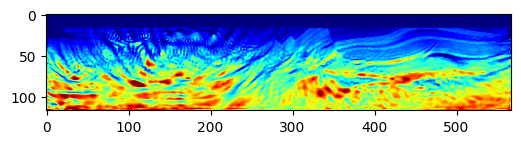

Epoch: 161 Loss:  3952.2857666015625 model_loss:  340214.06
Epoch: 162 Loss:  3945.003662109375 model_loss:  340409.0
Epoch: 163 Loss:  3937.7344970703125 model_loss:  340595.0
Epoch: 164 Loss:  3930.5570068359375 model_loss:  340768.03
Epoch: 165 Loss:  3923.439453125 model_loss:  340926.94
Epoch: 166 Loss:  3916.29248046875 model_loss:  341073.8
Epoch: 167 Loss:  3909.183349609375 model_loss:  341209.56
Epoch: 168 Loss:  3902.025390625 model_loss:  341335.2
Epoch: 169 Loss:  3894.709716796875 model_loss:  341451.88
Epoch: 170 Loss:  3887.2760009765625 model_loss:  341560.62


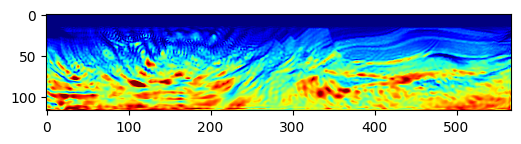

Epoch: 171 Loss:  3879.5499267578125 model_loss:  341662.88
Epoch: 172 Loss:  3871.626953125 model_loss:  341759.7
Epoch: 173 Loss:  3863.7113037109375 model_loss:  341849.62
Epoch: 174 Loss:  3855.78759765625 model_loss:  341930.1
Epoch: 175 Loss:  3847.9154052734375 model_loss:  341999.1
Epoch: 176 Loss:  3840.1575927734375 model_loss:  342057.06
Epoch: 177 Loss:  3832.422607421875 model_loss:  342105.47
Epoch: 178 Loss:  3824.7169189453125 model_loss:  342145.47
Epoch: 179 Loss:  3817.06494140625 model_loss:  342178.78
Epoch: 180 Loss:  3809.412841796875 model_loss:  342207.38


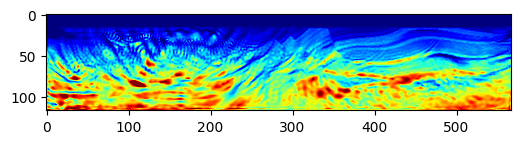

Epoch: 181 Loss:  3801.7685546875 model_loss:  342232.47
Epoch: 182 Loss:  3794.1658935546875 model_loss:  342254.06
Epoch: 183 Loss:  3786.616455078125 model_loss:  342271.6
Epoch: 184 Loss:  3779.1368408203125 model_loss:  342284.62
Epoch: 185 Loss:  3771.7335205078125 model_loss:  342293.22
Epoch: 186 Loss:  3764.374267578125 model_loss:  342297.8
Epoch: 187 Loss:  3757.037353515625 model_loss:  342297.44
Epoch: 188 Loss:  3749.6683349609375 model_loss:  342291.75
Epoch: 189 Loss:  3742.25634765625 model_loss:  342280.8
Epoch: 190 Loss:  3734.8201904296875 model_loss:  342264.4


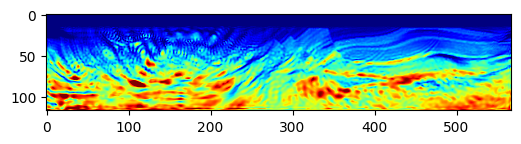

Epoch: 191 Loss:  3727.316650390625 model_loss:  342243.16
Epoch: 192 Loss:  3719.781005859375 model_loss:  342218.16
Epoch: 193 Loss:  3712.236328125 model_loss:  342190.3
Epoch: 194 Loss:  3704.675537109375 model_loss:  342160.03
Epoch: 195 Loss:  3697.123779296875 model_loss:  342127.16
Epoch: 196 Loss:  3689.603271484375 model_loss:  342092.16
Epoch: 197 Loss:  3682.1285400390625 model_loss:  342055.12
Epoch: 198 Loss:  3674.7156982421875 model_loss:  342015.4
Epoch: 199 Loss:  3667.355712890625 model_loss:  341972.44
Epoch: 200 Loss:  3660.010009765625 model_loss:  341926.12


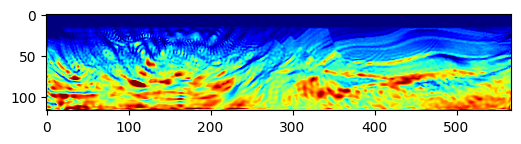

Epoch: 201 Loss:  3652.6895751953125 model_loss:  341877.1
Epoch: 202 Loss:  3645.3800048828125 model_loss:  341826.94
Epoch: 203 Loss:  3638.0728759765625 model_loss:  341776.94
Epoch: 204 Loss:  3630.818115234375 model_loss:  341728.62
Epoch: 205 Loss:  3623.617431640625 model_loss:  341681.6
Epoch: 206 Loss:  3616.4991455078125 model_loss:  341636.38
Epoch: 207 Loss:  3609.4354248046875 model_loss:  341592.28
Epoch: 208 Loss:  3602.427001953125 model_loss:  341548.62
Epoch: 209 Loss:  3595.459228515625 model_loss:  341504.4
Epoch: 210 Loss:  3588.543701171875 model_loss:  341459.34


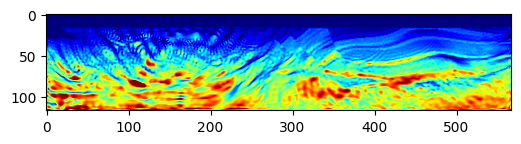

Epoch: 211 Loss:  3581.647216796875 model_loss:  341413.44
Epoch: 212 Loss:  3574.7606201171875 model_loss:  341367.34
Epoch: 213 Loss:  3567.8648681640625 model_loss:  341320.9
Epoch: 214 Loss:  3560.9747314453125 model_loss:  341273.2
Epoch: 215 Loss:  3554.050537109375 model_loss:  341222.06
Epoch: 216 Loss:  3547.128173828125 model_loss:  341167.38
Epoch: 217 Loss:  3540.2056884765625 model_loss:  341108.4
Epoch: 218 Loss:  3533.341552734375 model_loss:  341046.66
Epoch: 219 Loss:  3526.51025390625 model_loss:  340982.44
Epoch: 220 Loss:  3519.7003173828125 model_loss:  340916.22


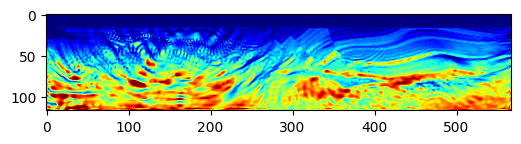

Epoch: 221 Loss:  3512.8690185546875 model_loss:  340848.16
Epoch: 222 Loss:  3506.002197265625 model_loss:  340779.84
Epoch: 223 Loss:  3499.1109619140625 model_loss:  340712.88
Epoch: 224 Loss:  3492.21484375 model_loss:  340648.72
Epoch: 225 Loss:  3485.3214111328125 model_loss:  340586.72
Epoch: 226 Loss:  3478.42822265625 model_loss:  340525.12
Epoch: 227 Loss:  3471.58642578125 model_loss:  340462.44
Epoch: 228 Loss:  3464.7938232421875 model_loss:  340397.97
Epoch: 229 Loss:  3458.11279296875 model_loss:  340329.2
Epoch: 230 Loss:  3451.535400390625 model_loss:  340255.4


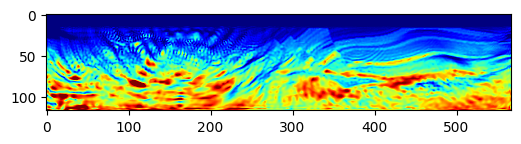

Epoch: 231 Loss:  3445.03564453125 model_loss:  340174.25
Epoch: 232 Loss:  3438.584716796875 model_loss:  340085.12
Epoch: 233 Loss:  3432.1544189453125 model_loss:  339989.9
Epoch: 234 Loss:  3425.7955322265625 model_loss:  339891.0
Epoch: 235 Loss:  3419.451171875 model_loss:  339789.2
Epoch: 236 Loss:  3413.13623046875 model_loss:  339684.78
Epoch: 237 Loss:  3406.75634765625 model_loss:  339575.8
Epoch: 238 Loss:  3400.41650390625 model_loss:  339464.94
Epoch: 239 Loss:  3393.98681640625 model_loss:  339353.06
Epoch: 240 Loss:  3387.6688232421875 model_loss:  339242.16


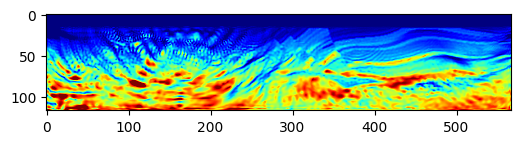

Epoch: 241 Loss:  3381.1917724609375 model_loss:  339127.6
Epoch: 242 Loss:  3374.8631591796875 model_loss:  339012.38
Epoch: 243 Loss:  3368.329345703125 model_loss:  338896.2
Epoch: 244 Loss:  3361.953369140625 model_loss:  338787.56
Epoch: 245 Loss:  3355.396240234375 model_loss:  338684.9
Epoch: 246 Loss:  3348.9212646484375 model_loss:  338593.97
Epoch: 247 Loss:  3342.4033203125 model_loss:  338511.38
Epoch: 248 Loss:  3335.9254150390625 model_loss:  338437.16
Epoch: 249 Loss:  3329.55712890625 model_loss:  338370.25
Epoch: 250 Loss:  3323.197998046875 model_loss:  338307.9


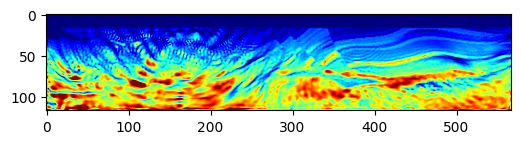

Epoch: 251 Loss:  3316.965576171875 model_loss:  338251.44
Epoch: 252 Loss:  3310.7381591796875 model_loss:  338199.0
Epoch: 253 Loss:  3304.637451171875 model_loss:  338152.1
Epoch: 254 Loss:  3298.6116943359375 model_loss:  338110.28
Epoch: 255 Loss:  3292.669189453125 model_loss:  338073.22
Epoch: 256 Loss:  3286.8448486328125 model_loss:  338040.25
Epoch: 257 Loss:  3281.01708984375 model_loss:  338009.84
Epoch: 258 Loss:  3275.283203125 model_loss:  337982.84
Epoch: 259 Loss:  3269.61474609375 model_loss:  337958.62
Epoch: 260 Loss:  3264.052734375 model_loss:  337938.47


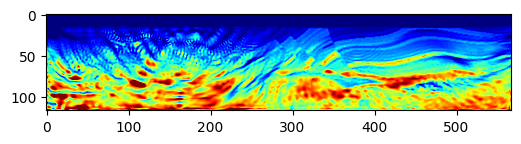

Epoch: 261 Loss:  3258.5889892578125 model_loss:  337923.2
Epoch: 262 Loss:  3253.1846923828125 model_loss:  337913.38
Epoch: 263 Loss:  3247.8795166015625 model_loss:  337908.6
Epoch: 264 Loss:  3242.641845703125 model_loss:  337907.06
Epoch: 265 Loss:  3237.511962890625 model_loss:  337908.0
Epoch: 266 Loss:  3232.447509765625 model_loss:  337911.4
Epoch: 267 Loss:  3227.44677734375 model_loss:  337919.3
Epoch: 268 Loss:  3222.5111083984375 model_loss:  337933.2
Epoch: 269 Loss:  3217.6260986328125 model_loss:  337954.03
Epoch: 270 Loss:  3212.822021484375 model_loss:  337981.66


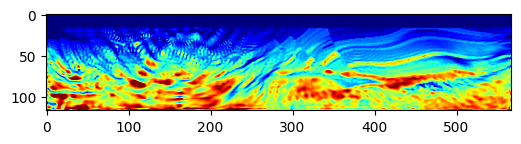

Epoch: 271 Loss:  3208.0712890625 model_loss:  338014.44
Epoch: 272 Loss:  3203.4107666015625 model_loss:  338050.88
Epoch: 273 Loss:  3198.8427734375 model_loss:  338089.56
Epoch: 274 Loss:  3194.3173828125 model_loss:  338130.25
Epoch: 275 Loss:  3189.8826904296875 model_loss:  338173.75
Epoch: 276 Loss:  3185.535400390625 model_loss:  338220.97
Epoch: 277 Loss:  3181.2591552734375 model_loss:  338272.88
Epoch: 278 Loss:  3177.0595703125 model_loss:  338330.5
Epoch: 279 Loss:  3172.913330078125 model_loss:  338394.22
Epoch: 280 Loss:  3168.8140869140625 model_loss:  338463.44


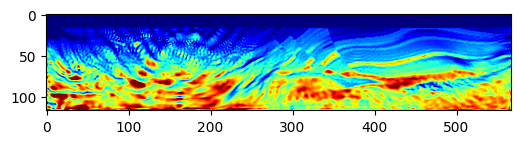

Epoch: 281 Loss:  3164.7364501953125 model_loss:  338537.6
Epoch: 282 Loss:  3160.711181640625 model_loss:  338616.7
Epoch: 283 Loss:  3156.705078125 model_loss:  338700.78
Epoch: 284 Loss:  3152.69970703125 model_loss:  338789.53
Epoch: 285 Loss:  3148.7442626953125 model_loss:  338882.84
Epoch: 286 Loss:  3144.8497314453125 model_loss:  338980.4
Epoch: 287 Loss:  3141.0355224609375 model_loss:  339081.84
Epoch: 288 Loss:  3137.313720703125 model_loss:  339186.72
Epoch: 289 Loss:  3133.7005615234375 model_loss:  339295.03
Epoch: 290 Loss:  3130.1800537109375 model_loss:  339406.03


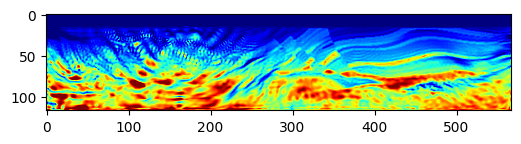

Epoch: 291 Loss:  3126.740478515625 model_loss:  339519.0
Epoch: 292 Loss:  3123.399169921875 model_loss:  339633.22
Epoch: 293 Loss:  3120.146240234375 model_loss:  339747.66
Epoch: 294 Loss:  3116.98193359375 model_loss:  339862.06
Epoch: 295 Loss:  3113.8851318359375 model_loss:  339976.66
Epoch: 296 Loss:  3110.8408203125 model_loss:  340091.5
Epoch: 297 Loss:  3107.855712890625 model_loss:  340206.5
Epoch: 298 Loss:  3104.922119140625 model_loss:  340322.0
Epoch: 299 Loss:  3102.033447265625 model_loss:  340437.9
Epoch: 300 Loss:  3099.168701171875 model_loss:  340554.38


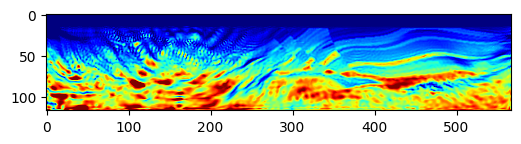

Epoch: 301 Loss:  3096.360595703125 model_loss:  340671.72
Epoch: 302 Loss:  3093.5869140625 model_loss:  340789.94
Epoch: 303 Loss:  3090.8651123046875 model_loss:  340909.06
Epoch: 304 Loss:  3088.18310546875 model_loss:  341029.56
Epoch: 305 Loss:  3085.546630859375 model_loss:  341151.66
Epoch: 306 Loss:  3082.9398193359375 model_loss:  341275.72
Epoch: 307 Loss:  3080.3692626953125 model_loss:  341401.66
Epoch: 308 Loss:  3077.8353271484375 model_loss:  341529.38
Epoch: 309 Loss:  3075.3419189453125 model_loss:  341659.1
Epoch: 310 Loss:  3072.8883056640625 model_loss:  341791.03


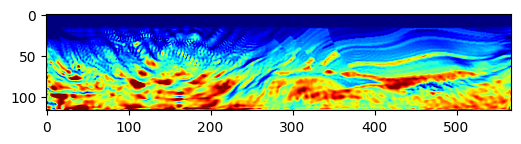

Epoch: 311 Loss:  3070.4677734375 model_loss:  341925.8
Epoch: 312 Loss:  3068.0701904296875 model_loss:  342063.56
Epoch: 313 Loss:  3065.7073974609375 model_loss:  342204.06
Epoch: 314 Loss:  3063.372314453125 model_loss:  342346.9
Epoch: 315 Loss:  3061.0833740234375 model_loss:  342491.75
Epoch: 316 Loss:  3058.831298828125 model_loss:  342638.53
Epoch: 317 Loss:  3056.6162109375 model_loss:  342787.4
Epoch: 318 Loss:  3054.4354248046875 model_loss:  342938.34
Epoch: 319 Loss:  3052.2919921875 model_loss:  343091.12
Epoch: 320 Loss:  3050.190185546875 model_loss:  343245.1


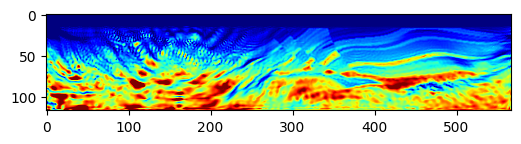

Epoch: 321 Loss:  3048.1153564453125 model_loss:  343399.62
Epoch: 322 Loss:  3046.0771484375 model_loss:  343553.78
Epoch: 323 Loss:  3044.0673828125 model_loss:  343707.28
Epoch: 324 Loss:  3042.0908203125 model_loss:  343860.2
Epoch: 325 Loss:  3040.1400146484375 model_loss:  344012.7
Epoch: 326 Loss:  3038.201904296875 model_loss:  344164.88
Epoch: 327 Loss:  3036.2843017578125 model_loss:  344317.28
Epoch: 328 Loss:  3034.3621826171875 model_loss:  344469.8
Epoch: 329 Loss:  3032.45263671875 model_loss:  344622.84
Epoch: 330 Loss:  3030.5533447265625 model_loss:  344776.03


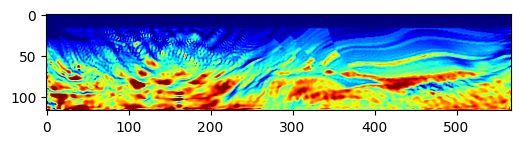

Epoch: 331 Loss:  3028.6761474609375 model_loss:  344928.4
Epoch: 332 Loss:  3026.82177734375 model_loss:  345078.56
Epoch: 333 Loss:  3024.99267578125 model_loss:  345225.6
Epoch: 334 Loss:  3023.1954345703125 model_loss:  345369.3
Epoch: 335 Loss:  3021.4227294921875 model_loss:  345510.28
Epoch: 336 Loss:  3019.6641845703125 model_loss:  345648.94
Epoch: 337 Loss:  3017.9140625 model_loss:  345785.8
Epoch: 338 Loss:  3016.1829833984375 model_loss:  345921.5
Epoch: 339 Loss:  3014.4761962890625 model_loss:  346056.53
Epoch: 340 Loss:  3012.796875 model_loss:  346191.56


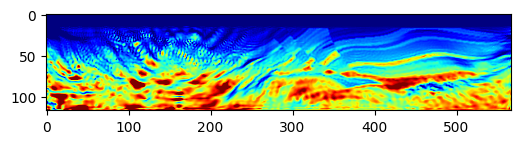

Epoch: 341 Loss:  3011.1396484375 model_loss:  346327.28
Epoch: 342 Loss:  3009.496826171875 model_loss:  346464.22
Epoch: 343 Loss:  3007.884033203125 model_loss:  346602.9
Epoch: 344 Loss:  3006.2886962890625 model_loss:  346743.22
Epoch: 345 Loss:  3004.708984375 model_loss:  346885.0
Epoch: 346 Loss:  3003.1458740234375 model_loss:  347027.4
Epoch: 347 Loss:  3001.59228515625 model_loss:  347169.88
Epoch: 348 Loss:  3000.0606689453125 model_loss:  347311.9
Epoch: 349 Loss:  2998.53271484375 model_loss:  347453.28
Epoch: 350 Loss:  2997.0230712890625 model_loss:  347594.06


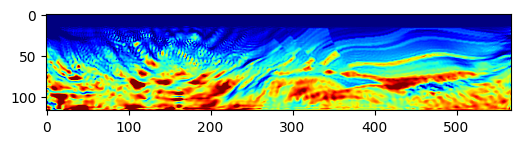

Epoch: 351 Loss:  2995.520751953125 model_loss:  347734.53
Epoch: 352 Loss:  2994.0323486328125 model_loss:  347875.25
Epoch: 353 Loss:  2992.55859375 model_loss:  348016.84
Epoch: 354 Loss:  2991.08154296875 model_loss:  348159.6
Epoch: 355 Loss:  2989.6043701171875 model_loss:  348303.28
Epoch: 356 Loss:  2988.135986328125 model_loss:  348447.4
Epoch: 357 Loss:  2986.6593017578125 model_loss:  348591.53
Epoch: 358 Loss:  2985.1907958984375 model_loss:  348735.16
Epoch: 359 Loss:  2983.725341796875 model_loss:  348878.0
Epoch: 360 Loss:  2982.2703857421875 model_loss:  349020.2


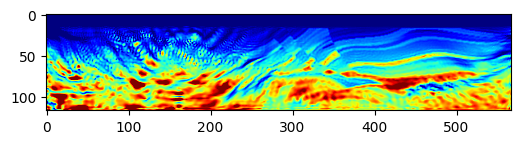

Epoch: 361 Loss:  2980.816650390625 model_loss:  349162.03
Epoch: 362 Loss:  2979.3685302734375 model_loss:  349303.3
Epoch: 363 Loss:  2977.93359375 model_loss:  349443.78
Epoch: 364 Loss:  2976.5015869140625 model_loss:  349583.53
Epoch: 365 Loss:  2975.0819091796875 model_loss:  349722.84
Epoch: 366 Loss:  2973.67333984375 model_loss:  349862.16
Epoch: 367 Loss:  2972.2724609375 model_loss:  350001.56
Epoch: 368 Loss:  2970.8797607421875 model_loss:  350140.94
Epoch: 369 Loss:  2969.495361328125 model_loss:  350279.9
Epoch: 370 Loss:  2968.114990234375 model_loss:  350418.22


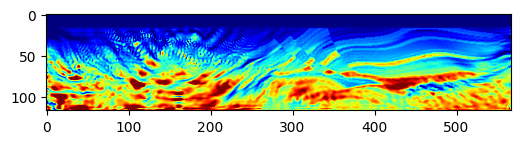

Epoch: 371 Loss:  2966.73583984375 model_loss:  350555.75
Epoch: 372 Loss:  2965.3621826171875 model_loss:  350691.8
Epoch: 373 Loss:  2963.98828125 model_loss:  350825.94
Epoch: 374 Loss:  2962.6170654296875 model_loss:  350957.7
Epoch: 375 Loss:  2961.2470703125 model_loss:  351086.72
Epoch: 376 Loss:  2959.877197265625 model_loss:  351213.03
Epoch: 377 Loss:  2958.506591796875 model_loss:  351336.6
Epoch: 378 Loss:  2957.1358642578125 model_loss:  351458.22
Epoch: 379 Loss:  2955.7813720703125 model_loss:  351578.4
Epoch: 380 Loss:  2954.4315185546875 model_loss:  351697.66


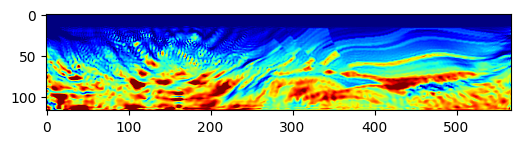

Epoch: 381 Loss:  2953.091552734375 model_loss:  351816.34
Epoch: 382 Loss:  2951.7486572265625 model_loss:  351934.44
Epoch: 383 Loss:  2950.40869140625 model_loss:  352051.8
Epoch: 384 Loss:  2949.0751953125 model_loss:  352168.03
Epoch: 385 Loss:  2947.75146484375 model_loss:  352283.2
Epoch: 386 Loss:  2946.4334716796875 model_loss:  352397.44
Epoch: 387 Loss:  2945.1168212890625 model_loss:  352510.94
Epoch: 388 Loss:  2943.797119140625 model_loss:  352624.06
Epoch: 389 Loss:  2942.4822998046875 model_loss:  352737.2
Epoch: 390 Loss:  2941.1658935546875 model_loss:  352850.72


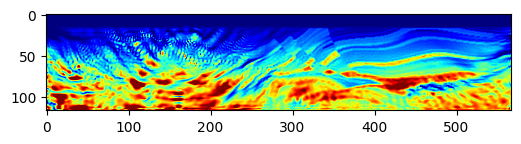

Epoch: 391 Loss:  2939.852294921875 model_loss:  352964.3
Epoch: 392 Loss:  2938.542724609375 model_loss:  353078.06
Epoch: 393 Loss:  2937.2286376953125 model_loss:  353191.6
Epoch: 394 Loss:  2935.9202880859375 model_loss:  353304.84
Epoch: 395 Loss:  2934.59765625 model_loss:  353417.7
Epoch: 396 Loss:  2933.26953125 model_loss:  353529.88
Epoch: 397 Loss:  2931.9403076171875 model_loss:  353641.53
Epoch: 398 Loss:  2930.6123046875 model_loss:  353752.9
Epoch: 399 Loss:  2929.287841796875 model_loss:  353864.28
Epoch: 400 Loss:  2927.9639892578125 model_loss:  353975.75


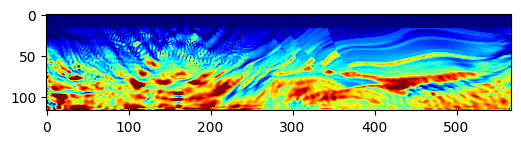

Epoch: 401 Loss:  2926.6446533203125 model_loss:  354087.38
Epoch: 402 Loss:  2925.32275390625 model_loss:  354198.62
Epoch: 403 Loss:  2923.9967041015625 model_loss:  354309.2
Epoch: 404 Loss:  2922.664306640625 model_loss:  354418.53
Epoch: 405 Loss:  2921.3143310546875 model_loss:  354526.44
Epoch: 406 Loss:  2919.9429931640625 model_loss:  354632.8
Epoch: 407 Loss:  2918.542236328125 model_loss:  354737.47
Epoch: 408 Loss:  2917.1146240234375 model_loss:  354840.66
Epoch: 409 Loss:  2915.67041015625 model_loss:  354942.62
Epoch: 410 Loss:  2914.220458984375 model_loss:  355043.44


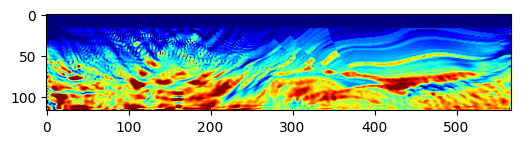

Epoch: 411 Loss:  2912.7720947265625 model_loss:  355142.84
Epoch: 412 Loss:  2911.3272705078125 model_loss:  355240.75
Epoch: 413 Loss:  2909.896240234375 model_loss:  355337.25
Epoch: 414 Loss:  2908.467041015625 model_loss:  355432.4
Epoch: 415 Loss:  2907.05029296875 model_loss:  355525.62
Epoch: 416 Loss:  2905.6361083984375 model_loss:  355616.34
Epoch: 417 Loss:  2904.2303466796875 model_loss:  355704.38
Epoch: 418 Loss:  2902.8223876953125 model_loss:  355789.56
Epoch: 419 Loss:  2901.4266357421875 model_loss:  355872.38
Epoch: 420 Loss:  2900.03662109375 model_loss:  355953.5


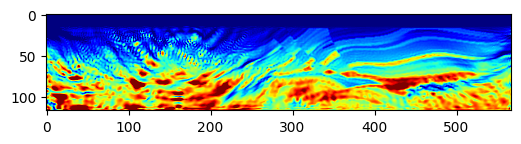

Epoch: 421 Loss:  2898.656494140625 model_loss:  356033.4
Epoch: 422 Loss:  2897.282958984375 model_loss:  356113.12
Epoch: 423 Loss:  2895.9085693359375 model_loss:  356193.44
Epoch: 424 Loss:  2894.541748046875 model_loss:  356275.12
Epoch: 425 Loss:  2893.175537109375 model_loss:  356358.6
Epoch: 426 Loss:  2891.807861328125 model_loss:  356444.16
Epoch: 427 Loss:  2890.451171875 model_loss:  356532.2
Epoch: 428 Loss:  2889.0892333984375 model_loss:  356622.97
Epoch: 429 Loss:  2887.72216796875 model_loss:  356716.47
Epoch: 430 Loss:  2886.3448486328125 model_loss:  356812.5


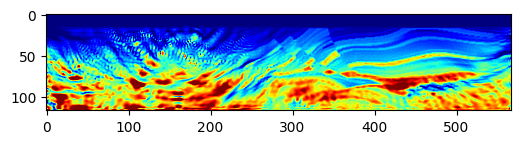

Epoch: 431 Loss:  2884.9554443359375 model_loss:  356910.66
Epoch: 432 Loss:  2883.541015625 model_loss:  357010.2
Epoch: 433 Loss:  2882.100341796875 model_loss:  357110.72
Epoch: 434 Loss:  2880.6529541015625 model_loss:  357212.03
Epoch: 435 Loss:  2879.218017578125 model_loss:  357314.22
Epoch: 436 Loss:  2877.8026123046875 model_loss:  357416.94
Epoch: 437 Loss:  2876.4073486328125 model_loss:  357520.1
Epoch: 438 Loss:  2875.02783203125 model_loss:  357623.25
Epoch: 439 Loss:  2873.666015625 model_loss:  357726.25
Epoch: 440 Loss:  2872.323974609375 model_loss:  357829.28


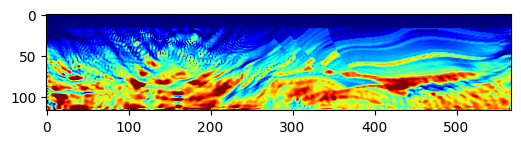

Epoch: 441 Loss:  2870.99267578125 model_loss:  357932.1
Epoch: 442 Loss:  2869.672607421875 model_loss:  358034.72
Epoch: 443 Loss:  2868.350341796875 model_loss:  358137.25
Epoch: 444 Loss:  2867.0242919921875 model_loss:  358239.44
Epoch: 445 Loss:  2865.7099609375 model_loss:  358340.9
Epoch: 446 Loss:  2864.3968505859375 model_loss:  358441.22
Epoch: 447 Loss:  2863.08740234375 model_loss:  358539.94
Epoch: 448 Loss:  2861.7781982421875 model_loss:  358637.44
Epoch: 449 Loss:  2860.463623046875 model_loss:  358734.06
Epoch: 450 Loss:  2859.1629638671875 model_loss:  358830.06


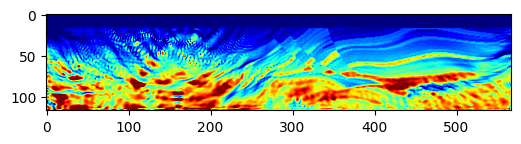

Epoch: 451 Loss:  2857.869873046875 model_loss:  358925.47
Epoch: 452 Loss:  2856.5689697265625 model_loss:  359020.1
Epoch: 453 Loss:  2855.2742919921875 model_loss:  359114.12
Epoch: 454 Loss:  2853.99169921875 model_loss:  359208.06
Epoch: 455 Loss:  2852.725830078125 model_loss:  359302.03
Epoch: 456 Loss:  2851.46044921875 model_loss:  359395.78
Epoch: 457 Loss:  2850.2076416015625 model_loss:  359488.75
Epoch: 458 Loss:  2848.95947265625 model_loss:  359580.97
Epoch: 459 Loss:  2847.7191162109375 model_loss:  359672.72
Epoch: 460 Loss:  2846.4722900390625 model_loss:  359764.62


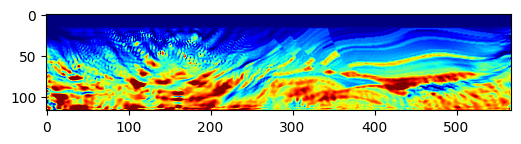

Epoch: 461 Loss:  2845.2342529296875 model_loss:  359856.88
Epoch: 462 Loss:  2843.9874267578125 model_loss:  359949.4
Epoch: 463 Loss:  2842.75 model_loss:  360041.6
Epoch: 464 Loss:  2841.5196533203125 model_loss:  360132.38
Epoch: 465 Loss:  2840.291015625 model_loss:  360220.84
Epoch: 466 Loss:  2839.072265625 model_loss:  360306.34
Epoch: 467 Loss:  2837.862060546875 model_loss:  360388.47
Epoch: 468 Loss:  2836.647216796875 model_loss:  360467.7
Epoch: 469 Loss:  2835.449462890625 model_loss:  360544.6
Epoch: 470 Loss:  2834.2620849609375 model_loss:  360619.78


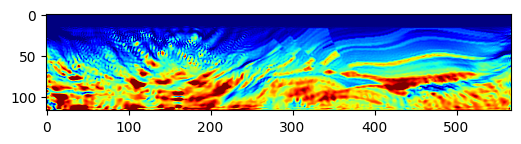

Epoch: 471 Loss:  2833.0751953125 model_loss:  360693.06
Epoch: 472 Loss:  2831.888916015625 model_loss:  360764.34
Epoch: 473 Loss:  2830.7186279296875 model_loss:  360833.4
Epoch: 474 Loss:  2829.5531005859375 model_loss:  360900.7
Epoch: 475 Loss:  2828.39453125 model_loss:  360966.75
Epoch: 476 Loss:  2827.2406005859375 model_loss:  361032.03
Epoch: 477 Loss:  2826.1005859375 model_loss:  361096.53
Epoch: 478 Loss:  2824.964111328125 model_loss:  361160.03
Epoch: 479 Loss:  2823.837890625 model_loss:  361222.44
Epoch: 480 Loss:  2822.708984375 model_loss:  361283.5


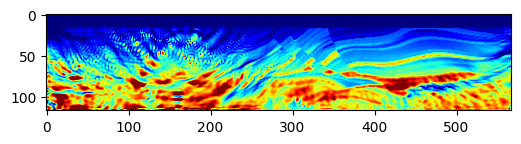

Epoch: 481 Loss:  2821.582763671875 model_loss:  361343.56
Epoch: 482 Loss:  2820.4560546875 model_loss:  361402.5
Epoch: 483 Loss:  2819.343994140625 model_loss:  361459.78
Epoch: 484 Loss:  2818.2454833984375 model_loss:  361514.94
Epoch: 485 Loss:  2817.1558837890625 model_loss:  361567.75
Epoch: 486 Loss:  2816.0780029296875 model_loss:  361618.47
Epoch: 487 Loss:  2815.0050048828125 model_loss:  361667.7
Epoch: 488 Loss:  2813.94482421875 model_loss:  361715.97
Epoch: 489 Loss:  2812.88623046875 model_loss:  361763.72
Epoch: 490 Loss:  2811.8311767578125 model_loss:  361811.53


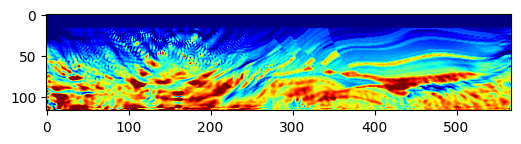

Epoch: 491 Loss:  2810.773193359375 model_loss:  361859.62
Epoch: 492 Loss:  2809.7174072265625 model_loss:  361908.22
Epoch: 493 Loss:  2808.6580810546875 model_loss:  361957.47
Epoch: 494 Loss:  2807.590576171875 model_loss:  362007.28
Epoch: 495 Loss:  2806.520263671875 model_loss:  362057.4
Epoch: 496 Loss:  2805.445556640625 model_loss:  362107.53
Epoch: 497 Loss:  2804.37548828125 model_loss:  362157.62
Epoch: 498 Loss:  2803.3037109375 model_loss:  362207.72
Epoch: 499 Loss:  2802.229248046875 model_loss:  362257.34
Epoch: 500 Loss:  2801.1519775390625 model_loss:  362306.4


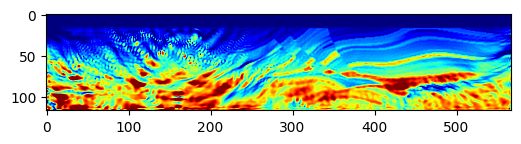

Epoch: 501 Loss:  2800.0975341796875 model_loss:  362354.56
Epoch: 502 Loss:  2799.037353515625 model_loss:  362402.97
Epoch: 503 Loss:  2798.0093994140625 model_loss:  362449.6
Epoch: 504 Loss:  2796.9942626953125 model_loss:  362498.16
Epoch: 505 Loss:  2796.0357666015625 model_loss:  362543.1
Epoch: 506 Loss:  2795.03857421875 model_loss:  362591.84
Epoch: 507 Loss:  2793.9072265625 model_loss:  362638.4
Epoch: 508 Loss:  2792.7734375 model_loss:  362687.5
Epoch: 509 Loss:  2791.7608642578125 model_loss:  362739.1
Epoch: 510 Loss:  2790.7386474609375 model_loss:  362789.84


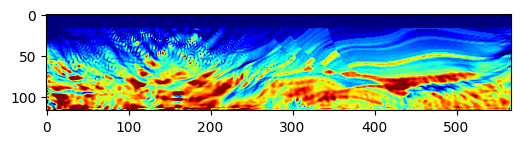

Epoch: 511 Loss:  2789.64453125 model_loss:  362842.8
Epoch: 512 Loss:  2788.6055908203125 model_loss:  362896.0
Epoch: 513 Loss:  2787.582763671875 model_loss:  362947.94
Epoch: 514 Loss:  2786.504150390625 model_loss:  363001.12
Epoch: 515 Loss:  2785.4632568359375 model_loss:  363054.88
Epoch: 516 Loss:  2784.4351806640625 model_loss:  363108.28
Epoch: 517 Loss:  2783.369873046875 model_loss:  363162.62
Epoch: 518 Loss:  2782.3228759765625 model_loss:  363217.66
Epoch: 519 Loss:  2781.27783203125 model_loss:  363272.5
Epoch: 520 Loss:  2780.2164306640625 model_loss:  363328.1


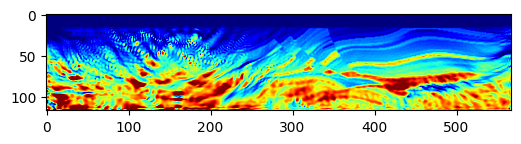

Epoch: 521 Loss:  2779.1536865234375 model_loss:  363384.34
Epoch: 522 Loss:  2778.0875244140625 model_loss:  363440.16
Epoch: 523 Loss:  2777.0250244140625 model_loss:  363495.72
Epoch: 524 Loss:  2775.946533203125 model_loss:  363551.5
Epoch: 525 Loss:  2774.86376953125 model_loss:  363607.78
Epoch: 526 Loss:  2773.7845458984375 model_loss:  363664.97
Epoch: 527 Loss:  2772.691162109375 model_loss:  363722.75
Epoch: 528 Loss:  2771.5955810546875 model_loss:  363781.22
Epoch: 529 Loss:  2770.49365234375 model_loss:  363840.47
Epoch: 530 Loss:  2769.378662109375 model_loss:  363899.78


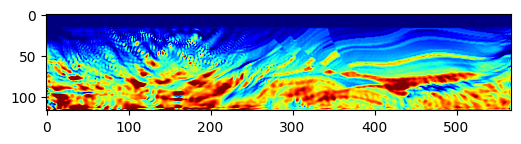

Epoch: 531 Loss:  2768.2637939453125 model_loss:  363959.47
Epoch: 532 Loss:  2767.136474609375 model_loss:  364019.6
Epoch: 533 Loss:  2766.0025634765625 model_loss:  364079.94
Epoch: 534 Loss:  2764.8477783203125 model_loss:  364141.06
Epoch: 535 Loss:  2763.66357421875 model_loss:  364202.12
Epoch: 536 Loss:  2762.45556640625 model_loss:  364262.4
Epoch: 537 Loss:  2761.2364501953125 model_loss:  364321.9
Epoch: 538 Loss:  2759.994873046875 model_loss:  364380.12
Epoch: 539 Loss:  2758.74267578125 model_loss:  364437.8
Epoch: 540 Loss:  2757.47265625 model_loss:  364495.12


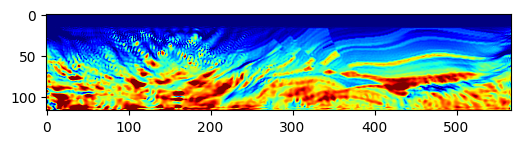

Epoch: 541 Loss:  2756.192138671875 model_loss:  364552.75
Epoch: 542 Loss:  2754.89306640625 model_loss:  364610.78
Epoch: 543 Loss:  2753.5859375 model_loss:  364669.25
Epoch: 544 Loss:  2752.2625732421875 model_loss:  364728.34
Epoch: 545 Loss:  2750.924072265625 model_loss:  364787.75
Epoch: 546 Loss:  2749.5693359375 model_loss:  364847.66
Epoch: 547 Loss:  2748.20361328125 model_loss:  364907.97
Epoch: 548 Loss:  2746.8197021484375 model_loss:  364968.56
Epoch: 549 Loss:  2745.424560546875 model_loss:  365029.4
Epoch: 550 Loss:  2744.020263671875 model_loss:  365090.25


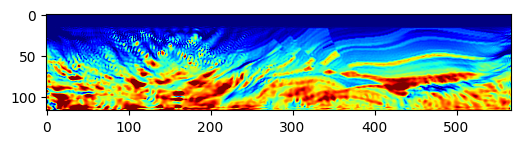

Epoch: 551 Loss:  2742.59228515625 model_loss:  365151.0
Epoch: 552 Loss:  2741.1502685546875 model_loss:  365211.47
Epoch: 553 Loss:  2739.69677734375 model_loss:  365271.44
Epoch: 554 Loss:  2738.2303466796875 model_loss:  365330.5
Epoch: 555 Loss:  2736.756591796875 model_loss:  365388.8
Epoch: 556 Loss:  2735.2681884765625 model_loss:  365446.66
Epoch: 557 Loss:  2733.76904296875 model_loss:  365503.84
Epoch: 558 Loss:  2732.270751953125 model_loss:  365560.34
Epoch: 559 Loss:  2730.7645263671875 model_loss:  365616.1
Epoch: 560 Loss:  2729.2734375 model_loss:  365671.12


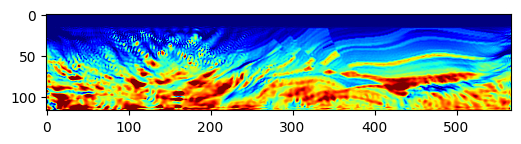

Epoch: 561 Loss:  2727.7691650390625 model_loss:  365725.22
Epoch: 562 Loss:  2726.26953125 model_loss:  365778.1
Epoch: 563 Loss:  2724.765625 model_loss:  365829.12
Epoch: 564 Loss:  2723.2794189453125 model_loss:  365878.2
Epoch: 565 Loss:  2721.7996826171875 model_loss:  365925.28
Epoch: 566 Loss:  2720.332763671875 model_loss:  365971.2
Epoch: 567 Loss:  2718.8802490234375 model_loss:  366016.22
Epoch: 568 Loss:  2717.43505859375 model_loss:  366060.56
Epoch: 569 Loss:  2716.0025634765625 model_loss:  366104.2
Epoch: 570 Loss:  2714.5924072265625 model_loss:  366147.84


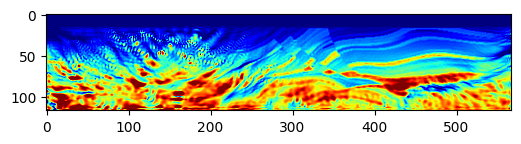

Epoch: 571 Loss:  2713.2039794921875 model_loss:  366190.8
Epoch: 572 Loss:  2711.8209228515625 model_loss:  366234.3
Epoch: 573 Loss:  2710.439453125 model_loss:  366276.97
Epoch: 574 Loss:  2709.03173828125 model_loss:  366320.28
Epoch: 575 Loss:  2707.601318359375 model_loss:  366363.03
Epoch: 576 Loss:  2706.1815185546875 model_loss:  366406.62
Epoch: 577 Loss:  2704.8074951171875 model_loss:  366451.34
Epoch: 578 Loss:  2703.456298828125 model_loss:  366496.38
Epoch: 579 Loss:  2702.103271484375 model_loss:  366541.9
Epoch: 580 Loss:  2700.7579345703125 model_loss:  366587.7


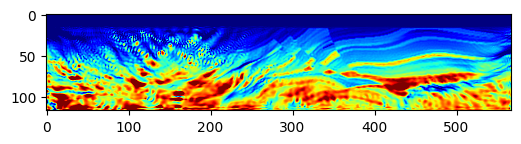

Epoch: 581 Loss:  2699.428466796875 model_loss:  366633.75
Epoch: 582 Loss:  2698.107177734375 model_loss:  366680.12
Epoch: 583 Loss:  2696.802001953125 model_loss:  366726.22
Epoch: 584 Loss:  2695.49658203125 model_loss:  366771.8
Epoch: 585 Loss:  2694.2108154296875 model_loss:  366816.78
Epoch: 586 Loss:  2692.947265625 model_loss:  366861.0
Epoch: 587 Loss:  2691.690185546875 model_loss:  366904.78
Epoch: 588 Loss:  2690.451416015625 model_loss:  366947.88
Epoch: 589 Loss:  2689.2244873046875 model_loss:  366990.47
Epoch: 590 Loss:  2688.000244140625 model_loss:  367032.12


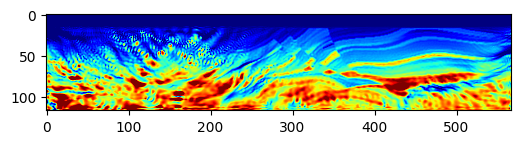

Epoch: 591 Loss:  2686.79443359375 model_loss:  367072.66
Epoch: 592 Loss:  2685.5902099609375 model_loss:  367111.88
Epoch: 593 Loss:  2684.3997802734375 model_loss:  367150.03
Epoch: 594 Loss:  2683.211181640625 model_loss:  367187.25
Epoch: 595 Loss:  2682.023193359375 model_loss:  367224.06
Epoch: 596 Loss:  2680.83740234375 model_loss:  367260.4
Epoch: 597 Loss:  2679.6534423828125 model_loss:  367296.28
Epoch: 598 Loss:  2678.47802734375 model_loss:  367331.84
Epoch: 599 Loss:  2677.3082275390625 model_loss:  367367.03
Epoch: 600 Loss:  2676.1519775390625 model_loss:  367401.72


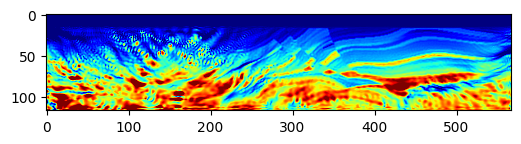

Epoch: 601 Loss:  2675.004150390625 model_loss:  367435.38
Epoch: 602 Loss:  2673.866455078125 model_loss:  367467.88
Epoch: 603 Loss:  2672.738037109375 model_loss:  367499.03
Epoch: 604 Loss:  2671.618896484375 model_loss:  367529.12
Epoch: 605 Loss:  2670.5101318359375 model_loss:  367558.38
Epoch: 606 Loss:  2669.403076171875 model_loss:  367587.44
Epoch: 607 Loss:  2668.3035888671875 model_loss:  367616.62
Epoch: 608 Loss:  2687.3382568359375 model_loss:  367637.72
Epoch: 609 Loss:  2685.86376953125 model_loss:  367652.75
Epoch: 610 Loss:  2684.8232421875 model_loss:  367671.22


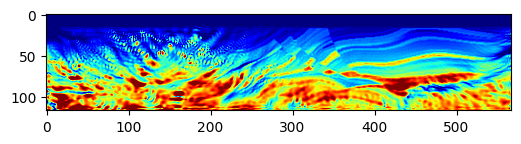

Epoch: 611 Loss:  2683.7493896484375 model_loss:  367690.0
Epoch: 612 Loss:  2682.743896484375 model_loss:  367705.38
Epoch: 613 Loss:  2681.534423828125 model_loss:  367717.03
Epoch: 614 Loss:  2680.588623046875 model_loss:  367729.78
Epoch: 615 Loss:  2679.590576171875 model_loss:  367742.44
Epoch: 616 Loss:  2678.4427490234375 model_loss:  367758.25
Epoch: 617 Loss:  2677.5076904296875 model_loss:  367775.7
Epoch: 618 Loss:  2676.433349609375 model_loss:  367794.66
Epoch: 619 Loss:  2675.599365234375 model_loss:  367811.44
Epoch: 620 Loss:  2674.4163818359375 model_loss:  367829.5


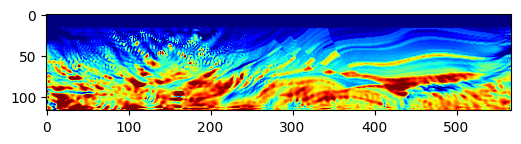

Epoch: 621 Loss:  2673.708740234375 model_loss:  367850.28
Epoch: 622 Loss:  2672.5484619140625 model_loss:  367872.9
Epoch: 623 Loss:  2671.818359375 model_loss:  367897.94
Epoch: 624 Loss:  2670.7579345703125 model_loss:  367924.94
Epoch: 625 Loss:  2670.003173828125 model_loss:  367952.78
Epoch: 626 Loss:  2668.978759765625 model_loss:  367980.94
Epoch: 627 Loss:  2668.2022705078125 model_loss:  368010.47
Epoch: 628 Loss:  2667.27099609375 model_loss:  368041.12
Epoch: 629 Loss:  2666.4483642578125 model_loss:  368073.66
Epoch: 630 Loss:  2665.5625 model_loss:  368107.4


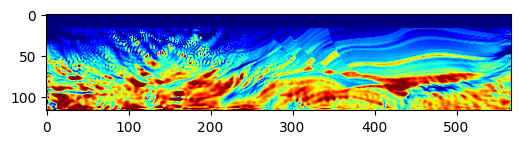

Epoch: 631 Loss:  2664.7769775390625 model_loss:  368142.6
Epoch: 632 Loss:  2663.9163818359375 model_loss:  368178.62
Epoch: 633 Loss:  2663.0953369140625 model_loss:  368215.34
Epoch: 634 Loss:  2662.2529296875 model_loss:  368252.66
Epoch: 635 Loss:  2661.4366455078125 model_loss:  368291.56
Epoch: 636 Loss:  2660.597412109375 model_loss:  368330.47
Epoch: 637 Loss:  2659.8031005859375 model_loss:  368369.6
Epoch: 638 Loss:  2658.9788818359375 model_loss:  368408.4
Epoch: 639 Loss:  2658.18212890625 model_loss:  368447.6
Epoch: 640 Loss:  2657.3743896484375 model_loss:  368487.62


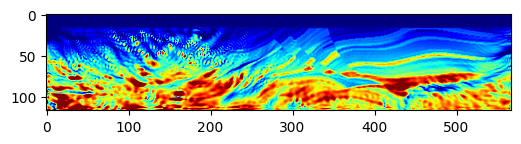

Epoch: 641 Loss:  2656.5753173828125 model_loss:  368528.44
Epoch: 642 Loss:  2655.77978515625 model_loss:  368570.0
Epoch: 643 Loss:  2654.970458984375 model_loss:  368612.47
Epoch: 644 Loss:  2654.1839599609375 model_loss:  368656.25
Epoch: 645 Loss:  2653.358154296875 model_loss:  368701.3
Epoch: 646 Loss:  2652.56689453125 model_loss:  368747.53
Epoch: 647 Loss:  2651.749267578125 model_loss:  368794.78
Epoch: 648 Loss:  2650.9476318359375 model_loss:  368843.28
Epoch: 649 Loss:  2650.125732421875 model_loss:  368893.1
Epoch: 650 Loss:  2649.317626953125 model_loss:  368943.72


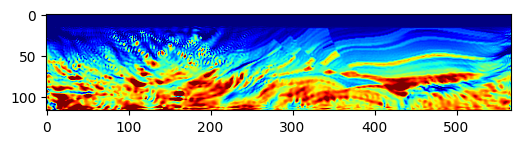

Epoch: 651 Loss:  2648.49609375 model_loss:  368995.22
Epoch: 652 Loss:  2647.6658935546875 model_loss:  369047.28
Epoch: 653 Loss:  2646.844482421875 model_loss:  369099.88
Epoch: 654 Loss:  2646.0164794921875 model_loss:  369152.72
Epoch: 655 Loss:  2645.191650390625 model_loss:  369205.97
Epoch: 656 Loss:  2644.361083984375 model_loss:  369259.6
Epoch: 657 Loss:  2643.54296875 model_loss:  369313.4
Epoch: 658 Loss:  2642.7174072265625 model_loss:  369367.5
Epoch: 659 Loss:  2641.9034423828125 model_loss:  369422.3
Epoch: 660 Loss:  2641.096923828125 model_loss:  369477.38


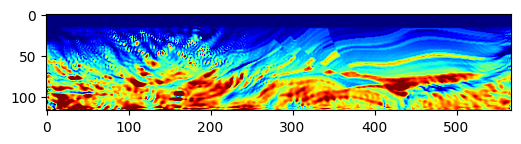

Epoch: 661 Loss:  2640.2919921875 model_loss:  369533.06
Epoch: 662 Loss:  2639.4970703125 model_loss:  369589.2
Epoch: 663 Loss:  2638.702392578125 model_loss:  369646.2
Epoch: 664 Loss:  2637.915283203125 model_loss:  369703.7
Epoch: 665 Loss:  2637.12841796875 model_loss:  369762.34
Epoch: 666 Loss:  2636.339111328125 model_loss:  369821.6
Epoch: 667 Loss:  2635.55859375 model_loss:  369881.9
Epoch: 668 Loss:  2634.78466796875 model_loss:  369942.66
Epoch: 669 Loss:  2634.02001953125 model_loss:  370004.62
Epoch: 670 Loss:  2633.2520751953125 model_loss:  370066.9


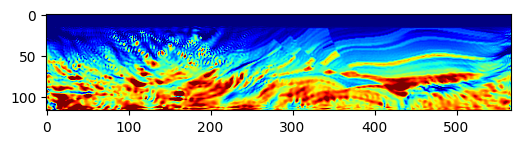

Epoch: 671 Loss:  2632.4967041015625 model_loss:  370130.56
Epoch: 672 Loss:  2631.73388671875 model_loss:  370193.88
Epoch: 673 Loss:  2631.001220703125 model_loss:  370258.25
Epoch: 674 Loss:  2630.2503662109375 model_loss:  370321.72
Epoch: 675 Loss:  2629.5218505859375 model_loss:  370385.78
Epoch: 676 Loss:  2628.778564453125 model_loss:  370448.12
Epoch: 677 Loss:  2628.0570068359375 model_loss:  370510.75
Epoch: 678 Loss:  2627.304931640625 model_loss:  370572.06
Epoch: 679 Loss:  2626.5693359375 model_loss:  370634.0
Epoch: 680 Loss:  2625.80029296875 model_loss:  370695.06


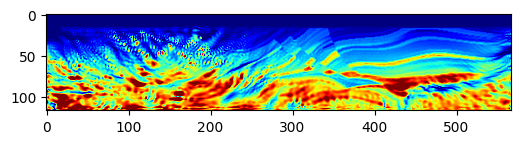

Epoch: 681 Loss:  2625.056640625 model_loss:  370755.47
Epoch: 682 Loss:  2624.283935546875 model_loss:  370815.34
Epoch: 683 Loss:  2623.543701171875 model_loss:  370874.2
Epoch: 684 Loss:  2622.780029296875 model_loss:  370933.03
Epoch: 685 Loss:  2622.0369873046875 model_loss:  370990.7
Epoch: 686 Loss:  2621.2794189453125 model_loss:  371048.4
Epoch: 687 Loss:  2620.5277099609375 model_loss:  371105.62
Epoch: 688 Loss:  2619.77880859375 model_loss:  371163.34
Epoch: 689 Loss:  2619.015869140625 model_loss:  371221.3
Epoch: 690 Loss:  2618.2625732421875 model_loss:  371279.4


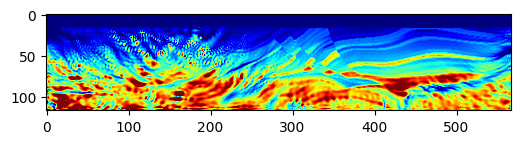

Epoch: 691 Loss:  2617.4940185546875 model_loss:  371338.1
Epoch: 692 Loss:  2616.7218017578125 model_loss:  371396.72
Epoch: 693 Loss:  2615.939208984375 model_loss:  371455.97
Epoch: 694 Loss:  2615.148193359375 model_loss:  371514.9
Epoch: 695 Loss:  2614.3414306640625 model_loss:  371574.5
Epoch: 696 Loss:  2613.52587890625 model_loss:  371634.53
Epoch: 697 Loss:  2612.688232421875 model_loss:  371695.47
Epoch: 698 Loss:  2611.841552734375 model_loss:  371755.88
Epoch: 699 Loss:  2610.9786376953125 model_loss:  371815.4
Epoch: 700 Loss:  2610.12158203125 model_loss:  371873.5


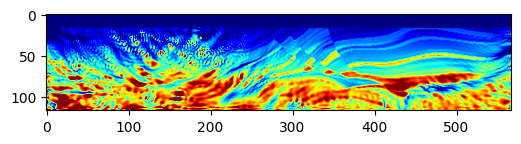

Epoch: 701 Loss:  2609.2734375 model_loss:  371930.56
Epoch: 702 Loss:  2608.436279296875 model_loss:  371985.8
Epoch: 703 Loss:  2607.603271484375 model_loss:  372039.66
Epoch: 704 Loss:  2606.774658203125 model_loss:  372092.75
Epoch: 705 Loss:  2605.946533203125 model_loss:  372145.44
Epoch: 706 Loss:  2605.119873046875 model_loss:  372197.2
Epoch: 707 Loss:  2604.299072265625 model_loss:  372248.28
Epoch: 708 Loss:  2603.467529296875 model_loss:  372298.12
Epoch: 709 Loss:  2602.6317138671875 model_loss:  372347.06
Epoch: 710 Loss:  2601.8016357421875 model_loss:  372394.78


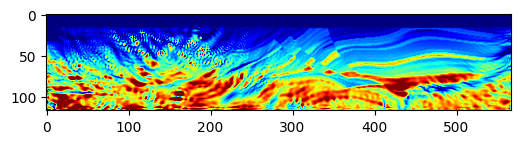

Epoch: 711 Loss:  2600.9566650390625 model_loss:  372440.88
Epoch: 712 Loss:  2600.10791015625 model_loss:  372484.5
Epoch: 713 Loss:  2599.262939453125 model_loss:  372526.3
Epoch: 714 Loss:  2598.42333984375 model_loss:  372566.8
Epoch: 715 Loss:  2597.588623046875 model_loss:  372607.7
Epoch: 716 Loss:  2596.7548828125 model_loss:  372649.4
Epoch: 717 Loss:  2595.9327392578125 model_loss:  372693.4
Epoch: 718 Loss:  2595.1212158203125 model_loss:  372739.1
Epoch: 719 Loss:  2594.3204345703125 model_loss:  372787.47
Epoch: 720 Loss:  2593.5225830078125 model_loss:  372837.38


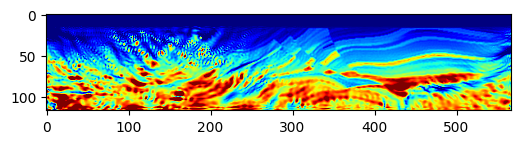

Epoch: 721 Loss:  2592.7513427734375 model_loss:  372890.1
Epoch: 722 Loss:  2591.9727783203125 model_loss:  372943.4
Epoch: 723 Loss:  2591.2255859375 model_loss:  372999.5
Epoch: 724 Loss:  2590.468017578125 model_loss:  373055.47
Epoch: 725 Loss:  2589.741943359375 model_loss:  373113.94
Epoch: 726 Loss:  2588.9864501953125 model_loss:  373171.62
Epoch: 727 Loss:  2588.2711181640625 model_loss:  373231.2
Epoch: 728 Loss:  2587.5360107421875 model_loss:  373289.78
Epoch: 729 Loss:  2586.837158203125 model_loss:  373349.06
Epoch: 730 Loss:  2586.1063232421875 model_loss:  373407.72


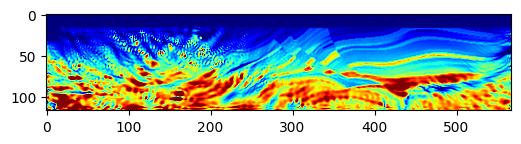

Epoch: 731 Loss:  2585.41552734375 model_loss:  373466.25
Epoch: 732 Loss:  2584.692626953125 model_loss:  373525.2
Epoch: 733 Loss:  2583.995361328125 model_loss:  373584.1
Epoch: 734 Loss:  2583.284423828125 model_loss:  373643.88
Epoch: 735 Loss:  2582.6041259765625 model_loss:  373703.7
Epoch: 736 Loss:  2581.9149169921875 model_loss:  373764.12
Epoch: 737 Loss:  2581.238525390625 model_loss:  373824.78
Epoch: 738 Loss:  2580.5587158203125 model_loss:  373885.72
Epoch: 739 Loss:  2579.890625 model_loss:  373947.38
Epoch: 740 Loss:  2579.227783203125 model_loss:  374009.25


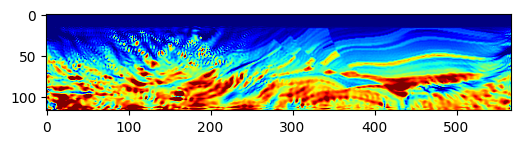

Epoch: 741 Loss:  2578.580078125 model_loss:  374071.9
Epoch: 742 Loss:  2577.9219970703125 model_loss:  374134.56
Epoch: 743 Loss:  2577.280517578125 model_loss:  374198.03
Epoch: 744 Loss:  2576.635009765625 model_loss:  374261.22
Epoch: 745 Loss:  2576.0120849609375 model_loss:  374325.22
Epoch: 746 Loss:  2575.3829345703125 model_loss:  374388.84
Epoch: 747 Loss:  2574.7584228515625 model_loss:  374452.72
Epoch: 748 Loss:  2574.136962890625 model_loss:  374516.25
Epoch: 749 Loss:  2573.525146484375 model_loss:  374580.22
Epoch: 750 Loss:  2572.917724609375 model_loss:  374644.2


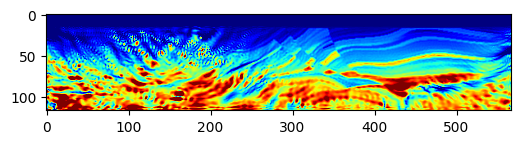

Epoch: 751 Loss:  2572.317138671875 model_loss:  374708.56
Epoch: 752 Loss:  2571.7255859375 model_loss:  374773.22
Epoch: 753 Loss:  2571.1419677734375 model_loss:  374838.62
Epoch: 754 Loss:  2570.5528564453125 model_loss:  374904.38
Epoch: 755 Loss:  2569.980712890625 model_loss:  374970.7
Epoch: 756 Loss:  2569.4019775390625 model_loss:  375037.2
Epoch: 757 Loss:  2568.837890625 model_loss:  375103.94
Epoch: 758 Loss:  2568.2703857421875 model_loss:  375170.9
Epoch: 759 Loss:  2567.70947265625 model_loss:  375238.62
Epoch: 760 Loss:  2567.14697265625 model_loss:  375306.78


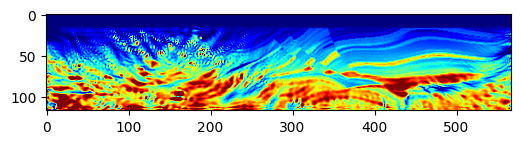

Epoch: 761 Loss:  2566.5904541015625 model_loss:  375375.34
Epoch: 762 Loss:  2566.035400390625 model_loss:  375443.66
Epoch: 763 Loss:  2565.4754638671875 model_loss:  375512.12
Epoch: 764 Loss:  2564.9190673828125 model_loss:  375580.78
Epoch: 765 Loss:  2564.3621826171875 model_loss:  375650.2
Epoch: 766 Loss:  2563.8115234375 model_loss:  375720.22
Epoch: 767 Loss:  2563.2628173828125 model_loss:  375791.12
Epoch: 768 Loss:  2562.725830078125 model_loss:  375862.44
Epoch: 769 Loss:  2562.1739501953125 model_loss:  375934.2
Epoch: 770 Loss:  2561.636962890625 model_loss:  376006.03


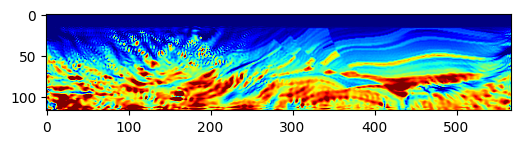

Epoch: 771 Loss:  2561.099609375 model_loss:  376078.25
Epoch: 772 Loss:  2560.563720703125 model_loss:  376150.25
Epoch: 773 Loss:  2560.02978515625 model_loss:  376222.28
Epoch: 774 Loss:  2559.5048828125 model_loss:  376293.9
Epoch: 775 Loss:  2558.976318359375 model_loss:  376365.47
Epoch: 776 Loss:  2558.444091796875 model_loss:  376436.7
Epoch: 777 Loss:  2557.9136962890625 model_loss:  376507.9
Epoch: 778 Loss:  2557.38818359375 model_loss:  376578.94
Epoch: 779 Loss:  2556.862548828125 model_loss:  376650.38
Epoch: 780 Loss:  2556.3372802734375 model_loss:  376722.1


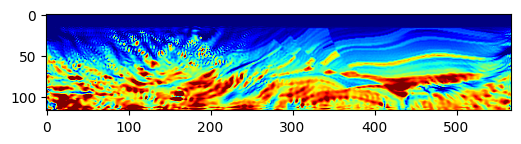

Epoch: 781 Loss:  2555.815673828125 model_loss:  376794.25
Epoch: 782 Loss:  2555.294189453125 model_loss:  376866.88
Epoch: 783 Loss:  2554.7626953125 model_loss:  376940.22
Epoch: 784 Loss:  2554.254638671875 model_loss:  377014.53
Epoch: 785 Loss:  2553.7218017578125 model_loss:  377089.4
Epoch: 786 Loss:  2553.2366943359375 model_loss:  377165.72
Epoch: 787 Loss:  2552.711669921875 model_loss:  377242.38
Epoch: 788 Loss:  2552.22509765625 model_loss:  377320.78
Epoch: 789 Loss:  2551.6854248046875 model_loss:  377398.8
Epoch: 790 Loss:  2551.1932373046875 model_loss:  377478.47


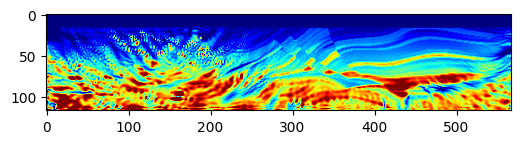

Epoch: 791 Loss:  2550.639404296875 model_loss:  377557.3
Epoch: 792 Loss:  2550.133056640625 model_loss:  377637.75
Epoch: 793 Loss:  2549.5640869140625 model_loss:  377717.8
Epoch: 794 Loss:  2549.0413818359375 model_loss:  377799.22
Epoch: 795 Loss:  2548.453125 model_loss:  377881.1
Epoch: 796 Loss:  2547.893310546875 model_loss:  377963.12
Epoch: 797 Loss:  2547.304443359375 model_loss:  378046.62
Epoch: 798 Loss:  2546.7432861328125 model_loss:  378129.66
Epoch: 799 Loss:  2546.1693115234375 model_loss:  378214.3
Epoch: 800 Loss:  2545.632080078125 model_loss:  378298.66


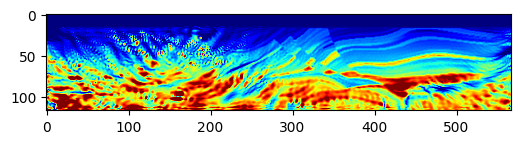

Epoch: 801 Loss:  2545.071044921875 model_loss:  378384.34
Epoch: 802 Loss:  2544.53857421875 model_loss:  378470.03
Epoch: 803 Loss:  2543.9818115234375 model_loss:  378556.06
Epoch: 804 Loss:  2543.4609375 model_loss:  378642.3
Epoch: 805 Loss:  2542.908935546875 model_loss:  378728.75
Epoch: 806 Loss:  2542.397705078125 model_loss:  378815.5
Epoch: 807 Loss:  2541.8431396484375 model_loss:  378902.4
Epoch: 808 Loss:  2541.333251953125 model_loss:  378989.25
Epoch: 809 Loss:  2540.8050537109375 model_loss:  379076.3
Epoch: 810 Loss:  2540.29638671875 model_loss:  379163.2


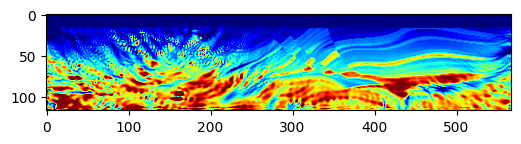

Epoch: 811 Loss:  2539.7789306640625 model_loss:  379250.62
Epoch: 812 Loss:  2539.275146484375 model_loss:  379337.88
Epoch: 813 Loss:  2538.7705078125 model_loss:  379425.97
Epoch: 814 Loss:  2538.27783203125 model_loss:  379513.94
Epoch: 815 Loss:  2537.7862548828125 model_loss:  379602.84
Epoch: 816 Loss:  2537.3006591796875 model_loss:  379691.34
Epoch: 817 Loss:  2536.8175048828125 model_loss:  379780.75
Epoch: 818 Loss:  2536.3408203125 model_loss:  379870.03
Epoch: 819 Loss:  2535.8631591796875 model_loss:  379960.25
Epoch: 820 Loss:  2535.3896484375 model_loss:  380050.66


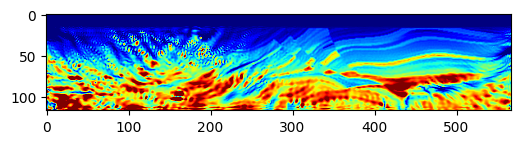

Epoch: 821 Loss:  2534.9072265625 model_loss:  380141.7
Epoch: 822 Loss:  2534.4332275390625 model_loss:  380232.9
Epoch: 823 Loss:  2533.948486328125 model_loss:  380324.6
Epoch: 824 Loss:  2533.46875 model_loss:  380416.47
Epoch: 825 Loss:  2532.98876953125 model_loss:  380508.75
Epoch: 826 Loss:  2532.5198974609375 model_loss:  380601.4
Epoch: 827 Loss:  2532.036376953125 model_loss:  380694.66
Epoch: 828 Loss:  2531.55712890625 model_loss:  380788.34
Epoch: 829 Loss:  2531.077880859375 model_loss:  380882.7
Epoch: 830 Loss:  2530.5970458984375 model_loss:  380977.3


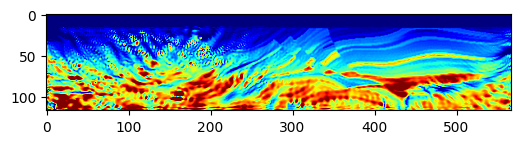

Epoch: 831 Loss:  2530.1201171875 model_loss:  381072.6
Epoch: 832 Loss:  2529.6407470703125 model_loss:  381169.0
Epoch: 833 Loss:  2529.1519775390625 model_loss:  381266.4
Epoch: 834 Loss:  2528.67333984375 model_loss:  381365.06
Epoch: 835 Loss:  2528.18896484375 model_loss:  381464.8
Epoch: 836 Loss:  2527.6962890625 model_loss:  381565.3
Epoch: 837 Loss:  2527.2191162109375 model_loss:  381666.28
Epoch: 838 Loss:  2526.7269287109375 model_loss:  381767.66
Epoch: 839 Loss:  2526.2489013671875 model_loss:  381869.22
Epoch: 840 Loss:  2525.7576904296875 model_loss:  381970.78


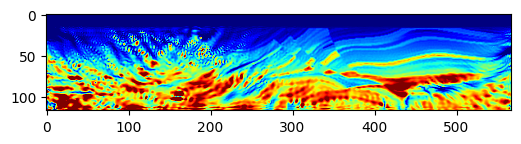

Epoch: 841 Loss:  2525.27294921875 model_loss:  382071.97
Epoch: 842 Loss:  2524.7919921875 model_loss:  382172.38
Epoch: 843 Loss:  2524.3138427734375 model_loss:  382271.75
Epoch: 844 Loss:  2523.8291015625 model_loss:  382369.94
Epoch: 845 Loss:  2523.336181640625 model_loss:  382467.16
Epoch: 846 Loss:  2522.8486328125 model_loss:  382563.78
Epoch: 847 Loss:  2522.3642578125 model_loss:  382660.6
Epoch: 848 Loss:  2521.885009765625 model_loss:  382758.16
Epoch: 849 Loss:  2521.39892578125 model_loss:  382856.88
Epoch: 850 Loss:  2520.9183349609375 model_loss:  382956.6


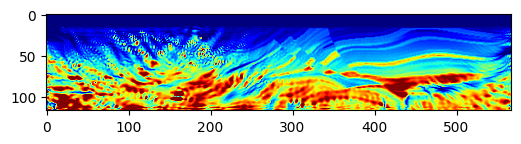

Epoch: 851 Loss:  2520.434326171875 model_loss:  383057.0
Epoch: 852 Loss:  2519.953125 model_loss:  383157.62
Epoch: 853 Loss:  2519.4732666015625 model_loss:  383258.34
Epoch: 854 Loss:  2518.9925537109375 model_loss:  383358.8
Epoch: 855 Loss:  2518.5003662109375 model_loss:  383459.0
Epoch: 856 Loss:  2518.0252685546875 model_loss:  383558.8
Epoch: 857 Loss:  2517.532470703125 model_loss:  383658.53
Epoch: 858 Loss:  2517.040283203125 model_loss:  383757.88
Epoch: 859 Loss:  2516.5552978515625 model_loss:  383857.5
Epoch: 860 Loss:  2516.072509765625 model_loss:  383957.3


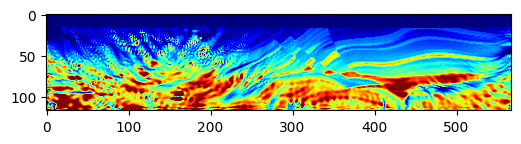

Epoch: 861 Loss:  2515.578125 model_loss:  384057.6
Epoch: 862 Loss:  2515.0887451171875 model_loss:  384158.3
Epoch: 863 Loss:  2514.5975341796875 model_loss:  384259.8
Epoch: 864 Loss:  2514.1097412109375 model_loss:  384361.72
Epoch: 865 Loss:  2513.6251220703125 model_loss:  384464.28
Epoch: 866 Loss:  2513.125244140625 model_loss:  384566.62
Epoch: 867 Loss:  2512.6324462890625 model_loss:  384668.9
Epoch: 868 Loss:  2512.1297607421875 model_loss:  384770.22
Epoch: 869 Loss:  2511.634521484375 model_loss:  384871.62
Epoch: 870 Loss:  2491.884765625 model_loss:  384982.7


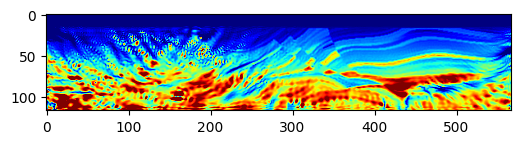

Epoch: 871 Loss:  2491.4342041015625 model_loss:  385101.78
Epoch: 872 Loss:  2490.8109130859375 model_loss:  385216.34
Epoch: 873 Loss:  2490.2476806640625 model_loss:  385333.88
Epoch: 874 Loss:  2489.6737060546875 model_loss:  385453.53
Epoch: 875 Loss:  2489.2545166015625 model_loss:  385574.72
Epoch: 876 Loss:  2488.6866455078125 model_loss:  385691.38
Epoch: 877 Loss:  2488.271240234375 model_loss:  385805.44
Epoch: 878 Loss:  2487.78759765625 model_loss:  385912.97
Epoch: 879 Loss:  2487.2933349609375 model_loss:  386019.06
Epoch: 880 Loss:  2486.730712890625 model_loss:  386124.94


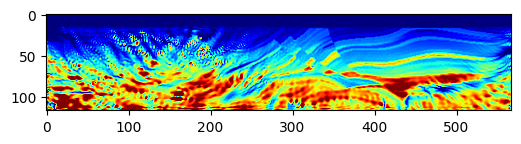

Epoch: 881 Loss:  2486.3782958984375 model_loss:  386232.94
Epoch: 882 Loss:  2485.7757568359375 model_loss:  386339.4
Epoch: 883 Loss:  2485.3377685546875 model_loss:  386448.2
Epoch: 884 Loss:  2484.9283447265625 model_loss:  386554.56
Epoch: 885 Loss:  2484.3782958984375 model_loss:  386660.66
Epoch: 886 Loss:  2484.094482421875 model_loss:  386768.62
Epoch: 887 Loss:  2483.4718017578125 model_loss:  386878.47
Epoch: 888 Loss:  2483.2103271484375 model_loss:  386989.53
Epoch: 889 Loss:  2482.5758056640625 model_loss:  387098.34
Epoch: 890 Loss:  2482.282958984375 model_loss:  387207.56


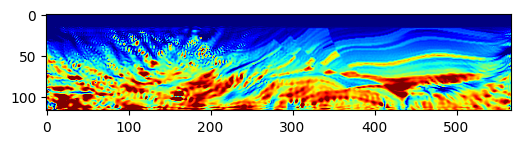

Epoch: 891 Loss:  2481.7559814453125 model_loss:  387314.94
Epoch: 892 Loss:  2481.375 model_loss:  387422.75
Epoch: 893 Loss:  2480.944091796875 model_loss:  387530.66
Epoch: 894 Loss:  2480.45947265625 model_loss:  387638.88
Epoch: 895 Loss:  2480.12744140625 model_loss:  387746.88
Epoch: 896 Loss:  2479.573486328125 model_loss:  387853.97
Epoch: 897 Loss:  2479.2554931640625 model_loss:  387962.94
Epoch: 898 Loss:  2478.7166748046875 model_loss:  388069.47
Epoch: 899 Loss:  2478.367919921875 model_loss:  388177.03
Epoch: 900 Loss:  2477.9034423828125 model_loss:  388281.9


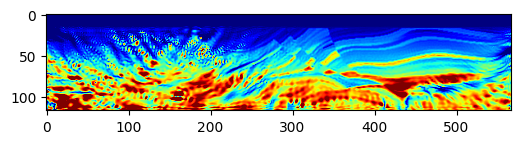

Epoch: 901 Loss:  2477.490234375 model_loss:  388387.75
Epoch: 902 Loss:  2477.1522216796875 model_loss:  388491.84
Epoch: 903 Loss:  2476.6356201171875 model_loss:  388597.1
Epoch: 904 Loss:  2476.3931884765625 model_loss:  388702.22
Epoch: 905 Loss:  2475.7950439453125 model_loss:  388807.28
Epoch: 906 Loss:  2475.57958984375 model_loss:  388913.6
Epoch: 907 Loss:  2474.992919921875 model_loss:  389019.16
Epoch: 908 Loss:  2474.7371826171875 model_loss:  389126.44
Epoch: 909 Loss:  2474.2552490234375 model_loss:  389232.97
Epoch: 910 Loss:  2473.91796875 model_loss:  389340.44


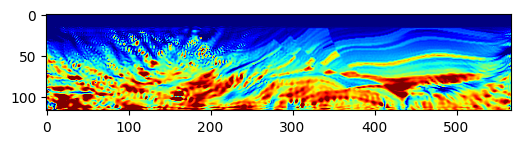

Epoch: 911 Loss:  2473.5604248046875 model_loss:  389447.28
Epoch: 912 Loss:  2473.1102294921875 model_loss:  389554.3
Epoch: 913 Loss:  2472.84326171875 model_loss:  389662.44
Epoch: 914 Loss:  2472.306884765625 model_loss:  389768.94
Epoch: 915 Loss:  2472.053466796875 model_loss:  389877.72
Epoch: 916 Loss:  2471.5362548828125 model_loss:  389983.3
Epoch: 917 Loss:  2471.241943359375 model_loss:  390091.6
Epoch: 918 Loss:  2470.8541259765625 model_loss:  390195.2
Epoch: 919 Loss:  2470.4521484375 model_loss:  390301.4
Epoch: 920 Loss:  2470.212890625 model_loss:  390403.72


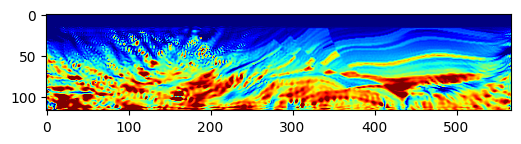

Epoch: 921 Loss:  2469.6636962890625 model_loss:  390507.94
Epoch: 922 Loss:  2469.5125732421875 model_loss:  390609.84
Epoch: 923 Loss:  2468.885498046875 model_loss:  390712.34
Epoch: 924 Loss:  2468.7581787109375 model_loss:  390814.2
Epoch: 925 Loss:  2468.2044677734375 model_loss:  390916.0
Epoch: 926 Loss:  2468.0347900390625 model_loss:  391018.62
Epoch: 927 Loss:  2467.655029296875 model_loss:  391121.53
Epoch: 928 Loss:  2467.3375244140625 model_loss:  391224.7
Epoch: 929 Loss:  2467.0928955078125 model_loss:  391329.7
Epoch: 930 Loss:  2466.598876953125 model_loss:  391432.66


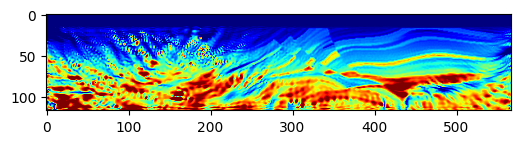

Epoch: 931 Loss:  2466.4097900390625 model_loss:  391539.9
Epoch: 932 Loss:  2465.884033203125 model_loss:  391642.28
Epoch: 933 Loss:  2465.6678466796875 model_loss:  391750.72
Epoch: 934 Loss:  2465.298095703125 model_loss:  391852.22
Epoch: 935 Loss:  2464.9449462890625 model_loss:  391960.53
Epoch: 936 Loss:  2464.7655029296875 model_loss:  392062.03
Epoch: 937 Loss:  2464.2032470703125 model_loss:  392169.3
Epoch: 938 Loss:  2464.141357421875 model_loss:  392272.12
Epoch: 939 Loss:  2463.497802734375 model_loss:  392379.34
Epoch: 940 Loss:  2463.529296875 model_loss:  392484.84


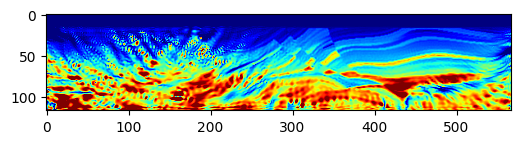

Epoch: 941 Loss:  2463.07373046875 model_loss:  392593.94
Epoch: 942 Loss:  2463.0791015625 model_loss:  392700.75
Epoch: 943 Loss:  2462.8603515625 model_loss:  392812.78
Epoch: 944 Loss:  2462.6629638671875 model_loss:  392918.5
Epoch: 945 Loss:  2462.5462646484375 model_loss:  393034.34
Epoch: 946 Loss:  2462.186279296875 model_loss:  393138.75
Epoch: 947 Loss:  2462.076171875 model_loss:  393258.97
Epoch: 948 Loss:  2461.817626953125 model_loss:  393363.1
Epoch: 949 Loss:  2461.63134765625 model_loss:  393487.2
Epoch: 950 Loss:  2461.61865234375 model_loss:  393592.25


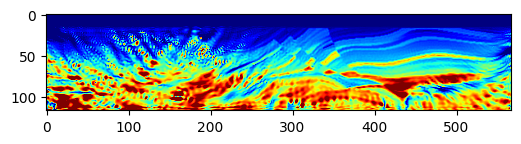

Epoch: 951 Loss:  2461.238525390625 model_loss:  393717.8
Epoch: 952 Loss:  2461.483154296875 model_loss:  393823.9
Epoch: 953 Loss:  2461.02392578125 model_loss:  393949.25
Epoch: 954 Loss:  2461.5306396484375 model_loss:  394056.34
Epoch: 955 Loss:  2461.2496337890625 model_loss:  394181.84
Epoch: 956 Loss:  2461.839111328125 model_loss:  394289.03
Epoch: 957 Loss:  2461.5875244140625 model_loss:  394415.44
Epoch: 958 Loss:  2462.011474609375 model_loss:  394521.7
Epoch: 959 Loss:  2461.42822265625 model_loss:  394649.9
Epoch: 960 Loss:  2461.7427978515625 model_loss:  394754.97


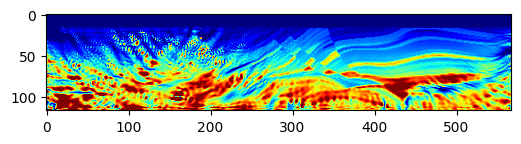

Epoch: 961 Loss:  2460.726806640625 model_loss:  394883.88
Epoch: 962 Loss:  2461.18798828125 model_loss:  394989.03
Epoch: 963 Loss:  2459.6787109375 model_loss:  395116.88
Epoch: 964 Loss:  2460.361572265625 model_loss:  395224.47
Epoch: 965 Loss:  2458.33544921875 model_loss:  395348.8
Epoch: 966 Loss:  2459.12841796875 model_loss:  395460.53
Epoch: 967 Loss:  2456.8782958984375 model_loss:  395580.66
Epoch: 968 Loss:  2457.61279296875 model_loss:  395695.5
Epoch: 969 Loss:  2455.50146484375 model_loss:  395812.2
Epoch: 970 Loss:  2456.00439453125 model_loss:  395927.12


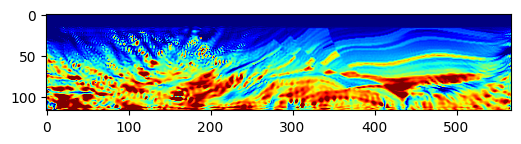

Epoch: 971 Loss:  2454.149658203125 model_loss:  396041.94
Epoch: 972 Loss:  2454.4241943359375 model_loss:  396155.66
Epoch: 973 Loss:  2452.7822265625 model_loss:  396270.03
Epoch: 974 Loss:  2453.050537109375 model_loss:  396383.0
Epoch: 975 Loss:  2451.5828857421875 model_loss:  396496.34
Epoch: 976 Loss:  2451.9696044921875 model_loss:  396610.28
Epoch: 977 Loss:  2450.629638671875 model_loss:  396722.6
Epoch: 978 Loss:  2451.0218505859375 model_loss:  396838.75
Epoch: 979 Loss:  2449.867431640625 model_loss:  396950.62
Epoch: 980 Loss:  2450.1292724609375 model_loss:  397068.06


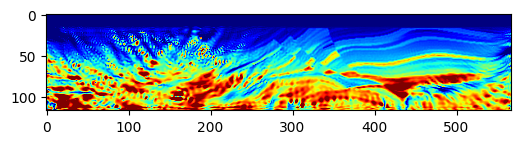

Epoch: 981 Loss:  2449.2540283203125 model_loss:  397179.5
Epoch: 982 Loss:  2449.300048828125 model_loss:  397296.3
Epoch: 983 Loss:  2448.69970703125 model_loss:  397407.7
Epoch: 984 Loss:  2448.53662109375 model_loss:  397522.53
Epoch: 985 Loss:  2448.1051025390625 model_loss:  397634.06
Epoch: 986 Loss:  2447.844482421875 model_loss:  397747.03
Epoch: 987 Loss:  2447.4892578125 model_loss:  397858.38
Epoch: 988 Loss:  2447.25048828125 model_loss:  397970.28
Epoch: 989 Loss:  2446.8822021484375 model_loss:  398080.97
Epoch: 990 Loss:  2446.68603515625 model_loss:  398192.47


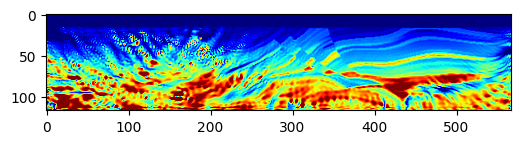

Epoch: 991 Loss:  2446.2957763671875 model_loss:  398302.34
Epoch: 992 Loss:  2446.09033203125 model_loss:  398413.94
Epoch: 993 Loss:  2445.7374267578125 model_loss:  398523.38
Epoch: 994 Loss:  2445.47021484375 model_loss:  398635.03
Epoch: 995 Loss:  2445.2083740234375 model_loss:  398744.47
Epoch: 996 Loss:  2444.859130859375 model_loss:  398855.62
Epoch: 997 Loss:  2444.662841796875 model_loss:  398965.2
Epoch: 998 Loss:  2444.267333984375 model_loss:  399075.62
Epoch: 999 Loss:  2444.0828857421875 model_loss:  399185.78
Epoch: 1000 Loss:  2443.7191162109375 model_loss:  399295.88


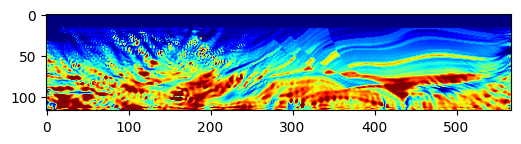

Epoch: 1001 Loss:  2443.4866943359375 model_loss:  399406.34
Epoch: 1002 Loss:  2443.1929931640625 model_loss:  399516.2
Epoch: 1003 Loss:  2442.8951416015625 model_loss:  399626.03
Epoch: 1004 Loss:  2442.6334228515625 model_loss:  399735.56
Epoch: 1005 Loss:  2442.3189697265625 model_loss:  399844.44
Epoch: 1006 Loss:  2442.0487060546875 model_loss:  399953.9
Epoch: 1007 Loss:  2441.79150390625 model_loss:  400062.38
Epoch: 1008 Loss:  2441.460693359375 model_loss:  400172.12
Epoch: 1009 Loss:  2441.255859375 model_loss:  400280.8
Epoch: 1010 Loss:  2440.8751220703125 model_loss:  400390.6


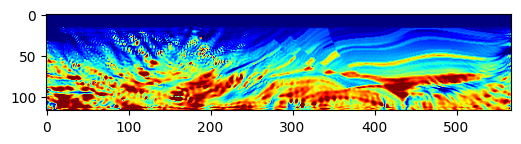

Epoch: 1011 Loss:  2440.682373046875 model_loss:  400500.0
Epoch: 1012 Loss:  2440.35205078125 model_loss:  400609.47
Epoch: 1013 Loss:  2440.1109619140625 model_loss:  400719.88
Epoch: 1014 Loss:  2439.87255859375 model_loss:  400829.88
Epoch: 1015 Loss:  2439.537353515625 model_loss:  400940.4
Epoch: 1016 Loss:  2439.3331298828125 model_loss:  401050.53
Epoch: 1017 Loss:  2438.99853515625 model_loss:  401160.4
Epoch: 1018 Loss:  2438.777099609375 model_loss:  401271.16
Epoch: 1019 Loss:  2438.5745849609375 model_loss:  401380.47
Epoch: 1020 Loss:  2438.23828125 model_loss:  401491.44


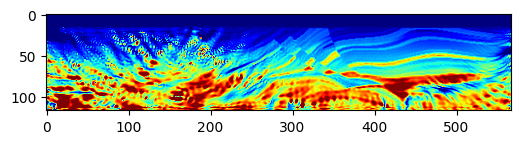

Epoch: 1021 Loss:  2438.094482421875 model_loss:  401600.53
Epoch: 1022 Loss:  2437.6656494140625 model_loss:  401710.75
Epoch: 1023 Loss:  2437.52783203125 model_loss:  401820.28
Epoch: 1024 Loss:  2437.2965087890625 model_loss:  401929.47
Epoch: 1025 Loss:  2437.085205078125 model_loss:  402039.22
Epoch: 1026 Loss:  2436.9840087890625 model_loss:  402147.0
Epoch: 1027 Loss:  2436.5272216796875 model_loss:  402256.22
Epoch: 1028 Loss:  2436.4031982421875 model_loss:  402364.4
Epoch: 1029 Loss:  2436.110107421875 model_loss:  402472.66
Epoch: 1030 Loss:  2436.0587158203125 model_loss:  402582.53


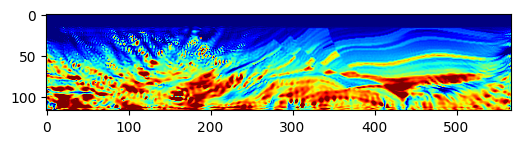

Epoch: 1031 Loss:  2436.134521484375 model_loss:  402690.03
Epoch: 1032 Loss:  2435.7127685546875 model_loss:  402801.12
Epoch: 1033 Loss:  2435.6441650390625 model_loss:  402908.97
Epoch: 1034 Loss:  2435.102783203125 model_loss:  403018.94
Epoch: 1035 Loss:  2435.262451171875 model_loss:  403128.06
Epoch: 1036 Loss:  2435.5721435546875 model_loss:  403235.7
Epoch: 1037 Loss:  2435.574951171875 model_loss:  403346.38
Epoch: 1038 Loss:  2435.67431640625 model_loss:  403452.94
Epoch: 1039 Loss:  2434.79296875 model_loss:  403563.25
Epoch: 1040 Loss:  2434.87744140625 model_loss:  403671.97


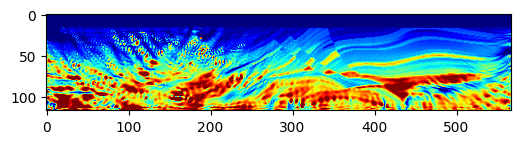

Epoch: 1041 Loss:  2435.2205810546875 model_loss:  403780.38
Epoch: 1042 Loss:  2435.980712890625 model_loss:  403892.88
Epoch: 1043 Loss:  2436.6337890625 model_loss:  403999.47
Epoch: 1044 Loss:  2435.76171875 model_loss:  404113.28
Epoch: 1045 Loss:  2435.4649658203125 model_loss:  404221.25
Epoch: 1046 Loss:  2434.966064453125 model_loss:  404333.0
Epoch: 1047 Loss:  2435.83447265625 model_loss:  404445.94
Epoch: 1048 Loss:  2436.801513671875 model_loss:  404553.9
Epoch: 1049 Loss:  2437.008056640625 model_loss:  404669.66
Epoch: 1050 Loss:  2436.5938720703125 model_loss:  404774.5


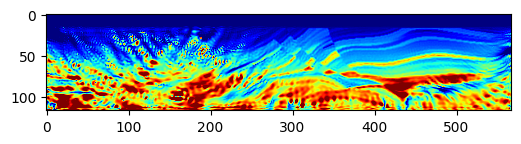

Epoch: 1051 Loss:  2435.231201171875 model_loss:  404888.28
Epoch: 1052 Loss:  2434.6611328125 model_loss:  404996.9
Epoch: 1053 Loss:  2433.9345703125 model_loss:  405106.2
Epoch: 1054 Loss:  2434.031982421875 model_loss:  405220.06
Epoch: 1055 Loss:  2433.8531494140625 model_loss:  405322.97
Epoch: 1056 Loss:  2433.723388671875 model_loss:  405437.28
Epoch: 1057 Loss:  2432.8323974609375 model_loss:  405538.06
Epoch: 1058 Loss:  2431.093994140625 model_loss:  405649.78
Epoch: 1059 Loss:  2429.80712890625 model_loss:  405754.94
Epoch: 1060 Loss:  2428.301025390625 model_loss:  405861.2


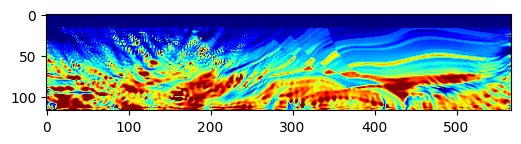

Epoch: 1061 Loss:  2428.1312255859375 model_loss:  405971.28
Epoch: 1062 Loss:  2427.6529541015625 model_loss:  406073.06
Epoch: 1063 Loss:  2427.478271484375 model_loss:  406184.53
Epoch: 1064 Loss:  2426.976318359375 model_loss:  406285.53
Epoch: 1065 Loss:  2426.141845703125 model_loss:  406394.34
Epoch: 1066 Loss:  2425.6827392578125 model_loss:  406498.06
Epoch: 1067 Loss:  2424.94873046875 model_loss:  406603.12
Epoch: 1068 Loss:  2424.58447265625 model_loss:  406709.78
Epoch: 1069 Loss:  2424.2069091796875 model_loss:  406813.78
Epoch: 1070 Loss:  2423.803466796875 model_loss:  406920.97


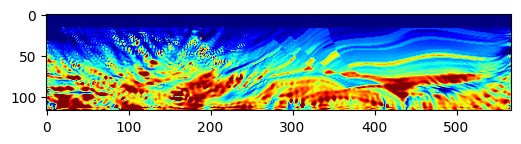

Epoch: 1071 Loss:  2423.73291015625 model_loss:  407026.0
Epoch: 1072 Loss:  2423.368408203125 model_loss:  407131.66
Epoch: 1073 Loss:  2423.3360595703125 model_loss:  407237.97
Epoch: 1074 Loss:  2423.0067138671875 model_loss:  407342.78
Epoch: 1075 Loss:  2422.7344970703125 model_loss:  407449.6
Epoch: 1076 Loss:  2422.443603515625 model_loss:  407554.88
Epoch: 1077 Loss:  2421.97412109375 model_loss:  407661.88
Epoch: 1078 Loss:  2421.7601318359375 model_loss:  407768.25
Epoch: 1079 Loss:  2421.3240966796875 model_loss:  407875.44
Epoch: 1080 Loss:  2421.2169189453125 model_loss:  407981.53


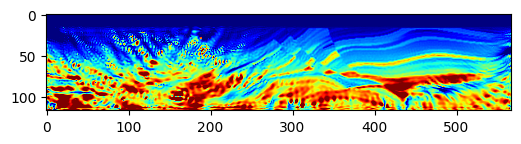

Epoch: 1081 Loss:  2420.9232177734375 model_loss:  408089.16
Epoch: 1082 Loss:  2420.8092041015625 model_loss:  408194.03
Epoch: 1083 Loss:  2420.5755615234375 model_loss:  408302.6
Epoch: 1084 Loss:  2420.3311767578125 model_loss:  408406.84
Epoch: 1085 Loss:  2420.0704345703125 model_loss:  408515.97
Epoch: 1086 Loss:  2419.7196044921875 model_loss:  408620.75
Epoch: 1087 Loss:  2419.486083984375 model_loss:  408730.12
Epoch: 1088 Loss:  2419.130615234375 model_loss:  408836.8
Epoch: 1089 Loss:  2418.97509765625 model_loss:  408946.2
Epoch: 1090 Loss:  2418.6585693359375 model_loss:  409055.38


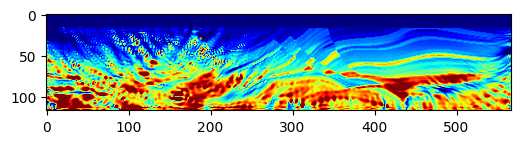

Epoch: 1091 Loss:  2418.51513671875 model_loss:  409164.6
Epoch: 1092 Loss:  2418.20263671875 model_loss:  409276.7
Epoch: 1093 Loss:  2418.01025390625 model_loss:  409386.75
Epoch: 1094 Loss:  2417.7127685546875 model_loss:  409501.6
Epoch: 1095 Loss:  2417.47216796875 model_loss:  409613.84
Epoch: 1096 Loss:  2417.223388671875 model_loss:  409730.3
Epoch: 1097 Loss:  2416.973388671875 model_loss:  409844.88
Epoch: 1098 Loss:  2416.7843017578125 model_loss:  409961.84
Epoch: 1099 Loss:  2416.5367431640625 model_loss:  410078.56
Epoch: 1100 Loss:  2416.3677978515625 model_loss:  410195.8


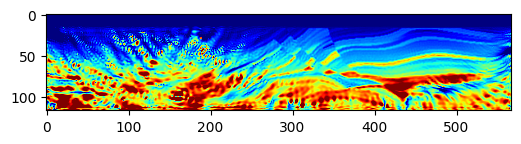

Epoch: 1101 Loss:  2416.11083984375 model_loss:  410314.4
Epoch: 1102 Loss:  2415.94189453125 model_loss:  410433.0
Epoch: 1103 Loss:  2415.6866455078125 model_loss:  410553.06
Epoch: 1104 Loss:  2415.4970703125 model_loss:  410673.1
Epoch: 1105 Loss:  2415.270263671875 model_loss:  410793.75
Epoch: 1106 Loss:  2415.0650634765625 model_loss:  410914.72
Epoch: 1107 Loss:  2414.8724365234375 model_loss:  411035.56
Epoch: 1108 Loss:  2414.648193359375 model_loss:  411156.97
Epoch: 1109 Loss:  2414.475341796875 model_loss:  411278.22
Epoch: 1110 Loss:  2414.24267578125 model_loss:  411399.75


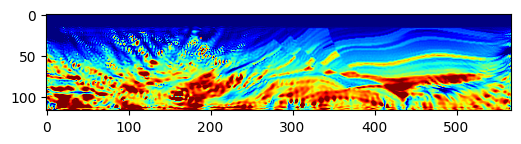

Epoch: 1111 Loss:  2414.0718994140625 model_loss:  411521.34
Epoch: 1112 Loss:  2413.8466796875 model_loss:  411643.03
Epoch: 1113 Loss:  2413.67431640625 model_loss:  411765.2
Epoch: 1114 Loss:  2413.46142578125 model_loss:  411887.34
Epoch: 1115 Loss:  2413.2728271484375 model_loss:  412010.0
Epoch: 1116 Loss:  2413.075439453125 model_loss:  412132.78
Epoch: 1117 Loss:  2412.87841796875 model_loss:  412255.3
Epoch: 1118 Loss:  2412.6937255859375 model_loss:  412378.3
Epoch: 1119 Loss:  2412.494873046875 model_loss:  412500.38
Epoch: 1120 Loss:  2412.309814453125 model_loss:  412623.12


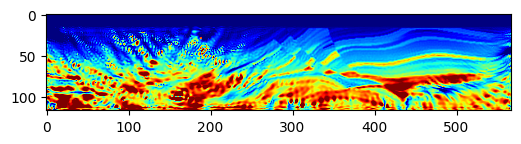

Epoch: 1121 Loss:  2412.123046875 model_loss:  412744.7
Epoch: 1122 Loss:  2411.923095703125 model_loss:  412867.06
Epoch: 1123 Loss:  2411.7462158203125 model_loss:  412988.62
Epoch: 1124 Loss:  2411.547119140625 model_loss:  413110.72
Epoch: 1125 Loss:  2411.372314453125 model_loss:  413232.56
Epoch: 1126 Loss:  2411.181396484375 model_loss:  413354.5
Epoch: 1127 Loss:  2411.000244140625 model_loss:  413476.5
Epoch: 1128 Loss:  2410.812744140625 model_loss:  413598.28
Epoch: 1129 Loss:  2410.6287841796875 model_loss:  413719.94
Epoch: 1130 Loss:  2410.44482421875 model_loss:  413841.53


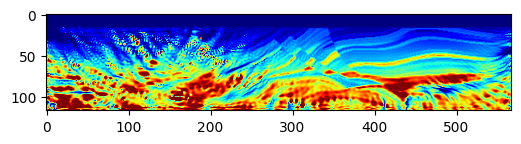

Epoch: 1131 Loss:  2410.2626953125 model_loss:  413962.84
Epoch: 1132 Loss:  2410.083251953125 model_loss:  414084.62
Epoch: 1133 Loss:  2409.9036865234375 model_loss:  414205.62
Epoch: 1134 Loss:  2409.7203369140625 model_loss:  414327.38
Epoch: 1135 Loss:  2409.5401611328125 model_loss:  414448.4
Epoch: 1136 Loss:  2409.368408203125 model_loss:  414569.78
Epoch: 1137 Loss:  2409.191650390625 model_loss:  414690.8
Epoch: 1138 Loss:  2409.0225830078125 model_loss:  414812.0
Epoch: 1139 Loss:  2408.8486328125 model_loss:  414933.28
Epoch: 1140 Loss:  2408.6705322265625 model_loss:  415054.6


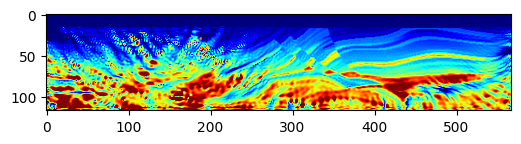

Epoch: 1141 Loss:  2408.5023193359375 model_loss:  415176.06
Epoch: 1142 Loss:  2408.32177734375 model_loss:  415297.84
Epoch: 1143 Loss:  2408.174072265625 model_loss:  415419.2
Epoch: 1144 Loss:  2407.998046875 model_loss:  415541.34
Epoch: 1145 Loss:  2407.839111328125 model_loss:  415662.53
Epoch: 1146 Loss:  2407.6649169921875 model_loss:  415784.7
Epoch: 1147 Loss:  2407.4913330078125 model_loss:  415905.94
Epoch: 1148 Loss:  2407.3505859375 model_loss:  416027.8
Epoch: 1149 Loss:  2407.182373046875 model_loss:  416149.56
Epoch: 1150 Loss:  2407.056640625 model_loss:  416271.34


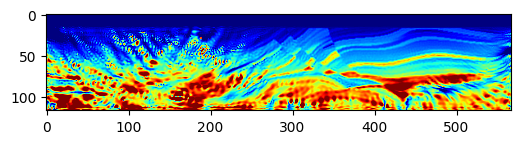

Epoch: 1151 Loss:  2406.881591796875 model_loss:  416393.4
Epoch: 1152 Loss:  2406.707763671875 model_loss:  416515.44
Epoch: 1153 Loss:  2406.5684814453125 model_loss:  416637.25
Epoch: 1154 Loss:  2406.4039306640625 model_loss:  416759.84
Epoch: 1155 Loss:  2406.322509765625 model_loss:  416881.16
Epoch: 1156 Loss:  2406.1463623046875 model_loss:  417003.9
Epoch: 1157 Loss:  2405.9835205078125 model_loss:  417125.22
Epoch: 1158 Loss:  2405.8214111328125 model_loss:  417248.12
Epoch: 1159 Loss:  2405.653564453125 model_loss:  417370.12
Epoch: 1160 Loss:  2405.639404296875 model_loss:  417492.84


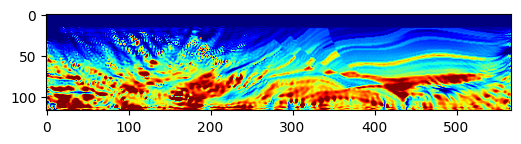

Epoch: 1161 Loss:  2405.4835205078125 model_loss:  417615.6
Epoch: 1162 Loss:  2405.384765625 model_loss:  417738.0
Epoch: 1163 Loss:  2405.18017578125 model_loss:  417860.47
Epoch: 1164 Loss:  2404.9962158203125 model_loss:  417983.25
Epoch: 1165 Loss:  2405.0450439453125 model_loss:  418104.75
Epoch: 1166 Loss:  2404.94482421875 model_loss:  418227.8
Epoch: 1167 Loss:  2404.9354248046875 model_loss:  418348.06
Epoch: 1168 Loss:  2404.677978515625 model_loss:  418470.88
Epoch: 1169 Loss:  2404.414306640625 model_loss:  418591.2
Epoch: 1170 Loss:  2404.56103515625 model_loss:  418712.8


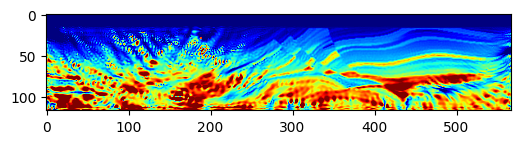

Epoch: 1171 Loss:  2404.5701904296875 model_loss:  418834.8
Epoch: 1172 Loss:  2404.838134765625 model_loss:  418955.7
Epoch: 1173 Loss:  2404.5126953125 model_loss:  419077.75
Epoch: 1174 Loss:  2404.1702880859375 model_loss:  419199.2
Epoch: 1175 Loss:  2404.324462890625 model_loss:  419319.56
Epoch: 1176 Loss:  2404.5272216796875 model_loss:  419443.3
Epoch: 1177 Loss:  2405.163330078125 model_loss:  419561.38
Epoch: 1178 Loss:  2404.80419921875 model_loss:  419686.38
Epoch: 1179 Loss:  2404.23779296875 model_loss:  419804.28
Epoch: 1180 Loss:  2404.4171142578125 model_loss:  419928.4


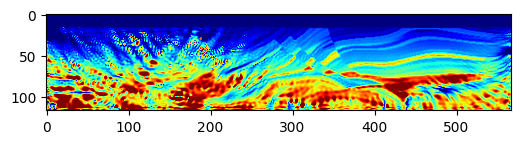

Epoch: 1181 Loss:  2404.952392578125 model_loss:  420048.9
Epoch: 1182 Loss:  2406.4827880859375 model_loss:  420171.53
Epoch: 1183 Loss:  2406.2396240234375 model_loss:  420293.34
Epoch: 1184 Loss:  2405.4681396484375 model_loss:  420416.94
Epoch: 1185 Loss:  2405.3017578125 model_loss:  420536.56
Epoch: 1186 Loss:  2406.081298828125 model_loss:  420663.44
Epoch: 1187 Loss:  2408.427001953125 model_loss:  420779.47
Epoch: 1188 Loss:  2408.4915771484375 model_loss:  420907.78
Epoch: 1189 Loss:  2407.23876953125 model_loss:  421024.38
Epoch: 1190 Loss:  2406.2542724609375 model_loss:  421149.56


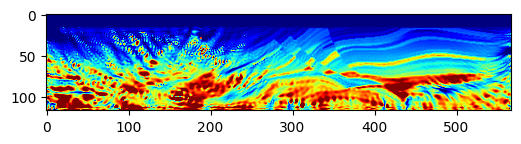

Epoch: 1191 Loss:  2406.5360107421875 model_loss:  421272.62
Epoch: 1192 Loss:  2409.876708984375 model_loss:  421395.22
Epoch: 1193 Loss:  2410.9818115234375 model_loss:  421523.72
Epoch: 1194 Loss:  2410.404541015625 model_loss:  421647.38
Epoch: 1195 Loss:  2408.56640625 model_loss:  421772.9
Epoch: 1196 Loss:  2407.21923828125 model_loss:  421902.25
Epoch: 1197 Loss:  2409.4093017578125 model_loss:  422022.3
Epoch: 1198 Loss:  2411.0069580078125 model_loss:  422157.34
Epoch: 1199 Loss:  2411.871337890625 model_loss:  422275.0
Epoch: 1200 Loss:  2410.748291015625 model_loss:  422408.0


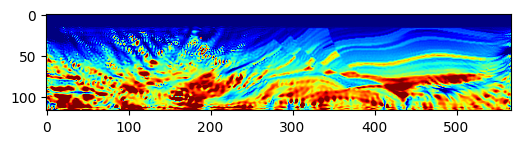

Epoch: 1201 Loss:  2407.9820556640625 model_loss:  422527.94
Epoch: 1202 Loss:  2406.9385986328125 model_loss:  422658.5
Epoch: 1203 Loss:  2405.7515869140625 model_loss:  422785.5
Epoch: 1204 Loss:  2406.34326171875 model_loss:  422913.47
Epoch: 1205 Loss:  2406.990478515625 model_loss:  423041.56
Epoch: 1206 Loss:  2425.7529296875 model_loss:  423155.47
Epoch: 1207 Loss:  2424.828857421875 model_loss:  423263.34
Epoch: 1208 Loss:  2423.26123046875 model_loss:  423376.16
Epoch: 1209 Loss:  2422.6749267578125 model_loss:  423484.5
Epoch: 1210 Loss:  2421.770263671875 model_loss:  423593.75


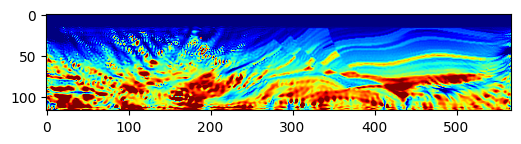

Epoch: 1211 Loss:  2421.360595703125 model_loss:  423697.38
Epoch: 1212 Loss:  2421.360595703125 model_loss:  423811.62
Epoch: 1213 Loss:  2421.10302734375 model_loss:  423919.2
Epoch: 1214 Loss:  2420.87646484375 model_loss:  424046.1
Epoch: 1215 Loss:  2420.419677734375 model_loss:  424159.75
Epoch: 1216 Loss:  2419.38720703125 model_loss:  424289.06
Epoch: 1217 Loss:  2418.8421630859375 model_loss:  424407.12
Epoch: 1218 Loss:  2418.0589599609375 model_loss:  424534.66
Epoch: 1219 Loss:  2417.7825927734375 model_loss:  424654.12
Epoch: 1220 Loss:  2417.5762939453125 model_loss:  424778.16


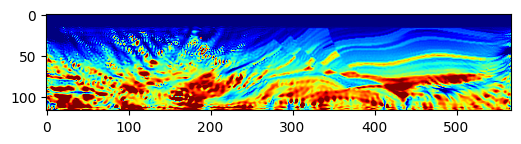

Epoch: 1221 Loss:  2417.330078125 model_loss:  424900.6
Epoch: 1222 Loss:  2417.387939453125 model_loss:  425021.38
Epoch: 1223 Loss:  2417.0938720703125 model_loss:  425142.4
Epoch: 1224 Loss:  2417.0556640625 model_loss:  425265.25
Epoch: 1225 Loss:  2416.9119873046875 model_loss:  425385.78
Epoch: 1226 Loss:  2416.650390625 model_loss:  425513.12
Epoch: 1227 Loss:  2416.701416015625 model_loss:  425634.16
Epoch: 1228 Loss:  2416.3670654296875 model_loss:  425763.7
Epoch: 1229 Loss:  2416.5076904296875 model_loss:  425884.97
Epoch: 1230 Loss:  2416.169677734375 model_loss:  426014.94


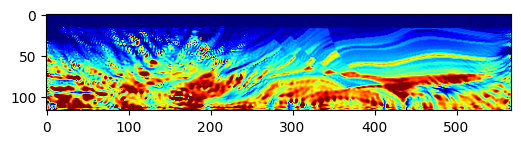

Epoch: 1231 Loss:  2416.258544921875 model_loss:  426135.44
Epoch: 1232 Loss:  2415.930908203125 model_loss:  426265.5
Epoch: 1233 Loss:  2415.895263671875 model_loss:  426385.88
Epoch: 1234 Loss:  2415.588134765625 model_loss:  426516.1
Epoch: 1235 Loss:  2415.4876708984375 model_loss:  426636.16
Epoch: 1236 Loss:  2415.2352294921875 model_loss:  426766.4
Epoch: 1237 Loss:  2415.1619873046875 model_loss:  426886.7
Epoch: 1238 Loss:  2414.9515380859375 model_loss:  427015.53
Epoch: 1239 Loss:  2414.91796875 model_loss:  427136.3
Epoch: 1240 Loss:  2414.7528076171875 model_loss:  427264.56


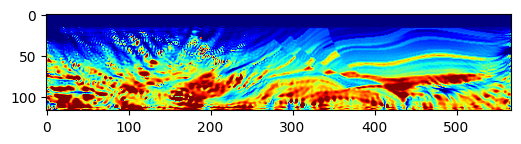

Epoch: 1241 Loss:  2414.7138671875 model_loss:  427385.7
Epoch: 1242 Loss:  2414.5699462890625 model_loss:  427514.44
Epoch: 1243 Loss:  2414.547607421875 model_loss:  427635.4
Epoch: 1244 Loss:  2414.394775390625 model_loss:  427765.03
Epoch: 1245 Loss:  2414.3787841796875 model_loss:  427884.75
Epoch: 1246 Loss:  2414.1964111328125 model_loss:  428014.8
Epoch: 1247 Loss:  2414.1470947265625 model_loss:  428133.88
Epoch: 1248 Loss:  2413.913330078125 model_loss:  428263.88
Epoch: 1249 Loss:  2413.8299560546875 model_loss:  428382.9
Epoch: 1250 Loss:  2413.58154296875 model_loss:  428512.44


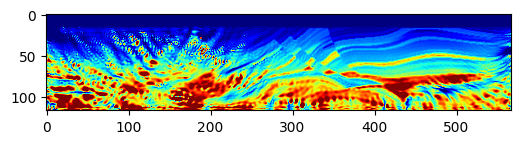

Epoch: 1251 Loss:  2413.5220947265625 model_loss:  428631.84
Epoch: 1252 Loss:  2413.315673828125 model_loss:  428761.34
Epoch: 1253 Loss:  2413.2890625 model_loss:  428881.2
Epoch: 1254 Loss:  2413.1240234375 model_loss:  429011.1
Epoch: 1255 Loss:  2413.1005859375 model_loss:  429131.06
Epoch: 1256 Loss:  2412.972412109375 model_loss:  429261.53
Epoch: 1257 Loss:  2412.93603515625 model_loss:  429381.1
Epoch: 1258 Loss:  2412.8045654296875 model_loss:  429511.94
Epoch: 1259 Loss:  2412.729736328125 model_loss:  429631.1
Epoch: 1260 Loss:  2412.581787109375 model_loss:  429762.06


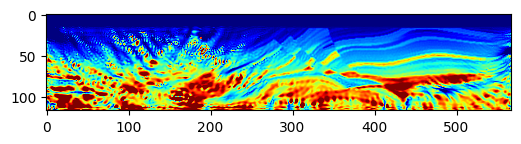

Epoch: 1261 Loss:  2412.466552734375 model_loss:  429881.25
Epoch: 1262 Loss:  2412.287109375 model_loss:  430012.16
Epoch: 1263 Loss:  2412.1717529296875 model_loss:  430131.75
Epoch: 1264 Loss:  2412.010986328125 model_loss:  430262.34
Epoch: 1265 Loss:  2411.919677734375 model_loss:  430381.97
Epoch: 1266 Loss:  2411.77685546875 model_loss:  430512.16
Epoch: 1267 Loss:  2411.7188720703125 model_loss:  430631.53
Epoch: 1268 Loss:  2411.58349609375 model_loss:  430761.66
Epoch: 1269 Loss:  2411.5120849609375 model_loss:  430880.44
Epoch: 1270 Loss:  2411.39990234375 model_loss:  431010.8


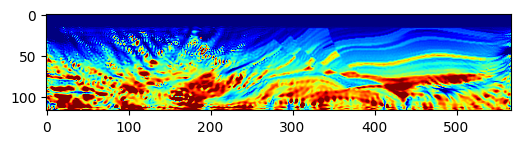

Epoch: 1271 Loss:  2411.29345703125 model_loss:  431129.53
Epoch: 1272 Loss:  2411.1746826171875 model_loss:  431260.12
Epoch: 1273 Loss:  2411.0137939453125 model_loss:  431379.66
Epoch: 1274 Loss:  2410.891845703125 model_loss:  431510.28
Epoch: 1275 Loss:  2410.7095947265625 model_loss:  431630.94
Epoch: 1276 Loss:  2410.6168212890625 model_loss:  431761.22
Epoch: 1277 Loss:  2410.45947265625 model_loss:  431882.97
Epoch: 1278 Loss:  2410.3697509765625 model_loss:  432012.94
Epoch: 1279 Loss:  2410.23681640625 model_loss:  432135.53
Epoch: 1280 Loss:  2410.1292724609375 model_loss:  432265.53


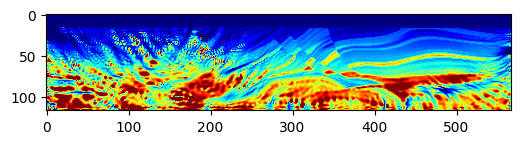

Epoch: 1281 Loss:  2410.0057373046875 model_loss:  432388.62
Epoch: 1282 Loss:  2409.8975830078125 model_loss:  432518.94
Epoch: 1283 Loss:  2409.74365234375 model_loss:  432642.75
Epoch: 1284 Loss:  2409.63525390625 model_loss:  432773.25
Epoch: 1285 Loss:  2409.421142578125 model_loss:  432898.16
Epoch: 1286 Loss:  2409.34521484375 model_loss:  433028.47
Epoch: 1287 Loss:  2409.131591796875 model_loss:  433154.6
Epoch: 1288 Loss:  2409.0927734375 model_loss:  433284.75
Epoch: 1289 Loss:  2408.9227294921875 model_loss:  433411.97
Epoch: 1290 Loss:  2408.8468017578125 model_loss:  433542.12


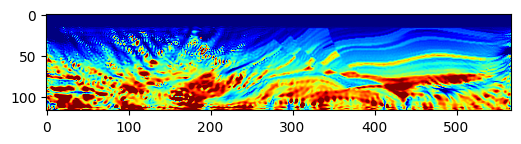

Epoch: 1291 Loss:  2408.6962890625 model_loss:  433669.7
Epoch: 1292 Loss:  2408.57666015625 model_loss:  433800.28
Epoch: 1293 Loss:  2408.484130859375 model_loss:  433927.84
Epoch: 1294 Loss:  2408.3682861328125 model_loss:  434058.78
Epoch: 1295 Loss:  2408.2425537109375 model_loss:  434186.8
Epoch: 1296 Loss:  2408.138916015625 model_loss:  434317.53
Epoch: 1297 Loss:  2407.940185546875 model_loss:  434446.56
Epoch: 1298 Loss:  2407.9320068359375 model_loss:  434575.97
Epoch: 1299 Loss:  2407.775146484375 model_loss:  434706.25
Epoch: 1300 Loss:  2407.78564453125 model_loss:  434834.7


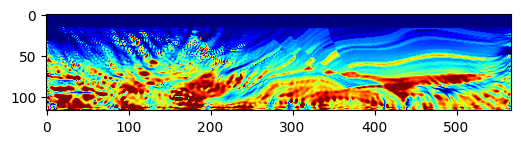

Epoch: 1301 Loss:  2407.6248779296875 model_loss:  434965.78
Epoch: 1302 Loss:  2407.4736328125 model_loss:  435094.56
Epoch: 1303 Loss:  2407.409423828125 model_loss:  435225.6
Epoch: 1304 Loss:  2407.27197265625 model_loss:  435355.53
Epoch: 1305 Loss:  2407.3394775390625 model_loss:  435486.2
Epoch: 1306 Loss:  2407.1949462890625 model_loss:  435616.5
Epoch: 1307 Loss:  2407.0565185546875 model_loss:  435748.22
Epoch: 1308 Loss:  2407.010986328125 model_loss:  435877.66
Epoch: 1309 Loss:  2406.906005859375 model_loss:  436011.44
Epoch: 1310 Loss:  2407.0926513671875 model_loss:  436139.03


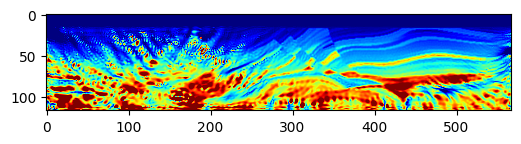

Epoch: 1311 Loss:  2406.93896484375 model_loss:  436274.34
Epoch: 1312 Loss:  2406.76220703125 model_loss:  436401.47
Epoch: 1313 Loss:  2406.708251953125 model_loss:  436536.06
Epoch: 1314 Loss:  2406.635498046875 model_loss:  436664.94
Epoch: 1315 Loss:  2407.19580078125 model_loss:  436797.28
Epoch: 1316 Loss:  2407.08837890625 model_loss:  436927.44
Epoch: 1317 Loss:  2407.039306640625 model_loss:  437059.4
Epoch: 1318 Loss:  2406.8056640625 model_loss:  437188.84
Epoch: 1319 Loss:  2406.8760986328125 model_loss:  437324.47
Epoch: 1320 Loss:  2407.60546875 model_loss:  437450.44


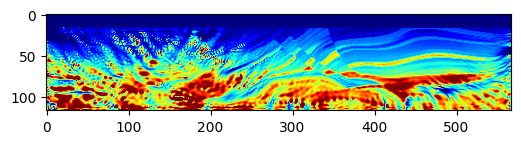

Epoch: 1321 Loss:  2407.6444091796875 model_loss:  437590.8
Epoch: 1322 Loss:  2407.3468017578125 model_loss:  437715.12
Epoch: 1323 Loss:  2407.3193359375 model_loss:  437856.3
Epoch: 1324 Loss:  2407.8134765625 model_loss:  437985.03
Epoch: 1325 Loss:  2410.0101318359375 model_loss:  438121.9
Epoch: 1326 Loss:  2410.365966796875 model_loss:  438256.66
Epoch: 1327 Loss:  2410.13232421875 model_loss:  438392.53
Epoch: 1328 Loss:  2409.40478515625 model_loss:  438526.25
Epoch: 1329 Loss:  2410.0872802734375 model_loss:  438668.3
Epoch: 1330 Loss:  2412.681396484375 model_loss:  438791.88


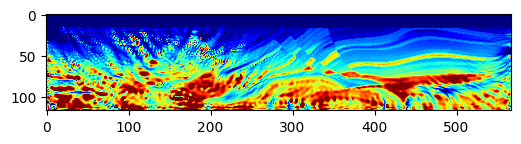

Epoch: 1331 Loss:  2413.299072265625 model_loss:  438941.97
Epoch: 1332 Loss:  2412.27490234375 model_loss:  439061.1
Epoch: 1333 Loss:  2411.3994140625 model_loss:  439208.53
Epoch: 1334 Loss:  2412.209716796875 model_loss:  439338.94
Epoch: 1335 Loss:  2416.8887939453125 model_loss:  439475.75
Epoch: 1336 Loss:  2418.0831298828125 model_loss:  439618.9
Epoch: 1337 Loss:  2417.3045654296875 model_loss:  439755.88
Epoch: 1338 Loss:  2414.96533203125 model_loss:  439893.22
Epoch: 1339 Loss:  2413.6893310546875 model_loss:  440040.88
Epoch: 1340 Loss:  2416.77880859375 model_loss:  440165.44


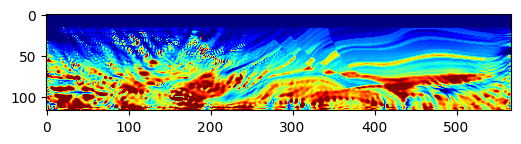

Epoch: 1341 Loss:  2418.372314453125 model_loss:  440322.75
Epoch: 1342 Loss:  2418.791015625 model_loss:  440441.8
Epoch: 1343 Loss:  2416.4471435546875 model_loss:  440597.0
Epoch: 1344 Loss:  2412.2750244140625 model_loss:  440726.25
Epoch: 1345 Loss:  2410.584228515625 model_loss:  440871.1
Epoch: 1346 Loss:  2408.284912109375 model_loss:  441016.7
Epoch: 1347 Loss:  2409.0584716796875 model_loss:  441155.28
Epoch: 1348 Loss:  2409.5318603515625 model_loss:  441302.2
Epoch: 1349 Loss:  2408.9404296875 model_loss:  441444.12
Epoch: 1350 Loss:  2408.9920654296875 model_loss:  441585.38


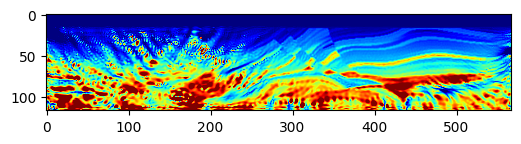

Epoch: 1351 Loss:  2407.09912109375 model_loss:  441734.16
Epoch: 1352 Loss:  2407.13671875 model_loss:  441872.1
Epoch: 1353 Loss:  2406.629638671875 model_loss:  442023.22
Epoch: 1354 Loss:  2406.7669677734375 model_loss:  442163.03
Epoch: 1355 Loss:  2407.1187744140625 model_loss:  442311.84
Epoch: 1356 Loss:  2406.1175537109375 model_loss:  442453.56
Epoch: 1357 Loss:  2405.84375 model_loss:  442600.22
Epoch: 1358 Loss:  2404.2236328125 model_loss:  442741.0
Epoch: 1359 Loss:  2403.57177734375 model_loss:  442889.84
Epoch: 1360 Loss:  2402.4017333984375 model_loss:  443032.16


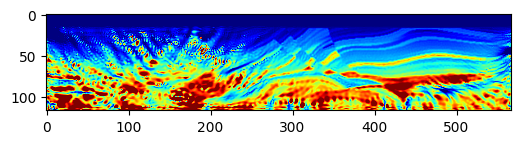

Epoch: 1361 Loss:  2402.0126953125 model_loss:  443183.2
Epoch: 1362 Loss:  2401.63818359375 model_loss:  443327.2
Epoch: 1363 Loss:  2401.58642578125 model_loss:  443474.62
Epoch: 1364 Loss:  2401.4512939453125 model_loss:  443621.03
Epoch: 1365 Loss:  2401.3656005859375 model_loss:  443765.5
Epoch: 1366 Loss:  2401.095458984375 model_loss:  443915.47
Epoch: 1367 Loss:  2400.831787109375 model_loss:  444061.8
Epoch: 1368 Loss:  2400.6123046875 model_loss:  444212.4
Epoch: 1369 Loss:  2400.2598876953125 model_loss:  444361.94
Epoch: 1370 Loss:  2400.3077392578125 model_loss:  444509.06


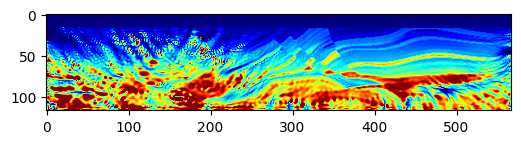

Epoch: 1371 Loss:  2399.93505859375 model_loss:  444661.16
Epoch: 1372 Loss:  2400.111328125 model_loss:  444806.5
Epoch: 1373 Loss:  2399.75048828125 model_loss:  444960.44
Epoch: 1374 Loss:  2399.8140869140625 model_loss:  445107.88
Epoch: 1375 Loss:  2399.532958984375 model_loss:  445262.38
Epoch: 1376 Loss:  2399.376220703125 model_loss:  445411.78
Epoch: 1377 Loss:  2399.2496337890625 model_loss:  445566.1
Epoch: 1378 Loss:  2398.9781494140625 model_loss:  445716.34
Epoch: 1379 Loss:  2398.942626953125 model_loss:  445870.53
Epoch: 1380 Loss:  2398.716552734375 model_loss:  446021.66


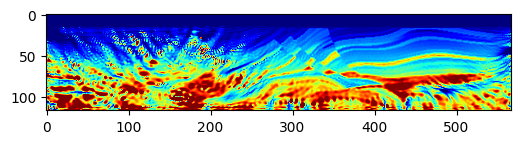

Epoch: 1381 Loss:  2398.6893310546875 model_loss:  446176.66
Epoch: 1382 Loss:  2398.5308837890625 model_loss:  446328.4
Epoch: 1383 Loss:  2398.45849609375 model_loss:  446483.34
Epoch: 1384 Loss:  2398.34326171875 model_loss:  446635.72
Epoch: 1385 Loss:  2398.2393798828125 model_loss:  446790.8
Epoch: 1386 Loss:  2398.140380859375 model_loss:  446943.72
Epoch: 1387 Loss:  2398.049072265625 model_loss:  447099.3
Epoch: 1388 Loss:  2397.94091796875 model_loss:  447252.66
Epoch: 1389 Loss:  2397.8553466796875 model_loss:  447408.6
Epoch: 1390 Loss:  2397.7188720703125 model_loss:  447562.34


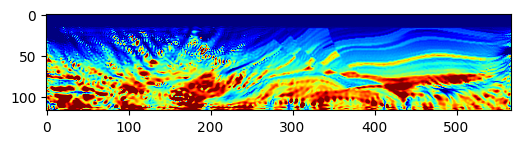

Epoch: 1391 Loss:  2397.635009765625 model_loss:  447718.0
Epoch: 1392 Loss:  2397.494873046875 model_loss:  447872.47
Epoch: 1393 Loss:  2397.404296875 model_loss:  448028.03
Epoch: 1394 Loss:  2397.289306640625 model_loss:  448183.03
Epoch: 1395 Loss:  2397.193359375 model_loss:  448338.6
Epoch: 1396 Loss:  2397.101806640625 model_loss:  448493.78
Epoch: 1397 Loss:  2396.989990234375 model_loss:  448649.78
Epoch: 1398 Loss:  2396.903076171875 model_loss:  448805.2
Epoch: 1399 Loss:  2396.7928466796875 model_loss:  448961.94
Epoch: 1400 Loss:  2396.698974609375 model_loss:  449117.53


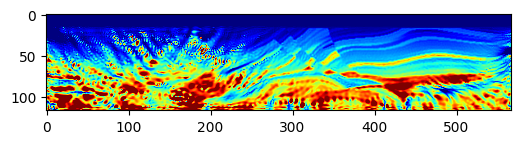

Epoch: 1401 Loss:  2396.6094970703125 model_loss:  449274.88
Epoch: 1402 Loss:  2396.4935302734375 model_loss:  449430.72
Epoch: 1403 Loss:  2396.428466796875 model_loss:  449588.0
Epoch: 1404 Loss:  2396.2811279296875 model_loss:  449744.47
Epoch: 1405 Loss:  2396.225341796875 model_loss:  449901.4
Epoch: 1406 Loss:  2396.0882568359375 model_loss:  450058.56
Epoch: 1407 Loss:  2396.02197265625 model_loss:  450215.1
Epoch: 1408 Loss:  2395.92041015625 model_loss:  450372.72
Epoch: 1409 Loss:  2395.81201171875 model_loss:  450529.4
Epoch: 1410 Loss:  2395.7386474609375 model_loss:  450687.3


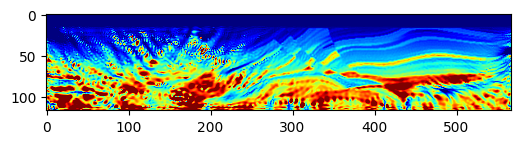

Epoch: 1411 Loss:  2395.60888671875 model_loss:  450844.72
Epoch: 1412 Loss:  2395.541748046875 model_loss:  451002.84
Epoch: 1413 Loss:  2395.4281005859375 model_loss:  451161.2
Epoch: 1414 Loss:  2395.347412109375 model_loss:  451319.75
Epoch: 1415 Loss:  2395.2677001953125 model_loss:  451478.5
Epoch: 1416 Loss:  2395.139892578125 model_loss:  451637.9
Epoch: 1417 Loss:  2395.081787109375 model_loss:  451796.53
Epoch: 1418 Loss:  2394.952880859375 model_loss:  451956.8
Epoch: 1419 Loss:  2394.893798828125 model_loss:  452115.12
Epoch: 1420 Loss:  2394.79443359375 model_loss:  452275.84


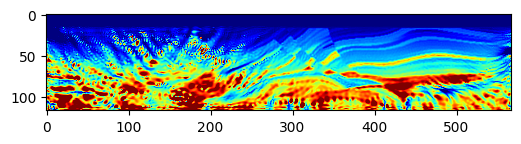

Epoch: 1421 Loss:  2394.679443359375 model_loss:  452434.5
Epoch: 1422 Loss:  2394.6116943359375 model_loss:  452595.12
Epoch: 1423 Loss:  2394.4691162109375 model_loss:  452754.66
Epoch: 1424 Loss:  2394.4373779296875 model_loss:  452914.56
Epoch: 1425 Loss:  2394.3184814453125 model_loss:  453074.88
Epoch: 1426 Loss:  2394.2559814453125 model_loss:  453234.47
Epoch: 1427 Loss:  2394.15869140625 model_loss:  453394.78
Epoch: 1428 Loss:  2394.02783203125 model_loss:  453555.06
Epoch: 1429 Loss:  2393.9842529296875 model_loss:  453714.84
Epoch: 1430 Loss:  2393.873779296875 model_loss:  453876.3


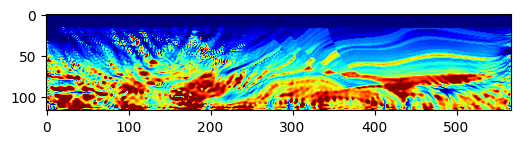

Epoch: 1431 Loss:  2393.8250732421875 model_loss:  454035.6
Epoch: 1432 Loss:  2393.723876953125 model_loss:  454197.1
Epoch: 1433 Loss:  2393.5909423828125 model_loss:  454357.03
Epoch: 1434 Loss:  2393.5616455078125 model_loss:  454517.44
Epoch: 1435 Loss:  2393.443359375 model_loss:  454678.97
Epoch: 1436 Loss:  2393.4769287109375 model_loss:  454838.03
Epoch: 1437 Loss:  2393.3671875 model_loss:  455000.5
Epoch: 1438 Loss:  2393.2525634765625 model_loss:  455159.25
Epoch: 1439 Loss:  2393.1925048828125 model_loss:  455321.0
Epoch: 1440 Loss:  2393.0850830078125 model_loss:  455481.0


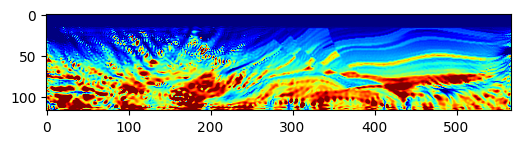

Epoch: 1441 Loss:  2393.201171875 model_loss:  455641.44
Epoch: 1442 Loss:  2393.11328125 model_loss:  455801.97
Epoch: 1443 Loss:  2393.0489501953125 model_loss:  455962.3
Epoch: 1444 Loss:  2392.983642578125 model_loss:  456120.53
Epoch: 1445 Loss:  2392.962890625 model_loss:  456281.84
Epoch: 1446 Loss:  2393.2803955078125 model_loss:  456435.4
Epoch: 1447 Loss:  2393.3612060546875 model_loss:  456595.75
Epoch: 1448 Loss:  2393.376220703125 model_loss:  456746.75
Epoch: 1449 Loss:  2393.2911376953125 model_loss:  456902.53
Epoch: 1450 Loss:  2393.235107421875 model_loss:  457055.97


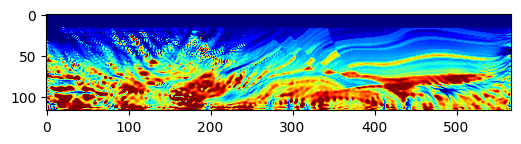

Epoch: 1451 Loss:  2393.83349609375 model_loss:  457207.25
Epoch: 1452 Loss:  2393.999755859375 model_loss:  457365.56
Epoch: 1453 Loss:  2394.08251953125 model_loss:  457516.94
Epoch: 1454 Loss:  2393.6806640625 model_loss:  457675.06
Epoch: 1455 Loss:  2393.7481689453125 model_loss:  457831.22
Epoch: 1456 Loss:  2394.7906494140625 model_loss:  457983.8
Epoch: 1457 Loss:  2395.6322021484375 model_loss:  458146.16
Epoch: 1458 Loss:  2395.72119140625 model_loss:  458296.4
Epoch: 1459 Loss:  2395.3392333984375 model_loss:  458461.2
Epoch: 1460 Loss:  2395.3958740234375 model_loss:  458614.25


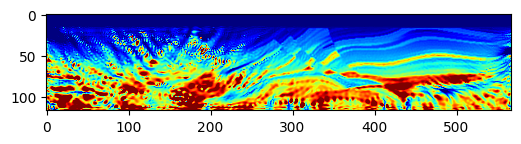

Epoch: 1461 Loss:  2398.041259765625 model_loss:  458774.75
Epoch: 1462 Loss:  2399.7132568359375 model_loss:  458932.78
Epoch: 1463 Loss:  2400.43505859375 model_loss:  459092.1
Epoch: 1464 Loss:  2398.882568359375 model_loss:  459248.88
Epoch: 1465 Loss:  2398.438720703125 model_loss:  459413.6
Epoch: 1466 Loss:  2401.4183349609375 model_loss:  459561.03
Epoch: 1467 Loss:  2404.292724609375 model_loss:  459734.62
Epoch: 1468 Loss:  2405.2489013671875 model_loss:  459876.2
Epoch: 1469 Loss:  2403.050048828125 model_loss:  460051.1
Epoch: 1470 Loss:  2400.92138671875 model_loss:  460195.94


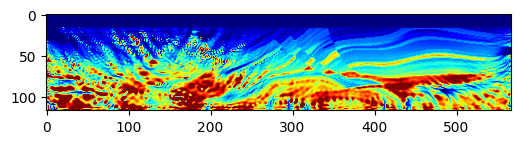

Epoch: 1471 Loss:  2403.692138671875 model_loss:  460356.97
Epoch: 1472 Loss:  2406.5 model_loss:  460519.6
Epoch: 1473 Loss:  2409.5494384765625 model_loss:  460669.88
Epoch: 1474 Loss:  2407.8328857421875 model_loss:  460839.53
Epoch: 1475 Loss:  2404.647705078125 model_loss:  460989.8
Epoch: 1476 Loss:  2403.8955078125 model_loss:  461146.25
Epoch: 1477 Loss:  2402.733642578125 model_loss:  461314.56
Epoch: 1478 Loss:  2406.100830078125 model_loss:  461454.62
Epoch: 1479 Loss:  2407.37841796875 model_loss:  461635.53
Epoch: 1480 Loss:  2407.8267822265625 model_loss:  461764.53


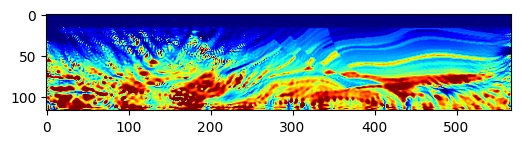

Epoch: 1481 Loss:  2406.5003662109375 model_loss:  461942.53
Epoch: 1482 Loss:  2401.67236328125 model_loss:  462080.1
Epoch: 1483 Loss:  2399.486328125 model_loss:  462244.34
Epoch: 1484 Loss:  2395.057861328125 model_loss:  462396.62
Epoch: 1485 Loss:  2394.9681396484375 model_loss:  462552.56
Epoch: 1486 Loss:  2393.6728515625 model_loss:  462711.34
Epoch: 1487 Loss:  2393.7535400390625 model_loss:  462862.75
Epoch: 1488 Loss:  2393.832275390625 model_loss:  463023.7
Epoch: 1489 Loss:  2393.0572509765625 model_loss:  463175.4
Epoch: 1490 Loss:  2393.13134765625 model_loss:  463336.53


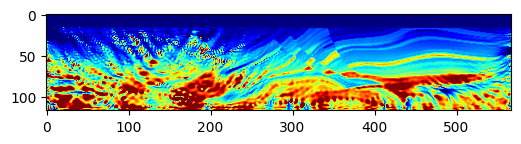

Epoch: 1491 Loss:  2391.6849365234375 model_loss:  463490.94
Epoch: 1492 Loss:  2391.5712890625 model_loss:  463653.38
Epoch: 1493 Loss:  2390.1697998046875 model_loss:  463809.34
Epoch: 1494 Loss:  2390.279541015625 model_loss:  463967.72
Epoch: 1495 Loss:  2389.53759765625 model_loss:  464125.9
Epoch: 1496 Loss:  2389.92626953125 model_loss:  464277.47
Epoch: 1497 Loss:  2389.775390625 model_loss:  464441.06
Epoch: 1498 Loss:  2390.0421142578125 model_loss:  464589.94
Epoch: 1499 Loss:  2390.283447265625 model_loss:  464758.0
Epoch: 1500 Loss:  2390.0919189453125 model_loss:  464906.34


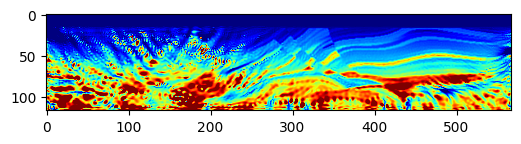

Epoch: 1501 Loss:  2390.45849609375 model_loss:  465073.0
Epoch: 1502 Loss:  2389.60546875 model_loss:  465221.94
Epoch: 1503 Loss:  2389.9736328125 model_loss:  465383.75
Epoch: 1504 Loss:  2388.7298583984375 model_loss:  465536.4
Epoch: 1505 Loss:  2389.1722412109375 model_loss:  465694.53
Epoch: 1506 Loss:  2388.18505859375 model_loss:  465853.53
Epoch: 1507 Loss:  2388.717041015625 model_loss:  466007.56
Epoch: 1508 Loss:  2388.4442138671875 model_loss:  466170.22
Epoch: 1509 Loss:  2388.74560546875 model_loss:  466320.62
Epoch: 1510 Loss:  2389.0606689453125 model_loss:  466484.22


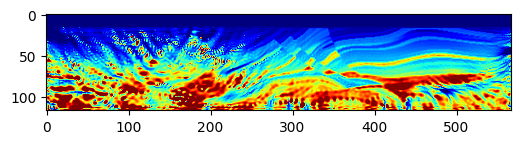

Epoch: 1511 Loss:  2388.7132568359375 model_loss:  466634.6
Epoch: 1512 Loss:  2389.173095703125 model_loss:  466796.6
Epoch: 1513 Loss:  2388.17529296875 model_loss:  466949.44
Epoch: 1514 Loss:  2388.581298828125 model_loss:  467107.0
Epoch: 1515 Loss:  2387.4573974609375 model_loss:  467264.22
Epoch: 1516 Loss:  2387.859619140625 model_loss:  467417.62
Epoch: 1517 Loss:  2387.1541748046875 model_loss:  467579.9
Epoch: 1518 Loss:  2387.5489501953125 model_loss:  467730.03
Epoch: 1519 Loss:  2387.41552734375 model_loss:  467894.78
Epoch: 1520 Loss:  2387.5172119140625 model_loss:  468043.12


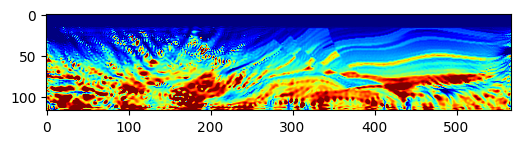

Epoch: 1521 Loss:  2387.71337890625 model_loss:  468207.53
Epoch: 1522 Loss:  2387.2369384765625 model_loss:  468356.62
Epoch: 1523 Loss:  2387.4771728515625 model_loss:  468518.6
Epoch: 1524 Loss:  2386.5396728515625 model_loss:  468670.72
Epoch: 1525 Loss:  2386.794921875 model_loss:  468829.0
Epoch: 1526 Loss:  2385.8590087890625 model_loss:  468985.5
Epoch: 1527 Loss:  2386.1744384765625 model_loss:  469140.34
Epoch: 1528 Loss:  2385.6285400390625 model_loss:  469300.9
Epoch: 1529 Loss:  2385.8795166015625 model_loss:  469453.06
Epoch: 1530 Loss:  2385.75439453125 model_loss:  469615.7


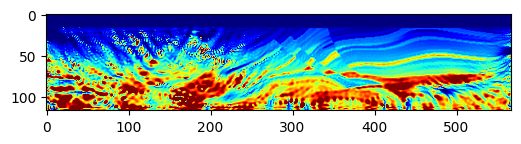

Epoch: 1531 Loss:  2385.7025146484375 model_loss:  469767.06
Epoch: 1532 Loss:  2385.79541015625 model_loss:  469929.22
Epoch: 1533 Loss:  2385.3359375 model_loss:  470081.6
Epoch: 1534 Loss:  2385.505859375 model_loss:  470240.88
Epoch: 1535 Loss:  2384.8446044921875 model_loss:  470396.03
Epoch: 1536 Loss:  2385.06201171875 model_loss:  470551.78
Epoch: 1537 Loss:  2384.5142822265625 model_loss:  470710.88
Epoch: 1538 Loss:  2384.7130126953125 model_loss:  470863.8
Epoch: 1539 Loss:  2384.4249267578125 model_loss:  471026.12
Epoch: 1540 Loss:  2384.447998046875 model_loss:  471177.88


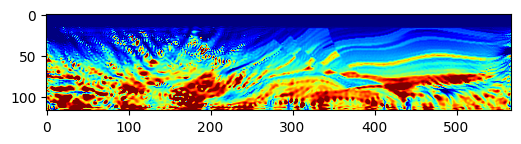

Epoch: 1541 Loss:  2384.361572265625 model_loss:  471341.12
Epoch: 1542 Loss:  2384.1181640625 model_loss:  471493.34
Epoch: 1543 Loss:  2384.125244140625 model_loss:  471655.03
Epoch: 1544 Loss:  2383.72119140625 model_loss:  471809.3
Epoch: 1545 Loss:  2383.790771484375 model_loss:  471968.25
Epoch: 1546 Loss:  2383.434326171875 model_loss:  472125.25
Epoch: 1547 Loss:  2383.5093994140625 model_loss:  472281.56
Epoch: 1548 Loss:  2383.289306640625 model_loss:  472441.03
Epoch: 1549 Loss:  2383.2626953125 model_loss:  472596.06
Epoch: 1550 Loss:  2383.143310546875 model_loss:  472756.53


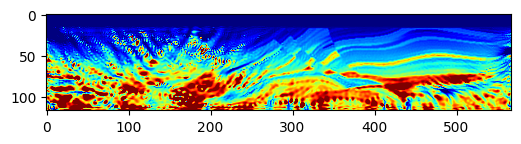

Epoch: 1551 Loss:  2383.002197265625 model_loss:  472911.8
Epoch: 1552 Loss:  2382.94677734375 model_loss:  473071.94
Epoch: 1553 Loss:  2382.7799072265625 model_loss:  473228.5
Epoch: 1554 Loss:  2382.741455078125 model_loss:  473387.38
Epoch: 1555 Loss:  2382.6219482421875 model_loss:  473545.1
Epoch: 1556 Loss:  2382.548095703125 model_loss:  473703.12
Epoch: 1557 Loss:  2382.4791259765625 model_loss:  473861.7
Epoch: 1558 Loss:  2382.343505859375 model_loss:  474019.97
Epoch: 1559 Loss:  2382.3082275390625 model_loss:  474178.6
Epoch: 1560 Loss:  2382.166748046875 model_loss:  474337.94


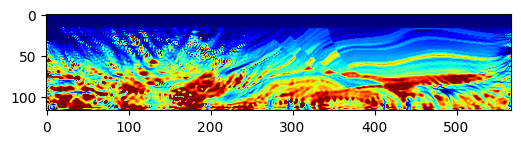

Epoch: 1561 Loss:  2382.125 model_loss:  474496.34
Epoch: 1562 Loss:  2382.0260009765625 model_loss:  474656.66
Epoch: 1563 Loss:  2381.92578125 model_loss:  474815.38
Epoch: 1564 Loss:  2381.875244140625 model_loss:  474976.16
Epoch: 1565 Loss:  2381.7154541015625 model_loss:  475135.94
Epoch: 1566 Loss:  2381.69287109375 model_loss:  475296.78
Epoch: 1567 Loss:  2381.539794921875 model_loss:  475458.12
Epoch: 1568 Loss:  2381.5155029296875 model_loss:  475618.53
Epoch: 1569 Loss:  2381.40185546875 model_loss:  475780.8
Epoch: 1570 Loss:  2381.3072509765625 model_loss:  475941.1


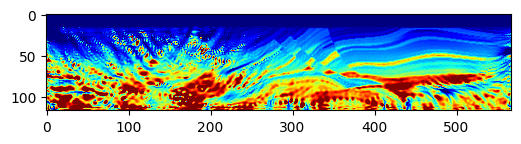

Epoch: 1571 Loss:  2381.24365234375 model_loss:  476103.22
Epoch: 1572 Loss:  2381.1044921875 model_loss:  476263.9
Epoch: 1573 Loss:  2381.064697265625 model_loss:  476425.44
Epoch: 1574 Loss:  2380.93408203125 model_loss:  476587.25
Epoch: 1575 Loss:  2380.8868408203125 model_loss:  476748.25
Epoch: 1576 Loss:  2380.801025390625 model_loss:  476910.28
Epoch: 1577 Loss:  2380.6864013671875 model_loss:  477071.53
Epoch: 1578 Loss:  2380.6385498046875 model_loss:  477233.1
Epoch: 1579 Loss:  2380.49853515625 model_loss:  477395.1
Epoch: 1580 Loss:  2380.4725341796875 model_loss:  477555.9


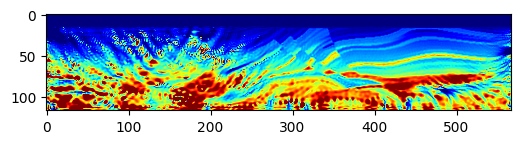

Epoch: 1581 Loss:  2380.36767578125 model_loss:  477718.84
Epoch: 1582 Loss:  2380.290771484375 model_loss:  477879.56
Epoch: 1583 Loss:  2380.21630859375 model_loss:  478042.34
Epoch: 1584 Loss:  2380.068115234375 model_loss:  478204.16
Epoch: 1585 Loss:  2380.0538330078125 model_loss:  478365.97
Epoch: 1586 Loss:  2379.92236328125 model_loss:  478529.53
Epoch: 1587 Loss:  2379.908447265625 model_loss:  478690.34
Epoch: 1588 Loss:  2379.8125 model_loss:  478854.78
Epoch: 1589 Loss:  2379.694091796875 model_loss:  479015.62
Epoch: 1590 Loss:  2379.6552734375 model_loss:  479179.6


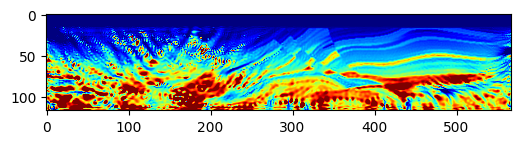

Epoch: 1591 Loss:  2379.514404296875 model_loss:  479341.34
Epoch: 1592 Loss:  2379.54052734375 model_loss:  479504.03
Epoch: 1593 Loss:  2379.427490234375 model_loss:  479666.2
Epoch: 1594 Loss:  2379.3780517578125 model_loss:  479828.12
Epoch: 1595 Loss:  2379.2977294921875 model_loss:  479989.44
Epoch: 1596 Loss:  2379.1763916015625 model_loss:  480152.7
Epoch: 1597 Loss:  2379.22119140625 model_loss:  480311.66
Epoch: 1598 Loss:  2379.1641845703125 model_loss:  480476.47
Epoch: 1599 Loss:  2379.1788330078125 model_loss:  480633.34
Epoch: 1600 Loss:  2379.1270751953125 model_loss:  480797.9


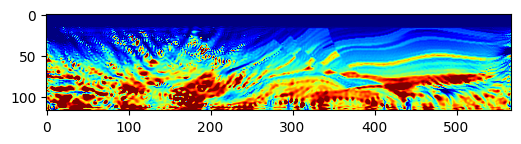

Epoch: 1601 Loss:  2378.978759765625 model_loss:  480955.03
Epoch: 1602 Loss:  2379.0699462890625 model_loss:  481116.8
Epoch: 1603 Loss:  2379.015869140625 model_loss:  481275.97
Epoch: 1604 Loss:  2379.2060546875 model_loss:  481434.75
Epoch: 1605 Loss:  2379.07470703125 model_loss:  481595.66
Epoch: 1606 Loss:  2378.980224609375 model_loss:  481754.9
Epoch: 1607 Loss:  2378.908935546875 model_loss:  481915.12
Epoch: 1608 Loss:  2378.95166015625 model_loss:  482077.75
Epoch: 1609 Loss:  2379.171142578125 model_loss:  482235.44
Epoch: 1610 Loss:  2379.2083740234375 model_loss:  482400.9


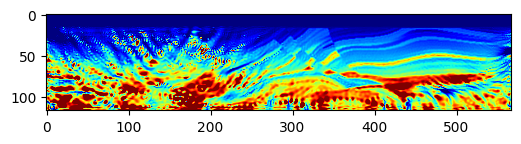

Epoch: 1611 Loss:  2378.9918212890625 model_loss:  482557.88
Epoch: 1612 Loss:  2379.02978515625 model_loss:  482724.1
Epoch: 1613 Loss:  2379.03076171875 model_loss:  482883.44
Epoch: 1614 Loss:  2379.8809814453125 model_loss:  483048.44
Epoch: 1615 Loss:  2380.012451171875 model_loss:  483210.28
Epoch: 1616 Loss:  2380.1011962890625 model_loss:  483376.5
Epoch: 1617 Loss:  2379.5885009765625 model_loss:  483536.06
Epoch: 1618 Loss:  2379.65234375 model_loss:  483707.5
Epoch: 1619 Loss:  2380.458984375 model_loss:  483861.44
Epoch: 1620 Loss:  2381.2711181640625 model_loss:  484037.88


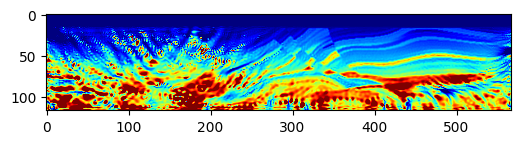

Epoch: 1621 Loss:  2381.315673828125 model_loss:  484189.4
Epoch: 1622 Loss:  2381.174072265625 model_loss:  484364.0
Epoch: 1623 Loss:  2381.381591796875 model_loss:  484520.22
Epoch: 1624 Loss:  2384.121337890625 model_loss:  484687.97
Epoch: 1625 Loss:  2386.141845703125 model_loss:  484852.06
Epoch: 1626 Loss:  2387.3280029296875 model_loss:  485016.94
Epoch: 1627 Loss:  2385.77392578125 model_loss:  485180.6
Epoch: 1628 Loss:  2384.30810546875 model_loss:  485352.12
Epoch: 1629 Loss:  2385.6083984375 model_loss:  485505.06
Epoch: 1630 Loss:  2387.702392578125 model_loss:  485688.44


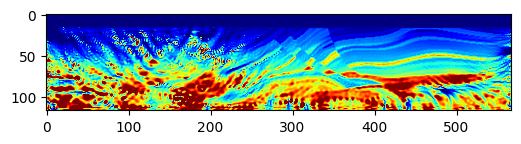

Epoch: 1631 Loss:  2389.218505859375 model_loss:  485833.8
Epoch: 1632 Loss:  2388.109619140625 model_loss:  486018.3
Epoch: 1633 Loss:  2385.9774169921875 model_loss:  486167.1
Epoch: 1634 Loss:  2386.911865234375 model_loss:  486337.28
Epoch: 1635 Loss:  2388.63671875 model_loss:  486504.62
Epoch: 1636 Loss:  2392.9703369140625 model_loss:  486658.66
Epoch: 1637 Loss:  2393.544189453125 model_loss:  486842.62
Epoch: 1638 Loss:  2392.2403564453125 model_loss:  486990.4
Epoch: 1639 Loss:  2390.185546875 model_loss:  487171.62
Epoch: 1640 Loss:  2387.321533203125 model_loss:  487330.22


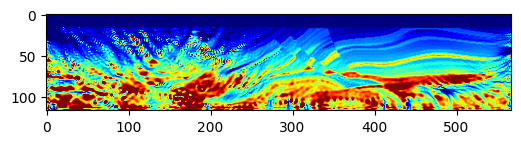

Epoch: 1641 Loss:  2389.195556640625 model_loss:  487494.3
Epoch: 1642 Loss:  2389.9346923828125 model_loss:  487670.66
Epoch: 1643 Loss:  2392.880615234375 model_loss:  487820.88
Epoch: 1644 Loss:  2393.567626953125 model_loss:  488007.5
Epoch: 1645 Loss:  2391.75439453125 model_loss:  488158.97
Epoch: 1646 Loss:  2390.9146728515625 model_loss:  488339.03
Epoch: 1647 Loss:  2386.612060546875 model_loss:  488501.56
Epoch: 1648 Loss:  2387.62548828125 model_loss:  488663.44
Epoch: 1649 Loss:  2385.420654296875 model_loss:  488838.78
Epoch: 1650 Loss:  2387.4814453125 model_loss:  488990.6


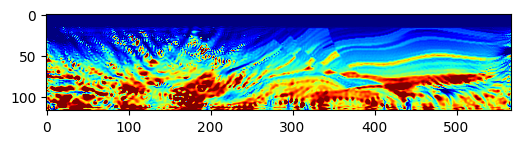

Epoch: 1651 Loss:  2387.6414794921875 model_loss:  489179.1
Epoch: 1652 Loss:  2387.85498046875 model_loss:  489323.78
Epoch: 1653 Loss:  2388.1787109375 model_loss:  489518.06
Epoch: 1654 Loss:  2385.3387451171875 model_loss:  489658.66
Epoch: 1655 Loss:  2385.056396484375 model_loss:  489851.16
Epoch: 1656 Loss:  2380.708740234375 model_loss:  489995.62
Epoch: 1657 Loss:  2380.458984375 model_loss:  490182.84
Epoch: 1658 Loss:  2377.6370849609375 model_loss:  490339.22
Epoch: 1659 Loss:  2378.3397216796875 model_loss:  490513.44
Epoch: 1660 Loss:  2378.1552734375 model_loss:  490682.5


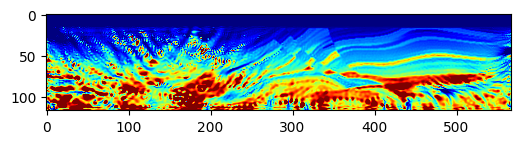

Epoch: 1661 Loss:  2379.167236328125 model_loss:  490846.28
Epoch: 1662 Loss:  2380.50048828125 model_loss:  491028.03
Epoch: 1663 Loss:  2380.783203125 model_loss:  491189.7
Epoch: 1664 Loss:  2382.4332275390625 model_loss:  491375.97
Epoch: 1665 Loss:  2381.345703125 model_loss:  491535.8
Epoch: 1666 Loss:  2382.757080078125 model_loss:  491717.0
Epoch: 1667 Loss:  2380.4403076171875 model_loss:  491877.5
Epoch: 1668 Loss:  2381.623046875 model_loss:  492054.0
Epoch: 1669 Loss:  2379.3106689453125 model_loss:  492220.16
Epoch: 1670 Loss:  2380.8251953125 model_loss:  492392.25


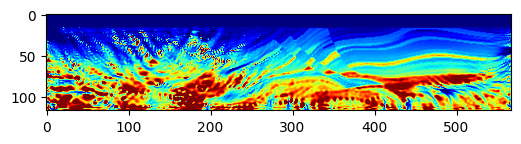

Epoch: 1671 Loss:  2380.220458984375 model_loss:  492567.12
Epoch: 1672 Loss:  2382.378173828125 model_loss:  492731.2
Epoch: 1673 Loss:  2384.069580078125 model_loss:  492918.7
Epoch: 1674 Loss:  2385.5809326171875 model_loss:  493072.47
Epoch: 1675 Loss:  2388.34912109375 model_loss:  493272.84
Epoch: 1676 Loss:  2387.2034912109375 model_loss:  493414.78
Epoch: 1677 Loss:  2389.5517578125 model_loss:  493622.88
Epoch: 1678 Loss:  2385.811767578125 model_loss:  493756.22
Epoch: 1679 Loss:  2387.18017578125 model_loss:  493965.88
Epoch: 1680 Loss:  2383.08056640625 model_loss:  494099.9


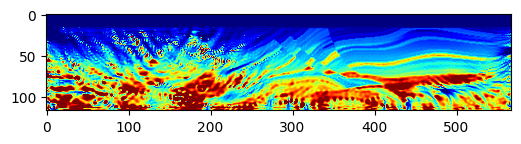

Epoch: 1681 Loss:  2383.7144775390625 model_loss:  494303.34
Epoch: 1682 Loss:  2381.399169921875 model_loss:  494449.88
Epoch: 1683 Loss:  2381.5155029296875 model_loss:  494637.62
Epoch: 1684 Loss:  2381.383544921875 model_loss:  494804.28
Epoch: 1685 Loss:  2380.46875 model_loss:  494970.97
Epoch: 1686 Loss:  2381.82666015625 model_loss:  495162.03
Epoch: 1687 Loss:  2379.630859375 model_loss:  495311.12
Epoch: 1688 Loss:  2381.936279296875 model_loss:  495522.62
Epoch: 1689 Loss:  2379.098388671875 model_loss:  495660.3
Epoch: 1690 Loss:  2381.2530517578125 model_loss:  495880.38


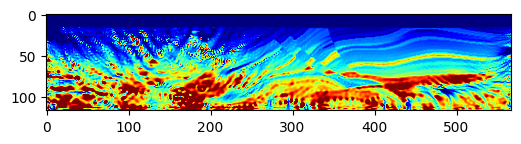

Epoch: 1691 Loss:  2378.3277587890625 model_loss:  496014.25
Epoch: 1692 Loss:  2379.1195068359375 model_loss:  496231.4
Epoch: 1693 Loss:  2376.6240234375 model_loss:  496372.72
Epoch: 1694 Loss:  2375.9609375 model_loss:  496578.6
Epoch: 1695 Loss:  2374.4996337890625 model_loss:  496737.06
Epoch: 1696 Loss:  2372.9765625 model_loss:  496927.94
Epoch: 1697 Loss:  2372.67236328125 model_loss:  497104.8
Epoch: 1698 Loss:  2370.876708984375 model_loss:  497282.94
Epoch: 1699 Loss:  2371.3782958984375 model_loss:  497474.62
Epoch: 1700 Loss:  2369.7728271484375 model_loss:  497646.12


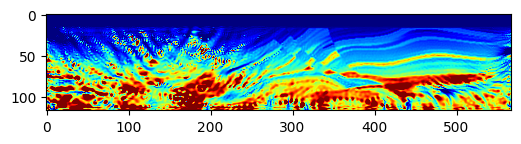

Epoch: 1701 Loss:  2370.537109375 model_loss:  497844.34
Epoch: 1702 Loss:  2369.3380126953125 model_loss:  498013.56
Epoch: 1703 Loss:  2369.92919921875 model_loss:  498212.66
Epoch: 1704 Loss:  2369.1451416015625 model_loss:  498382.97
Epoch: 1705 Loss:  2369.4085693359375 model_loss:  498579.56
Epoch: 1706 Loss:  2368.9295654296875 model_loss:  498752.38
Epoch: 1707 Loss:  2368.9296875 model_loss:  498944.75
Epoch: 1708 Loss:  2368.6688232421875 model_loss:  499120.9
Epoch: 1709 Loss:  2368.519775390625 model_loss:  499310.0
Epoch: 1710 Loss:  2368.395263671875 model_loss:  499489.62


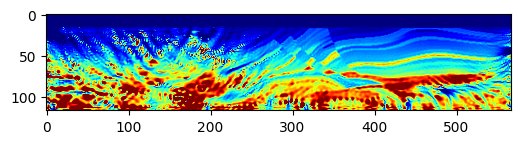

Epoch: 1711 Loss:  2368.2113037109375 model_loss:  499676.94
Epoch: 1712 Loss:  2368.1434326171875 model_loss:  499858.8
Epoch: 1713 Loss:  2367.960205078125 model_loss:  500045.94
Epoch: 1714 Loss:  2367.8890380859375 model_loss:  500229.47
Epoch: 1715 Loss:  2367.7525634765625 model_loss:  500417.12
Epoch: 1716 Loss:  2367.6649169921875 model_loss:  500601.0
Epoch: 1717 Loss:  2367.5391845703125 model_loss:  500788.5
Epoch: 1718 Loss:  2367.441650390625 model_loss:  500972.44
Epoch: 1719 Loss:  2367.3150634765625 model_loss:  501159.5
Epoch: 1720 Loss:  2367.2357177734375 model_loss:  501343.88


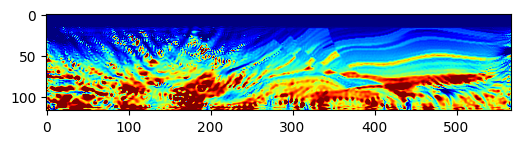

Epoch: 1721 Loss:  2367.0836181640625 model_loss:  501530.47
Epoch: 1722 Loss:  2367.0416259765625 model_loss:  501716.0
Epoch: 1723 Loss:  2366.85302734375 model_loss:  501902.28
Epoch: 1724 Loss:  2366.8397216796875 model_loss:  502089.0
Epoch: 1725 Loss:  2366.620849609375 model_loss:  502275.22
Epoch: 1726 Loss:  2366.62548828125 model_loss:  502463.2
Epoch: 1727 Loss:  2366.4075927734375 model_loss:  502649.56
Epoch: 1728 Loss:  2366.4000244140625 model_loss:  502838.3
Epoch: 1729 Loss:  2366.19775390625 model_loss:  503025.0
Epoch: 1730 Loss:  2366.1575927734375 model_loss:  503213.97


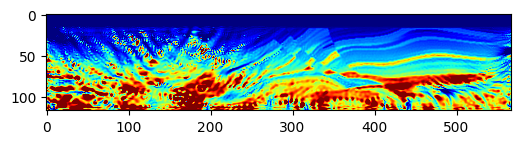

Epoch: 1731 Loss:  2365.99462890625 model_loss:  503401.22
Epoch: 1732 Loss:  2365.9171142578125 model_loss:  503590.22
Epoch: 1733 Loss:  2365.809326171875 model_loss:  503778.28
Epoch: 1734 Loss:  2365.6749267578125 model_loss:  503967.2
Epoch: 1735 Loss:  2365.607421875 model_loss:  504156.12
Epoch: 1736 Loss:  2365.4420166015625 model_loss:  504344.88
Epoch: 1737 Loss:  2365.4068603515625 model_loss:  504534.62
Epoch: 1738 Loss:  2365.21435546875 model_loss:  504723.34
Epoch: 1739 Loss:  2365.19140625 model_loss:  504913.62
Epoch: 1740 Loss:  2364.9884033203125 model_loss:  505102.44


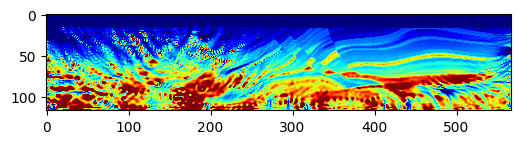

Epoch: 1741 Loss:  2364.9632568359375 model_loss:  505293.0
Epoch: 1742 Loss:  2364.7811279296875 model_loss:  505482.25
Epoch: 1743 Loss:  2364.710693359375 model_loss:  505672.72
Epoch: 1744 Loss:  2364.570556640625 model_loss:  505862.4
Epoch: 1745 Loss:  2364.472412109375 model_loss:  506052.5
Epoch: 1746 Loss:  2364.3751220703125 model_loss:  506242.4
Epoch: 1747 Loss:  2364.23974609375 model_loss:  506431.97
Epoch: 1748 Loss:  2364.16748046875 model_loss:  506622.16
Epoch: 1749 Loss:  2364.018310546875 model_loss:  506811.3
Epoch: 1750 Loss:  2363.970703125 model_loss:  507001.44


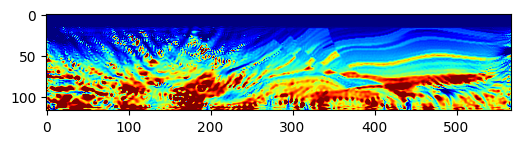

Epoch: 1751 Loss:  2363.807373046875 model_loss:  507190.62
Epoch: 1752 Loss:  2363.7646484375 model_loss:  507380.66
Epoch: 1753 Loss:  2363.6131591796875 model_loss:  507570.2
Epoch: 1754 Loss:  2363.5419921875 model_loss:  507759.9
Epoch: 1755 Loss:  2363.4295654296875 model_loss:  507949.9
Epoch: 1756 Loss:  2363.323486328125 model_loss:  508139.3
Epoch: 1757 Loss:  2363.24169921875 model_loss:  508329.97
Epoch: 1758 Loss:  2363.106201171875 model_loss:  508519.22
Epoch: 1759 Loss:  2363.0584716796875 model_loss:  508710.34
Epoch: 1760 Loss:  2362.89453125 model_loss:  508899.34


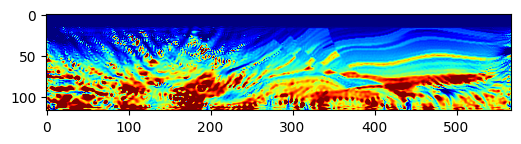

Epoch: 1761 Loss:  2362.8597412109375 model_loss:  509090.22
Epoch: 1762 Loss:  2362.683837890625 model_loss:  509279.03
Epoch: 1763 Loss:  2362.649169921875 model_loss:  509469.28
Epoch: 1764 Loss:  2362.4984130859375 model_loss:  509658.12
Epoch: 1765 Loss:  2362.42529296875 model_loss:  509847.66
Epoch: 1766 Loss:  2362.3157958984375 model_loss:  510036.53
Epoch: 1767 Loss:  2362.2017822265625 model_loss:  510225.34
Epoch: 1768 Loss:  2362.13037109375 model_loss:  510414.28
Epoch: 1769 Loss:  2361.98779296875 model_loss:  510602.56
Epoch: 1770 Loss:  2361.94287109375 model_loss:  510791.78


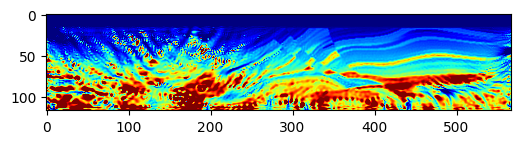

Epoch: 1771 Loss:  2361.778564453125 model_loss:  510980.1
Epoch: 1772 Loss:  2361.7401123046875 model_loss:  511169.4
Epoch: 1773 Loss:  2361.5802001953125 model_loss:  511358.12
Epoch: 1774 Loss:  2361.524658203125 model_loss:  511547.12
Epoch: 1775 Loss:  2361.4022216796875 model_loss:  511736.25
Epoch: 1776 Loss:  2361.3074951171875 model_loss:  511924.97
Epoch: 1777 Loss:  2361.215087890625 model_loss:  512114.4
Epoch: 1778 Loss:  2361.0855712890625 model_loss:  512302.75
Epoch: 1779 Loss:  2361.031005859375 model_loss:  512492.28
Epoch: 1780 Loss:  2360.8712158203125 model_loss:  512680.62


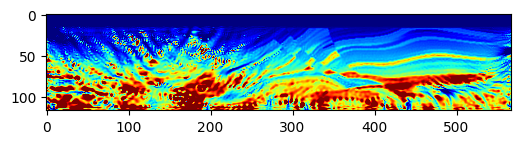

Epoch: 1781 Loss:  2360.8341064453125 model_loss:  512870.1
Epoch: 1782 Loss:  2360.669189453125 model_loss:  513058.62
Epoch: 1783 Loss:  2360.619873046875 model_loss:  513247.8
Epoch: 1784 Loss:  2360.4871826171875 model_loss:  513436.66
Epoch: 1785 Loss:  2360.4056396484375 model_loss:  513625.34
Epoch: 1786 Loss:  2360.30224609375 model_loss:  513814.62
Epoch: 1787 Loss:  2360.185791015625 model_loss:  514003.16
Epoch: 1788 Loss:  2360.1171875 model_loss:  514192.88
Epoch: 1789 Loss:  2359.9737548828125 model_loss:  514381.78
Epoch: 1790 Loss:  2359.9188232421875 model_loss:  514571.75


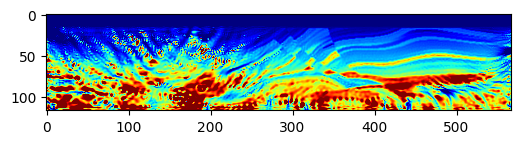

Epoch: 1791 Loss:  2359.773681640625 model_loss:  514761.44
Epoch: 1792 Loss:  2359.7091064453125 model_loss:  514952.0
Epoch: 1793 Loss:  2359.581298828125 model_loss:  515142.8
Epoch: 1794 Loss:  2359.4888916015625 model_loss:  515333.75
Epoch: 1795 Loss:  2359.397216796875 model_loss:  515525.6
Epoch: 1796 Loss:  2359.2752685546875 model_loss:  515717.03
Epoch: 1797 Loss:  2359.2039794921875 model_loss:  515909.22
Epoch: 1798 Loss:  2359.067626953125 model_loss:  516101.16
Epoch: 1799 Loss:  2358.9981689453125 model_loss:  516293.47
Epoch: 1800 Loss:  2358.8712158203125 model_loss:  516486.2


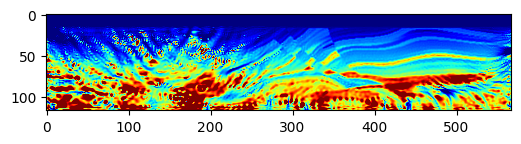

Epoch: 1801 Loss:  2358.7919921875 model_loss:  516678.28
Epoch: 1802 Loss:  2358.67626953125 model_loss:  516871.22
Epoch: 1803 Loss:  2358.5762939453125 model_loss:  517062.84
Epoch: 1804 Loss:  2358.490234375 model_loss:  517256.22
Epoch: 1805 Loss:  2358.37255859375 model_loss:  517447.94
Epoch: 1806 Loss:  2358.2855224609375 model_loss:  517641.7
Epoch: 1807 Loss:  2358.1761474609375 model_loss:  517833.53
Epoch: 1808 Loss:  2358.0789794921875 model_loss:  518027.6
Epoch: 1809 Loss:  2357.9990234375 model_loss:  518219.66
Epoch: 1810 Loss:  2357.8680419921875 model_loss:  518414.22


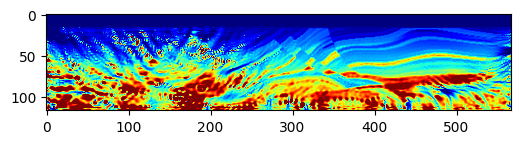

Epoch: 1811 Loss:  2357.8297119140625 model_loss:  518606.25
Epoch: 1812 Loss:  2357.688232421875 model_loss:  518801.97
Epoch: 1813 Loss:  2357.6900634765625 model_loss:  518993.12
Epoch: 1814 Loss:  2357.5546875 model_loss:  519189.53
Epoch: 1815 Loss:  2357.599365234375 model_loss:  519378.4
Epoch: 1816 Loss:  2357.4979248046875 model_loss:  519574.88
Epoch: 1817 Loss:  2357.600830078125 model_loss:  519760.9
Epoch: 1818 Loss:  2357.5206298828125 model_loss:  519955.72
Epoch: 1819 Loss:  2357.609619140625 model_loss:  520140.3
Epoch: 1820 Loss:  2357.46533203125 model_loss:  520331.72


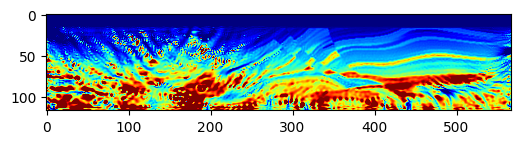

Epoch: 1821 Loss:  2357.452392578125 model_loss:  520518.75
Epoch: 1822 Loss:  2357.1964111328125 model_loss:  520707.2
Epoch: 1823 Loss:  2357.0830078125 model_loss:  520899.34
Epoch: 1824 Loss:  2356.803955078125 model_loss:  521087.34
Epoch: 1825 Loss:  2356.681884765625 model_loss:  521282.94
Epoch: 1826 Loss:  2356.492919921875 model_loss:  521474.1
Epoch: 1827 Loss:  2356.3465576171875 model_loss:  521671.38
Epoch: 1828 Loss:  2356.27197265625 model_loss:  521864.94
Epoch: 1829 Loss:  2356.046630859375 model_loss:  522062.1
Epoch: 1830 Loss:  2356.0457763671875 model_loss:  522258.25


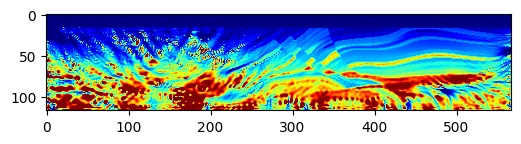

Epoch: 1831 Loss:  2355.7489013671875 model_loss:  522454.66
Epoch: 1832 Loss:  2355.74462890625 model_loss:  522654.28
Epoch: 1833 Loss:  2355.4898681640625 model_loss:  522850.06
Epoch: 1834 Loss:  2355.44921875 model_loss:  523051.47
Epoch: 1835 Loss:  2355.317138671875 model_loss:  523246.56
Epoch: 1836 Loss:  2355.172607421875 model_loss:  523446.75
Epoch: 1837 Loss:  2355.149658203125 model_loss:  523642.34
Epoch: 1838 Loss:  2354.9140625 model_loss:  523840.72
Epoch: 1839 Loss:  2354.92529296875 model_loss:  524037.75
Epoch: 1840 Loss:  2354.69384765625 model_loss:  524236.25


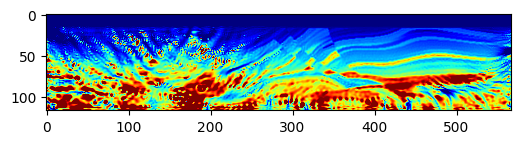

Epoch: 1841 Loss:  2354.676513671875 model_loss:  524434.6
Epoch: 1842 Loss:  2354.529296875 model_loss:  524635.25
Epoch: 1843 Loss:  2354.412109375 model_loss:  524835.2
Epoch: 1844 Loss:  2354.33984375 model_loss:  525037.44
Epoch: 1845 Loss:  2354.163330078125 model_loss:  525239.0
Epoch: 1846 Loss:  2354.121826171875 model_loss:  525441.8
Epoch: 1847 Loss:  2353.9853515625 model_loss:  525644.9
Epoch: 1848 Loss:  2353.883056640625 model_loss:  525847.06
Epoch: 1849 Loss:  2353.8009033203125 model_loss:  526050.7
Epoch: 1850 Loss:  2353.62548828125 model_loss:  526253.0


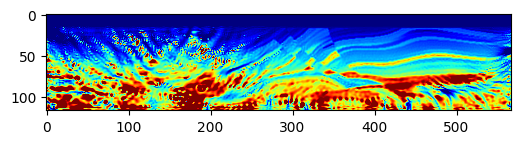

Epoch: 1851 Loss:  2353.56396484375 model_loss:  526456.3
Epoch: 1852 Loss:  2353.43994140625 model_loss:  526659.94
Epoch: 1853 Loss:  2353.343505859375 model_loss:  526862.6
Epoch: 1854 Loss:  2353.3077392578125 model_loss:  527067.44
Epoch: 1855 Loss:  2353.097900390625 model_loss:  527270.06
Epoch: 1856 Loss:  2353.059814453125 model_loss:  527474.0
Epoch: 1857 Loss:  2352.8992919921875 model_loss:  527678.06
Epoch: 1858 Loss:  2352.8419189453125 model_loss:  527880.0
Epoch: 1859 Loss:  2352.8902587890625 model_loss:  528085.75
Epoch: 1860 Loss:  2352.6341552734375 model_loss:  528286.6


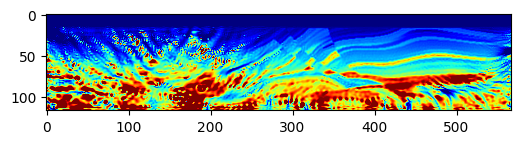

Epoch: 1861 Loss:  2352.711669921875 model_loss:  528492.25
Epoch: 1862 Loss:  2352.3837890625 model_loss:  528694.8
Epoch: 1863 Loss:  2352.49072265625 model_loss:  528897.44
Epoch: 1864 Loss:  2352.5709228515625 model_loss:  529103.4
Epoch: 1865 Loss:  2352.505126953125 model_loss:  529302.94
Epoch: 1866 Loss:  2352.6591796875 model_loss:  529510.7
Epoch: 1867 Loss:  2352.1817626953125 model_loss:  529710.8
Epoch: 1868 Loss:  2352.3599853515625 model_loss:  529916.44
Epoch: 1869 Loss:  2352.4991455078125 model_loss:  530120.94
Epoch: 1870 Loss:  2352.79541015625 model_loss:  530322.3


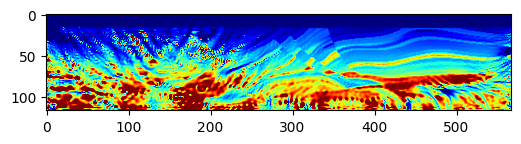

Epoch: 1871 Loss:  2353.1600341796875 model_loss:  530529.7
Epoch: 1872 Loss:  2352.560302734375 model_loss:  530730.56
Epoch: 1873 Loss:  2352.6658935546875 model_loss:  530935.3
Epoch: 1874 Loss:  2352.9832763671875 model_loss:  531140.9
Epoch: 1875 Loss:  2353.93310546875 model_loss:  531338.6
Epoch: 1876 Loss:  2355.194580078125 model_loss:  531548.44
Epoch: 1877 Loss:  2354.5435791015625 model_loss:  531744.06
Epoch: 1878 Loss:  2354.642333984375 model_loss:  531949.2
Epoch: 1879 Loss:  2354.7476806640625 model_loss:  532152.2
Epoch: 1880 Loss:  2356.8631591796875 model_loss:  532345.44


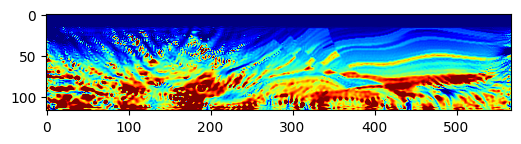

Epoch: 1881 Loss:  2359.61572265625 model_loss:  532558.9
Epoch: 1882 Loss:  2359.2452392578125 model_loss:  532746.1
Epoch: 1883 Loss:  2359.0322265625 model_loss:  532959.4
Epoch: 1884 Loss:  2358.0050048828125 model_loss:  533156.5
Epoch: 1885 Loss:  2361.7037353515625 model_loss:  533353.6
Epoch: 1886 Loss:  2366.9774169921875 model_loss:  533570.8
Epoch: 1887 Loss:  2368.5833740234375 model_loss:  533756.0
Epoch: 1888 Loss:  2368.4154052734375 model_loss:  533980.6
Epoch: 1889 Loss:  2364.1865234375 model_loss:  534170.56
Epoch: 1890 Loss:  2366.4442138671875 model_loss:  534377.06


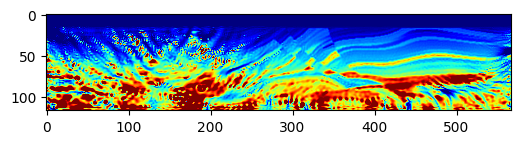

Epoch: 1891 Loss:  2369.133056640625 model_loss:  534591.44
Epoch: 1892 Loss:  2373.5694580078125 model_loss:  534777.3
Epoch: 1893 Loss:  2375.9019775390625 model_loss:  535011.7
Epoch: 1894 Loss:  2372.522216796875 model_loss:  535191.8
Epoch: 1895 Loss:  2371.8988037109375 model_loss:  535420.75
Epoch: 1896 Loss:  2366.174072265625 model_loss:  535608.1
Epoch: 1897 Loss:  2368.29052734375 model_loss:  535811.6
Epoch: 1898 Loss:  2366.7506103515625 model_loss:  536018.7
Epoch: 1899 Loss:  2370.452392578125 model_loss:  536205.0
Epoch: 1900 Loss:  2373.0123291015625 model_loss:  536436.9


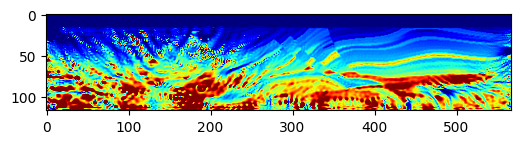

Epoch: 1901 Loss:  2371.5494384765625 model_loss:  536608.6
Epoch: 1902 Loss:  2372.6875 model_loss:  536853.56
Epoch: 1903 Loss:  2364.8065185546875 model_loss:  537010.4
Epoch: 1904 Loss:  2365.2703857421875 model_loss:  537247.94
Epoch: 1905 Loss:  2357.8914794921875 model_loss:  537411.5
Epoch: 1906 Loss:  2359.1317138671875 model_loss:  537632.44
Epoch: 1907 Loss:  2357.1131591796875 model_loss:  537828.25
Epoch: 1908 Loss:  2358.5845947265625 model_loss:  538025.44
Epoch: 1909 Loss:  2362.0643310546875 model_loss:  538257.8
Epoch: 1910 Loss:  2361.83349609375 model_loss:  538433.5


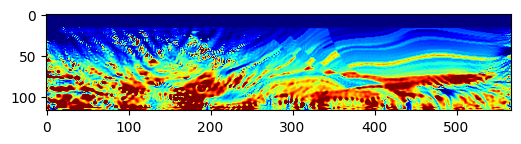

Epoch: 1911 Loss:  2366.100830078125 model_loss:  538682.0
Epoch: 1912 Loss:  2361.5313720703125 model_loss:  538842.3
Epoch: 1913 Loss:  2363.476318359375 model_loss:  539086.9
Epoch: 1914 Loss:  2356.8740234375 model_loss:  539247.06
Epoch: 1915 Loss:  2358.129150390625 model_loss:  539480.6
Epoch: 1916 Loss:  2354.003662109375 model_loss:  539656.06
Epoch: 1917 Loss:  2355.527587890625 model_loss:  539870.44
Epoch: 1918 Loss:  2354.883544921875 model_loss:  540071.4
Epoch: 1919 Loss:  2355.8426513671875 model_loss:  540263.1
Epoch: 1920 Loss:  2357.658447265625 model_loss:  540488.6


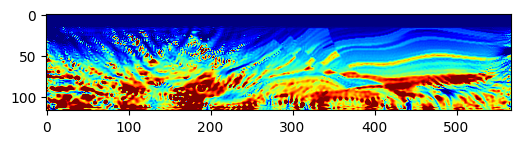

Epoch: 1921 Loss:  2356.9071044921875 model_loss:  540659.0
Epoch: 1922 Loss:  2360.209716796875 model_loss:  540901.2
Epoch: 1923 Loss:  2357.42333984375 model_loss:  541057.0
Epoch: 1924 Loss:  2361.1490478515625 model_loss:  541309.8
Epoch: 1925 Loss:  2356.826904296875 model_loss:  541459.75
Epoch: 1926 Loss:  2359.2706298828125 model_loss:  541712.0
Epoch: 1927 Loss:  2354.3939208984375 model_loss:  541862.6
Epoch: 1928 Loss:  2354.826416015625 model_loss:  542102.9
Epoch: 1929 Loss:  2351.1422119140625 model_loss:  542268.3
Epoch: 1930 Loss:  2350.14990234375 model_loss:  542489.56


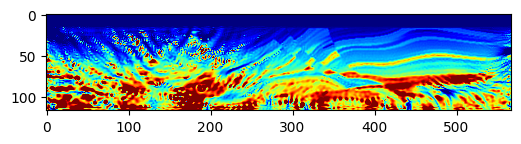

Epoch: 1931 Loss:  2348.6956787109375 model_loss:  542682.9
Epoch: 1932 Loss:  2346.754638671875 model_loss:  542884.25
Epoch: 1933 Loss:  2347.2265625 model_loss:  543103.3
Epoch: 1934 Loss:  2344.84423828125 model_loss:  543286.7
Epoch: 1935 Loss:  2346.361328125 model_loss:  543519.4
Epoch: 1936 Loss:  2344.0965576171875 model_loss:  543693.9
Epoch: 1937 Loss:  2345.619384765625 model_loss:  543927.4
Epoch: 1938 Loss:  2343.70947265625 model_loss:  544102.9
Epoch: 1939 Loss:  2344.6669921875 model_loss:  544330.0
Epoch: 1940 Loss:  2343.1854248046875 model_loss:  544511.3


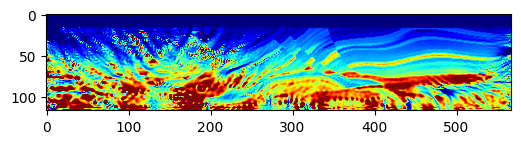

Epoch: 1941 Loss:  2343.5120849609375 model_loss:  544729.2
Epoch: 1942 Loss:  2342.5260009765625 model_loss:  544918.44
Epoch: 1943 Loss:  2342.458984375 model_loss:  545129.1
Epoch: 1944 Loss:  2341.9693603515625 model_loss:  545325.75
Epoch: 1945 Loss:  2341.6976318359375 model_loss:  545531.5
Epoch: 1946 Loss:  2341.5748291015625 model_loss:  545733.06
Epoch: 1947 Loss:  2341.197265625 model_loss:  545935.44
Epoch: 1948 Loss:  2341.2618408203125 model_loss:  546138.56
Epoch: 1949 Loss:  2340.86767578125 model_loss:  546339.06
Epoch: 1950 Loss:  2340.9859619140625 model_loss:  546542.3


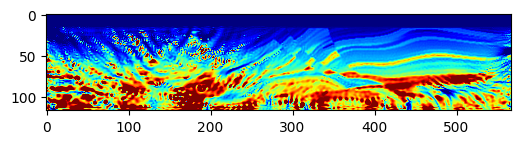

Epoch: 1951 Loss:  2340.624755859375 model_loss:  546742.0
Epoch: 1952 Loss:  2340.7320556640625 model_loss:  546945.56
Epoch: 1953 Loss:  2340.4068603515625 model_loss:  547145.2
Epoch: 1954 Loss:  2340.486083984375 model_loss:  547348.25
Epoch: 1955 Loss:  2340.206298828125 model_loss:  547548.44
Epoch: 1956 Loss:  2340.2476806640625 model_loss:  547750.56
Epoch: 1957 Loss:  2339.996826171875 model_loss:  547951.6
Epoch: 1958 Loss:  2340.014404296875 model_loss:  548153.4
Epoch: 1959 Loss:  2339.7900390625 model_loss:  548355.3
Epoch: 1960 Loss:  2339.7825927734375 model_loss:  548556.94


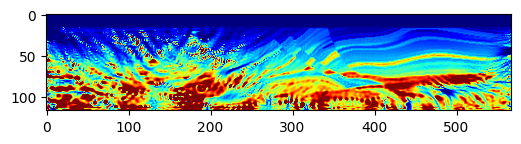

Epoch: 1961 Loss:  2339.5927734375 model_loss:  548759.0
Epoch: 1962 Loss:  2339.569091796875 model_loss:  548960.44
Epoch: 1963 Loss:  2339.3968505859375 model_loss:  549162.25
Epoch: 1964 Loss:  2339.3341064453125 model_loss:  549363.44
Epoch: 1965 Loss:  2339.210693359375 model_loss:  549565.06
Epoch: 1966 Loss:  2339.1168212890625 model_loss:  549765.94
Epoch: 1967 Loss:  2339.0130615234375 model_loss:  549967.75
Epoch: 1968 Loss:  2338.898193359375 model_loss:  550168.6
Epoch: 1969 Loss:  2338.8160400390625 model_loss:  550370.8
Epoch: 1970 Loss:  2338.6837158203125 model_loss:  550571.8


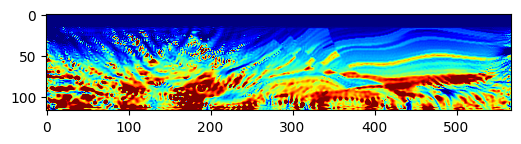

Epoch: 1971 Loss:  2338.6104736328125 model_loss:  550774.1
Epoch: 1972 Loss:  2338.4752197265625 model_loss:  550975.3
Epoch: 1973 Loss:  2338.396240234375 model_loss:  551177.8
Epoch: 1974 Loss:  2338.27490234375 model_loss:  551379.9
Epoch: 1975 Loss:  2338.17724609375 model_loss:  551582.94
Epoch: 1976 Loss:  2338.0740966796875 model_loss:  551785.8
Epoch: 1977 Loss:  2337.9625244140625 model_loss:  551989.3
Epoch: 1978 Loss:  2337.8709716796875 model_loss:  552193.0
Epoch: 1979 Loss:  2337.74853515625 model_loss:  552396.9
Epoch: 1980 Loss:  2337.66650390625 model_loss:  552600.4


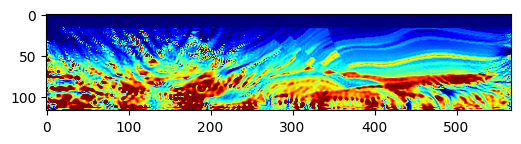

Epoch: 1981 Loss:  2337.5352783203125 model_loss:  552802.0
Epoch: 1982 Loss:  2337.4578857421875 model_loss:  553000.8
Epoch: 1983 Loss:  2337.3258056640625 model_loss:  553197.44
Epoch: 1984 Loss:  2337.248779296875 model_loss:  553394.25
Epoch: 1985 Loss:  2337.12939453125 model_loss:  553591.94
Epoch: 1986 Loss:  2337.0394287109375 model_loss:  553790.7
Epoch: 1987 Loss:  2336.9285888671875 model_loss:  553990.4
Epoch: 1988 Loss:  2336.8271484375 model_loss:  554189.25
Epoch: 1989 Loss:  2336.73583984375 model_loss:  554387.94
Epoch: 1990 Loss:  2336.6202392578125 model_loss:  554585.94


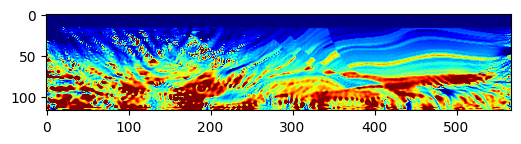

Epoch: 1991 Loss:  2336.5430908203125 model_loss:  554785.75
Epoch: 1992 Loss:  2336.409912109375 model_loss:  554985.3
Epoch: 1993 Loss:  2336.341064453125 model_loss:  555185.94
Epoch: 1994 Loss:  2336.2109375 model_loss:  555385.5
Epoch: 1995 Loss:  2336.13232421875 model_loss:  555586.0
Epoch: 1996 Loss:  2336.01611328125 model_loss:  555786.06
Epoch: 1997 Loss:  2335.921142578125 model_loss:  555986.6
Epoch: 1998 Loss:  2335.8233642578125 model_loss:  556187.06
Epoch: 1999 Loss:  2335.71923828125 model_loss:  556387.4
Epoch: 2000 Loss:  2335.6270751953125 model_loss:  556587.75


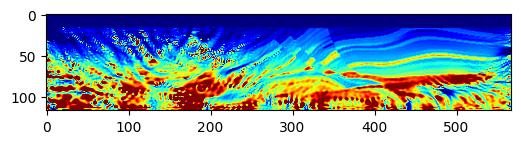

Runtime: 16.89733987649282


In [9]:
# Iterative inversion loop
t_start = time.time()
num_batches = 2 # split data into 2 batches for speed and reduced memory use
num_epochs = 2001 # Pass through the entire dataset 20001 times
model_loss = []
data_loss = []
for epoch in range(num_epochs):
    epoch_loss = 0.0
    
    for it in range(num_batches):
        optimizer.zero_grad()
        batch_src_amps = source_amplitudes[it::num_batches]
        batch_rcv_amps_true = receiver_amplitudes_true[it::num_batches].to(device)        
        batch_x_s = source_locations[it::num_batches].to(device)
        batch_x_r = receiver_locations[it::num_batches].to(device)
          
        out = scalar(
          model.T, dx, dt,
          source_amplitudes=batch_src_amps,
          source_locations=batch_x_s,
          receiver_locations=batch_x_r,
          pml_freq=freq,)
        
        batch_rcv_amps_pred = out[-1].permute(0, 2, 1)        
        u_obs = batch_rcv_amps_true
        u_pred = batch_rcv_amps_pred
        
        loss = criterion_data.forward(u_obs, u_pred)
        epoch_loss += loss.item()
        loss.backward()
        model.grad *= mask      
          
        optimizer.step()
    # scheduler.step()
    v_loss = criterion(model.cpu(),model_true.cpu()).detach().numpy()
    model_loss.append(v_loss.item())
    data_loss.append(epoch_loss)
    print('Epoch:', epoch, 'Loss: ', epoch_loss,'model_loss: ', v_loss)
    if epoch !=0 and epoch % 10 == 0:
        plt.figure(figsize=(6, 4))
        plt.imshow(model.cpu().detach().numpy(), vmin=1.5e3, vmax=4.5e3,
                   cmap='jet')
        plt.show()

t_end = time.time()
print('Runtime:', (t_end - t_start)/60)